In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

# 数据预处理

In [2]:
# 加载数据
medals_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_medal_counts.csv', encoding='ISO-8859-1')
hosts_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_hosts.csv')
programs_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_programs.csv', encoding='ISO-8859-1')
athletes_df = pd.read_csv(r'D:/mcm2025/data/raw/summerOly_athletes.csv', encoding='ISO-8859-1')

# 查看数据结构，确保正确加载
print(medals_df.head())
print(hosts_df.head())
print(programs_df.head())
print(athletes_df.head())


   Rank            NOC  Gold  Silver  Bronze  Total  Year
0     1  United States    11       7       2     20  1896
1     2         Greece    10      18      19     47  1896
2     3        Germany     6       5       2     13  1896
3     4         France     5       4       2     11  1896
4     5  Great Britain     2       3       2      7  1896
   Year                       Host
0  1896             Athens, Greece
1  1900              Paris, France
2  1904   St. Louis, United States
3  1908     London, United Kingdom
4  1912          Stockholm, Sweden
      Sport         Discipline Code Sports Governing Body 1896 1900 1904  \
0  Aquatics  Artistic Swimming  SWA        World Aquatics    0    0    0   
1  Aquatics             Diving  DIV        World Aquatics    0    0    2   
2  Aquatics  Marathon Swimming  OWS        World Aquatics    0    0    0   
3  Aquatics           Swimming  SWM        World Aquatics    4    7    9   
4  Aquatics         Water Polo  WPO        World Aquatics    0

In [3]:
# 检查缺失值
print(medals_df.isnull().sum())
print(hosts_df.isnull().sum())
print(programs_df.isnull().sum())
print(athletes_df.isnull().sum())

# 如果存在缺失值，根据情况填补或删除
medals_df.dropna(subset=['Gold', 'Silver', 'Bronze', 'Total'], inplace=True)
athletes_df.dropna(subset=['Name', 'Team', 'Medal'], inplace=True)


Rank      0
NOC       0
Gold      0
Silver    0
Bronze    0
Total     0
Year      0
dtype: int64
Year    0
Host    0
dtype: int64
Sport                    0
Discipline               2
Code                     0
Sports Governing Body    0
1896                     0
1900                     0
1904                     0
1906*                    0
1908                     0
1912                     0
1920                     0
1924                     0
1928                     2
1932                     2
1936                     2
1948                     2
1952                     2
1956                     2
1960                     2
1964                     2
1968                     2
1972                     2
1976                     2
1980                     2
1984                     2
1988                     3
1992                     2
1996                     2
2000                     2
2004                     2
2008                     2
2012                     2
2016  

In [4]:
# 将年份列转换为整数类型
medals_df['Year'] = medals_df['Year'].astype(int)
hosts_df['Year'] = hosts_df['Year'].astype(int)
athletes_df['Year'] = athletes_df['Year'].astype(int)

# 将奖牌数量转换为整数类型
medals_df['Gold'] = medals_df['Gold'].astype(int)
medals_df['Silver'] = medals_df['Silver'].astype(int)
medals_df['Bronze'] = medals_df['Bronze'].astype(int)
medals_df['Total'] = medals_df['Total'].astype(int)


In [5]:
# 合并奖牌数据和运动员数据
merged_df = pd.merge(athletes_df, medals_df, how='left', left_on=['NOC', 'Year'], right_on=['NOC', 'Year'])

# 检查合并后的数据
print(merged_df.head())


                    Name Sex            Team  NOC  Year         City  \
0              A Dijiang   M           China  CHN  1992    Barcelona   
1               A Lamusi   M           China  CHN  2012       London   
2            Gunnar Aaby   M         Denmark  DEN  1920    Antwerpen   
3            Edgar Aabye   M  Denmark/Sweden  DEN  1900        Paris   
4  Cornelia (-strannood)   F     Netherlands  NED  1932  Los Angeles   

        Sport                         Event     Medal  Rank  Gold  Silver  \
0  Basketball   Basketball Men's Basketball  No medal   NaN   NaN     NaN   
1        Judo  Judo Men's Extra-Lightweight  No medal   NaN   NaN     NaN   
2    Football       Football Men's Football  No medal   NaN   NaN     NaN   
3  Tug-Of-War   Tug-Of-War Men's Tug-Of-War      Gold   NaN   NaN     NaN   
4   Athletics  Athletics Women's 100 metres  No medal   NaN   NaN     NaN   

   Bronze  Total  
0     NaN    NaN  
1     NaN    NaN  
2     NaN    NaN  
3     NaN    NaN  
4     NaN

# 特征工程

In [6]:
# 合并东道主信息
merged_df = pd.merge(merged_df, hosts_df[['Year', 'Host']], how='left', on='Year')

# 如果没有主办国信息，则填充为0（不是东道主）
merged_df['Host'].fillna(0, inplace=True)

# 检查更新后的数据
print(merged_df.head())


                    Name Sex            Team  NOC  Year         City  \
0              A Dijiang   M           China  CHN  1992    Barcelona   
1               A Lamusi   M           China  CHN  2012       London   
2            Gunnar Aaby   M         Denmark  DEN  1920    Antwerpen   
3            Edgar Aabye   M  Denmark/Sweden  DEN  1900        Paris   
4  Cornelia (-strannood)   F     Netherlands  NED  1932  Los Angeles   

        Sport                         Event     Medal  Rank  Gold  Silver  \
0  Basketball   Basketball Men's Basketball  No medal   NaN   NaN     NaN   
1        Judo  Judo Men's Extra-Lightweight  No medal   NaN   NaN     NaN   
2    Football       Football Men's Football  No medal   NaN   NaN     NaN   
3  Tug-Of-War   Tug-Of-War Men's Tug-Of-War      Gold   NaN   NaN     NaN   
4   Athletics  Athletics Women's 100 metres  No medal   NaN   NaN     NaN   

   Bronze  Total                         Host  
0     NaN    NaN             Barcelona, Spain  
1     Na

In [7]:
# 为运动员创建一个新的列，表示奖牌类型
merged_df['Medal_Type'] = np.where(merged_df['Medal'] == 'Gold', 'Gold',
                                   np.where(merged_df['Medal'] == 'Silver', 'Silver',
                                            np.where(merged_df['Medal'] == 'Bronze', 'Bronze', 'No Medal')))

# 检查创建的奖牌类型列
print(merged_df[['Name', 'Medal_Type']].head())


                    Name Medal_Type
0              A Dijiang   No Medal
1               A Lamusi   No Medal
2            Gunnar Aaby   No Medal
3            Edgar Aabye       Gold
4  Cornelia (-strannood)   No Medal


In [8]:
# 计算国家的奖牌增速（例如金牌数量变化）
medals_df['Gold_Change'] = medals_df.groupby('NOC')['Gold'].pct_change()  # 使用百分比变化

# 如果是首次参加奥运会，设置增速为0
medals_df['Gold_Change'].fillna(0, inplace=True)

# 检查添加的增速特征
print(medals_df[['NOC', 'Year', 'Gold_Change']].head())


             NOC  Year  Gold_Change
0  United States  1896          0.0
1         Greece  1896          0.0
2        Germany  1896          0.0
3         France  1896          0.0
4  Great Britain  1896          0.0


In [9]:
# # 保存清洗后的数据
# merged_df.to_csv('cleaned_olympic_data.csv', index=False)


C:\Users\alanz\AppData\Local\Temp\ipykernel_44748\326999145.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Gold', y='NOC', data=medals_2024_sorted, palette='viridis')


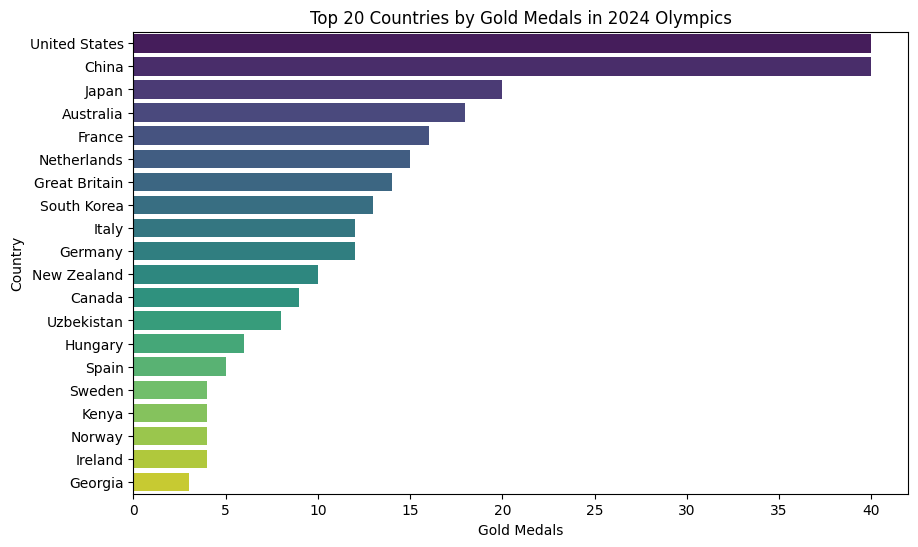

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# 假设我们分析的是2024年奥运会金牌数量的排名
year = 2024
top_n = 20  # 显示排名前20的国家

# 筛选数据
medals_2024 = medals_df[medals_df['Year'] == year]
medals_2024_sorted = medals_2024.sort_values(by='Gold', ascending=False).head(top_n)

# 绘制条形图
plt.figure(figsize=(10, 6))
sns.barplot(x='Gold', y='NOC', data=medals_2024_sorted, palette='viridis')
plt.title(f'Top {top_n} Countries by Gold Medals in {year} Olympics')
plt.xlabel('Gold Medals')
plt.ylabel('Country')
plt.show()


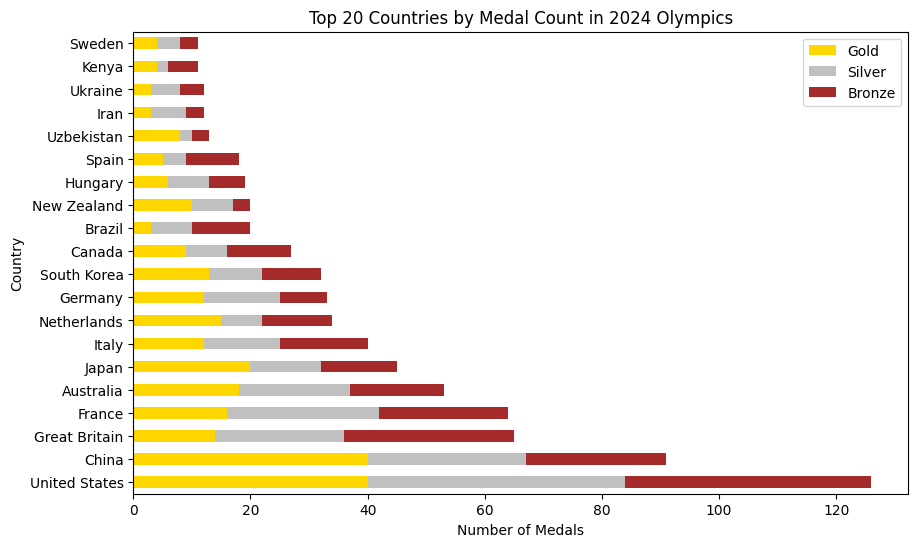

In [10]:
# 假设我们分析的是2024年奥运会的奖牌分布
medals_2024 = medals_df[medals_df['Year'] == 2024]
medals_2024_sorted = medals_2024.sort_values(by='Total', ascending=False).head(top_n)

# 堆叠条形图，显示金、银、铜奖牌比例
fig, ax = plt.subplots(figsize=(10, 6))
medals_2024_sorted.set_index('NOC')[['Gold', 'Silver', 'Bronze']].plot(kind='barh', stacked=True, ax=ax, color=['gold', 'silver', 'brown'])
plt.title(f'Top {top_n} Countries by Medal Count in {year} Olympics')
plt.xlabel('Number of Medals')
plt.ylabel('Country')
plt.show()


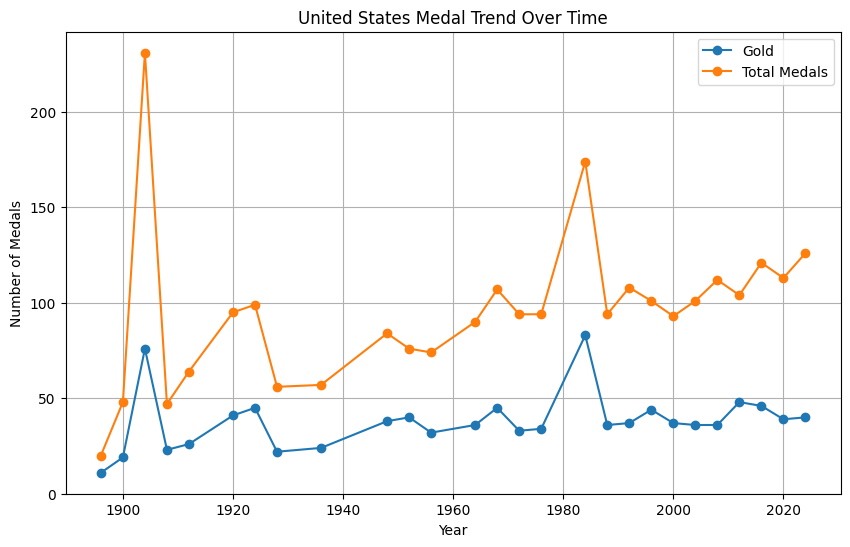

In [11]:
# 假设我们分析的是某个国家（例如美国）的奖牌数量变化趋势
country = 'United States'

# 筛选数据
usa_medals = medals_df[medals_df['NOC'] == country]

# 绘制折线图
plt.figure(figsize=(10, 6))
plt.plot(usa_medals['Year'], usa_medals['Gold'], label='Gold', marker='o')
plt.plot(usa_medals['Year'], usa_medals['Total'], label='Total Medals', marker='o')
plt.title(f'{country} Medal Trend Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Medals')
plt.legend()
plt.grid(True)
plt.show()


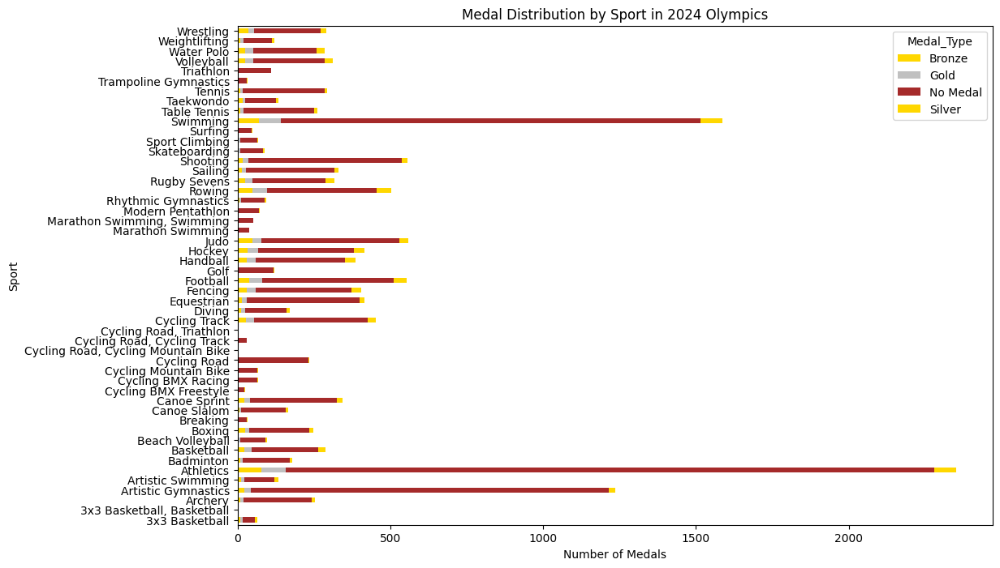

In [12]:
# 假设我们分析的是2024年奥运会的不同项目奖牌分布
year = 2024
projects = merged_df[merged_df['Year'] == year]

# 按照项目和奖牌类型进行汇总
project_medals = projects.groupby(['Sport', 'Medal_Type']).size().unstack(fill_value=0)

# 绘制堆叠条形图
project_medals.plot(kind='barh', stacked=True, figsize=(12, 8), color=['gold', 'silver', 'brown'])
plt.title(f'Medal Distribution by Sport in {year} Olympics')
plt.xlabel('Number of Medals')
plt.ylabel('Sport')
plt.show()


C:\Users\alanz\AppData\Local\Temp\ipykernel_44748\2352914429.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_increment_countries.index, y=top_increment_countries['Gold_Increment'], palette='coolwarm')


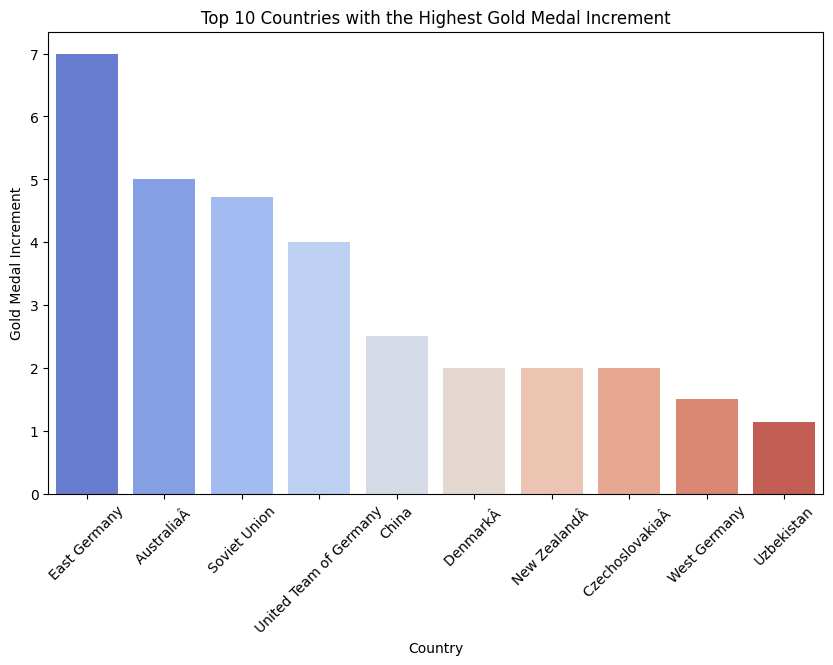

In [13]:
# 计算每个国家金牌的增量（即每届奥运会金牌数的差值）
medals_df['Gold_Increment'] = medals_df.groupby('NOC')['Gold'].diff()

# 按照增量排序，并展示前10名
top_increment_countries = medals_df.groupby('NOC').agg({'Gold_Increment': 'mean'}).sort_values(by='Gold_Increment', ascending=False).head(10)

# 绘制柱状图
plt.figure(figsize=(10, 6))
sns.barplot(x=top_increment_countries.index, y=top_increment_countries['Gold_Increment'], palette='coolwarm')
plt.title('Top 10 Countries with the Highest Gold Medal Increment')
plt.xlabel('Country')
plt.ylabel('Gold Medal Increment')
plt.xticks(rotation=45)
plt.show()


# 构建模型

In [14]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt


In [16]:
# 引入项目因素
events = pd.read_csv(r'D:\mcm2025\data\processed\events.csv')
events

,Year,Total events,Total disciplines,Total sports
0,1896,43,10,11
1,1900,97,22,20
2,1904,95,18,16
3,1906,76,13,11
4,1908,110,25,22
5,1912,102,18,14
6,1920,156,29,22
7,1924,126,23,17
8,1928,109,20,14
9,1932,117,20,14


## 去掉取消年份的比赛

In [17]:
hosts_df = pd.merge(hosts_df, events, on='Year', how='left')
hosts_df

,Year,Host,Total events,Total disciplines,Total sports
0,1896,"Athens, Greece",43.0,10.0,11.0
1,1900,"Paris, France",97.0,22.0,20.0
2,1904,"St. Louis, United States",95.0,18.0,16.0
3,1908,"London, United Kingdom",110.0,25.0,22.0
4,1912,"Stockholm, Sweden",102.0,18.0,14.0
5,1916,Cancelled (WWI – Berlin had been awarded),NaN,NaN,NaN
6,1920,"Antwerp, Belgium",156.0,29.0,22.0
7,1924,"Paris, France",126.0,23.0,17.0
8,1928,"Amsterdam, Netherlands",109.0,20.0,14.0
9,1932,"Los Angeles, United States",117.0,20.0,14.0


In [18]:
hosts_df.dropna(inplace=True)
hosts_df

,Year,Host,Total events,Total disciplines,Total sports
0,1896,"Athens, Greece",43.0,10.0,11.0
1,1900,"Paris, France",97.0,22.0,20.0
2,1904,"St. Louis, United States",95.0,18.0,16.0
3,1908,"London, United Kingdom",110.0,25.0,22.0
4,1912,"Stockholm, Sweden",102.0,18.0,14.0
6,1920,"Antwerp, Belgium",156.0,29.0,22.0
7,1924,"Paris, France",126.0,23.0,17.0
8,1928,"Amsterdam, Netherlands",109.0,20.0,14.0
9,1932,"Los Angeles, United States",117.0,20.0,14.0
10,1936,"Berlin, Germany",129.0,25.0,19.0


In [19]:
# 确保 'Host' 列是字符串类型
hosts_df['Host'] = hosts_df['Host'].astype(str)

# 使用 str.split 分割并处理缺失值
split_hosts = hosts_df['Host'].str.split(',', expand=True)

# 检查是否分割成功，如果是两列就分别赋值给 'City' 和 'NOC'
if split_hosts.shape[1] == 2:
    hosts_df['City'] = split_hosts[0].str.strip()  # City是分割后的第1列
    hosts_df['NOC'] = split_hosts[1].str.strip()   # NOC是分割后的第2列
else:
    # 如果某些行没有正确分割，填充缺失值或输出警告
    hosts_df['City'] = split_hosts[0].str.strip()  # 即使不符合预期，仍处理City列
    hosts_df['NOC'] = None  # 给NOC列赋缺失值，表示数据不正确
hosts_df
# 添加host列到medals_df
medals_df['host'] = medals_df.apply(
    lambda row: 1 if row['Year'] in hosts_df['Year'].values and row['NOC'] in hosts_df[hosts_df['Year'] == row['Year']]['NOC'].values else 0,
    axis=1
)

medals_df

,Rank,NOC,Gold,Silver,Bronze,Total,Year,Gold_Change,Gold_Increment,host
0,1,United States,11,7,2,20,1896,0.0,NaN,0
1,2,Greece,10,18,19,47,1896,0.0,NaN,1
2,3,Germany,6,5,2,13,1896,0.0,NaN,0
3,4,France,5,4,2,11,1896,0.0,NaN,0
4,5,Great Britain,2,3,2,7,1896,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...
1430,84,Qatar,0,0,1,1,2024,-1.0,-2.0,0
1431,84,Refugee Olympic Team,0,0,1,1,2024,0.0,NaN,0
1432,84,Singapore,0,0,1,1,2024,-1.0,-1.0,0
1433,84,Slovakia,0,0,1,1,2024,-1.0,-1.0,0


In [20]:
# years = list(range(1986, 2025, 4))

grouped_by_noc = medals_df.groupby('NOC')

# 创建一个新的DataFrame用来存储填充后的数据
filled_data = []

# 遍历每个国家
for noc, group in grouped_by_noc:
    # 创建该国家的完整年份数据
    full_years = pd.DataFrame({'Year': hosts_df['Year']})
    
    # 合并该国家的原始数据和完整年份数据
    full_group = pd.merge(full_years, group, on='Year', how='left')
 
    full_group['NOC'] = noc
    full_group['Gold'] = full_group['Gold'].fillna(0)
    full_group['Rank'] = full_group['Rank'].fillna(100)
    full_group['Silver'] = full_group['Silver'].fillna(0)
    full_group['Bronze'] = full_group['Bronze'].fillna(0)
    full_group['Total'] = full_group['Total'].fillna(0)
    full_group['host'] = full_group['host'].fillna(0)
    
    # 将填充后的数据添加到最终的DataFrame中
    filled_data.append(full_group)

# 合并所有国家的数据
final_filled_df = pd.concat(filled_data, ignore_index=True)

final_filled_df = pd.merge(final_filled_df, hosts_df[['Year', 'Total events', 'Total disciplines', 'Total sports']], on='Year', how='left')

# 查看填充后的数据
final_filled_df

,Year,Rank,NOC,Gold,Silver,Bronze,Total,Gold_Change,Gold_Increment,host,Total events,Total disciplines,Total sports
0,1896,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,43.0,10.0,11.0
1,1900,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,97.0,22.0,20.0
2,1904,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,95.0,18.0,16.0
3,1908,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,110.0,25.0,22.0
4,1912,100.0,Afghanistan,0.0,0.0,0.0,0.0,NaN,NaN,0.0,102.0,18.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,2008,38.0,Zimbabwe,1.0,3.0,0.0,4.0,0.0,0.0,0.0,302.0,42.0,27.0
6296,2012,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,302.0,40.0,26.0
6297,2016,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,306.0,42.0,28.0
6298,2020,100.0,Zimbabwe,0.0,0.0,0.0,0.0,NaN,NaN,0.0,339.0,50.0,33.0


In [21]:
# 计算gold——increment

# Gold_Increment 是当前金牌和上一届金牌的差值
final_filled_df['Gold_Increment'] = final_filled_df['Gold'] - final_filled_df['Gold'].shift(1, fill_value=0)

# Gold_Change 是 Gold_Increment / 上一届的金牌数
final_filled_df['Gold_Change'] = final_filled_df['Gold_Increment'] 

final_filled_df

,Year,Rank,NOC,Gold,Silver,Bronze,Total,Gold_Change,Gold_Increment,host,Total events,Total disciplines,Total sports
0,1896,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,10.0,11.0
1,1900,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,97.0,22.0,20.0
2,1904,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,95.0,18.0,16.0
3,1908,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,110.0,25.0,22.0
4,1912,100.0,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,102.0,18.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,2008,38.0,Zimbabwe,1.0,3.0,0.0,4.0,0.0,0.0,0.0,302.0,42.0,27.0
6296,2012,100.0,Zimbabwe,0.0,0.0,0.0,0.0,-1.0,-1.0,0.0,302.0,40.0,26.0
6297,2016,100.0,Zimbabwe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,306.0,42.0,28.0
6298,2020,100.0,Zimbabwe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,339.0,50.0,33.0


In [22]:
# 泊松分布
def custom_round(value):
    integer_part = np.floor(value)
    decimal_part = value - integer_part
    
    if np.random.rand() < decimal_part: 
        return integer_part + 1
    else:
        return integer_part

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# 用于存储预测结果
predictions = {}

# 预测年份范围：我们将预测2028年奥运会的金牌、银牌和铜牌数
future_years = [2028]

# 对每个国家进行时序预测
for noc, group in grouped_by_noc:
    # 确保数据按年份排序
    group = group.sort_values(by='Year')
    
    # 选取金牌数、银牌数和铜牌数作为目标变量
    gold_data = group[['Year', 'Gold']].set_index('Year')
    silver_data = group[['Year', 'Silver']].set_index('Year')
    bronze_data = group[['Year', 'Bronze']].set_index('Year')
    
    # 删除任何缺失的年份数据
    gold_data = gold_data.dropna()
    silver_data = silver_data.dropna()
    bronze_data = bronze_data.dropna()

    # 创建ARIMA模型并拟合数据
    gold_model = ARIMA(gold_data, order=(5, 1, 0))
    silver_model = ARIMA(silver_data, order=(5, 1, 0))
    bronze_model = ARIMA(bronze_data, order=(5, 1, 0))
    
    gold_model_fit = gold_model.fit()
    silver_model_fit = silver_model.fit()
    bronze_model_fit = bronze_model.fit()

    # 对未来年份进行预测
    gold_forecast = gold_model_fit.forecast(steps=len(future_years))
    silver_forecast = silver_model_fit.forecast(steps=len(future_years))
    bronze_forecast = bronze_model_fit.forecast(steps=len(future_years))

    # 确保预测结果不是空的
    if len(gold_forecast) > 0:
        gold_forecast = np.array([custom_round(v) for v in gold_forecast])
    else:
        gold_forecast = np.array([0] * len(future_years))

    if len(silver_forecast) > 0:
        silver_forecast = np.array([custom_round(v) for v in silver_forecast])
    else:
        silver_forecast = np.array([0] * len(future_years))

    if len(bronze_forecast) > 0:
        bronze_forecast = np.array([custom_round(v) for v in bronze_forecast])
    else:
        bronze_forecast = np.array([0] * len(future_years))

    # 计算总奖牌数
    total_forecast = gold_forecast + silver_forecast + bronze_forecast

    # 保存预测结果
    predictions[noc] = {
        'Year': future_years,
        'Gold_Predicted': gold_forecast,
        'Silver_Predicted': silver_forecast,
        'Bronze_Predicted': bronze_forecast,
        'Total_Predicted': total_forecast
    }

    # 可视化：将实际数据和预测数据一起显示
    plt.figure(figsize=(10, 6))
    
    plt.plot(gold_data.index, gold_data['Gold'], label='Actual Gold Medals')
    plt.plot(bronze_data.index, bronze_data['Bronze'], label='Actual Bronze Medals', marker='o')
    plt.plot(silver_data.index, silver_data['Silver'], label='Actual Silver Medals', linestyle='--')
    
    plt.plot(future_years, gold_forecast, label='Predicted Gold Medals (2028)', color='gold', marker='o')
    plt.plot(future_years, silver_forecast, label='Predicted Silver Medals (2028)', color='silver', marker='o')
    plt.plot(future_years, bronze_forecast, label='Predicted Bronze Medals (2028)', color='brown', marker='o')
    plt.plot(future_years, total_forecast, label='Total Predicted Medals (2028)', color='black', marker='o')

    plt.title(f'{noc} Medal Prediction for 2028')
    plt.xlabel('Year')
    plt.ylabel('Medals')
    plt.legend()
    plt.show()

# 将所有预测结果存储到一个DataFrame中
predictions_df = pd.DataFrame(columns=['NOC', 'Year', 'Gold_Predicted', 'Silver_Predicted', 'Bronze_Predicted', 'Total_Predicted'])
for noc, prediction in predictions.items():
    temp_df = pd.DataFrame({
        'NOC': [noc] * len(prediction['Year']),
        'Year': prediction['Year'],
        'Gold_Predicted': prediction['Gold_Predicted'],
        'Silver_Predicted': prediction['Silver_Predicted'],
        'Bronze_Predicted': prediction['Bronze_Predicted'],
        'Total_Predicted': prediction['Total_Predicted']
    })
    predictions_df = pd.concat([predictions_df, temp_df], ignore_index=True)

# 查看最终的预测结果
print(predictions_df)

# 如果需要将预测结果保存为CSV
# predictions_df.to_csv('predictions_2028_medals.csv', index=False)


c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

IndexError: too many indices for array: array is 0-dimensional, but 1 were indexed

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

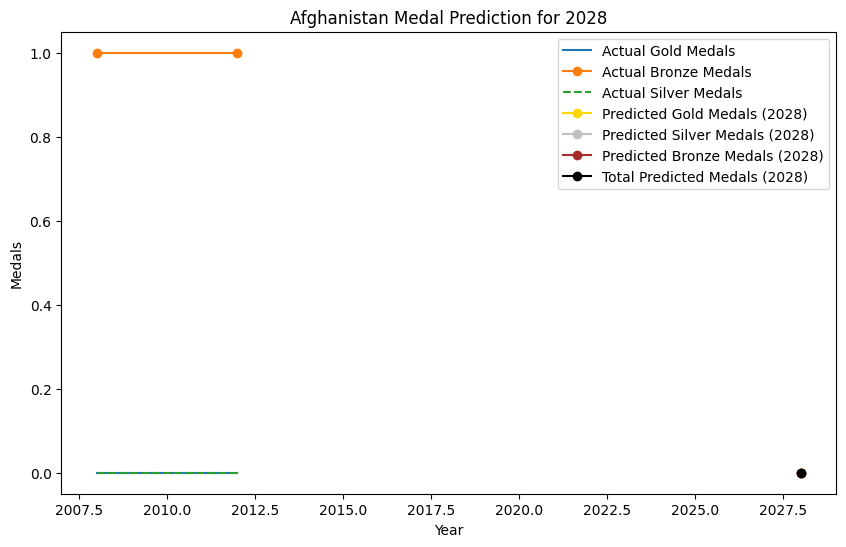

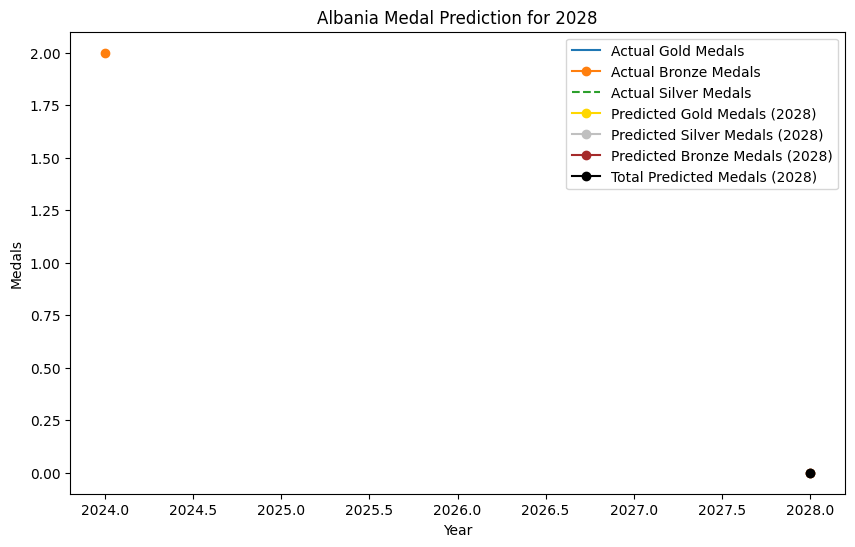

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

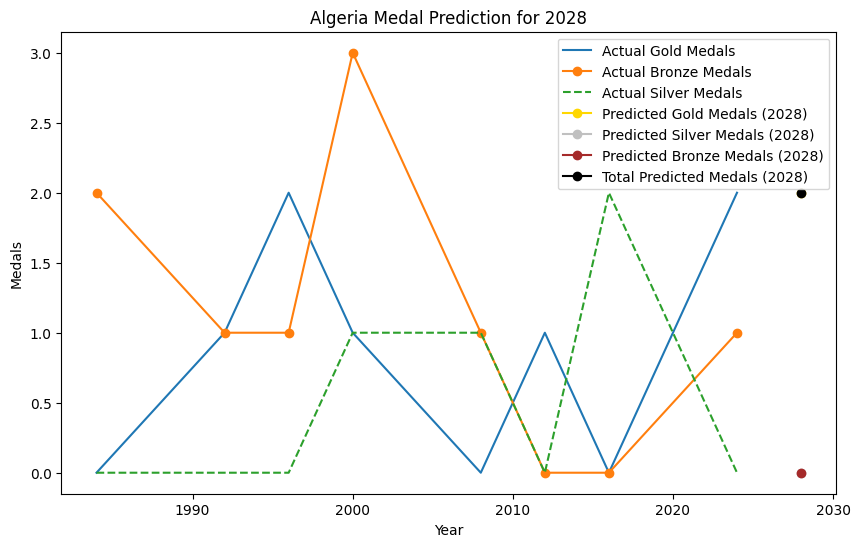

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

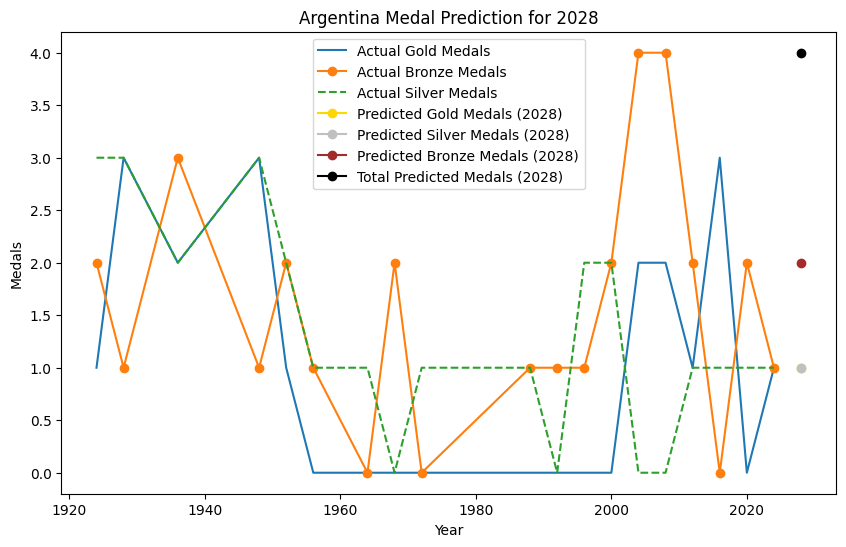

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

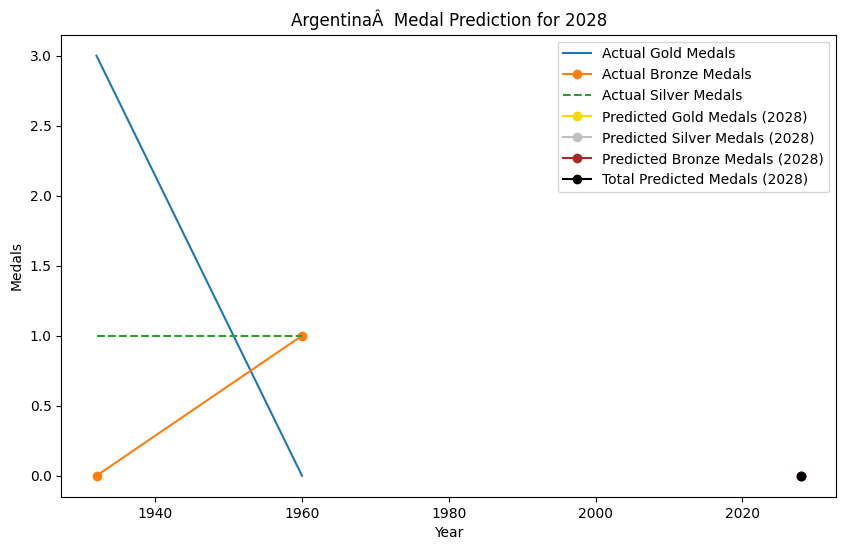

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

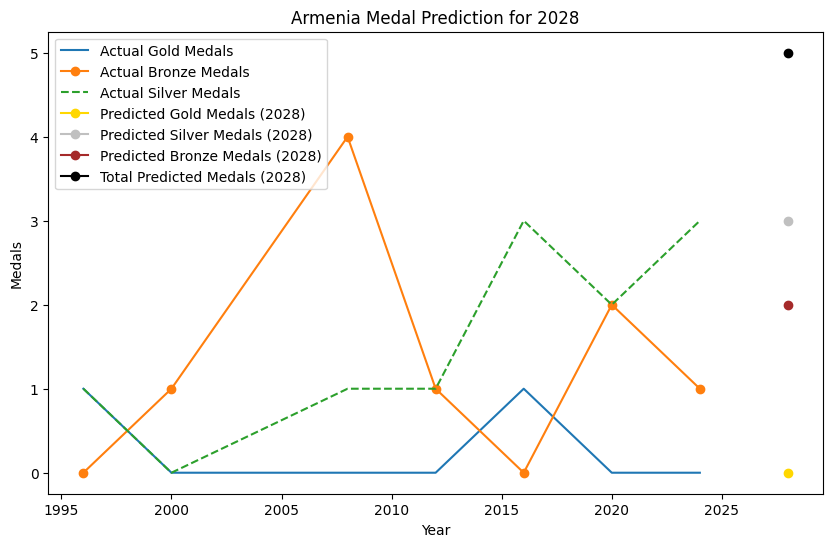

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

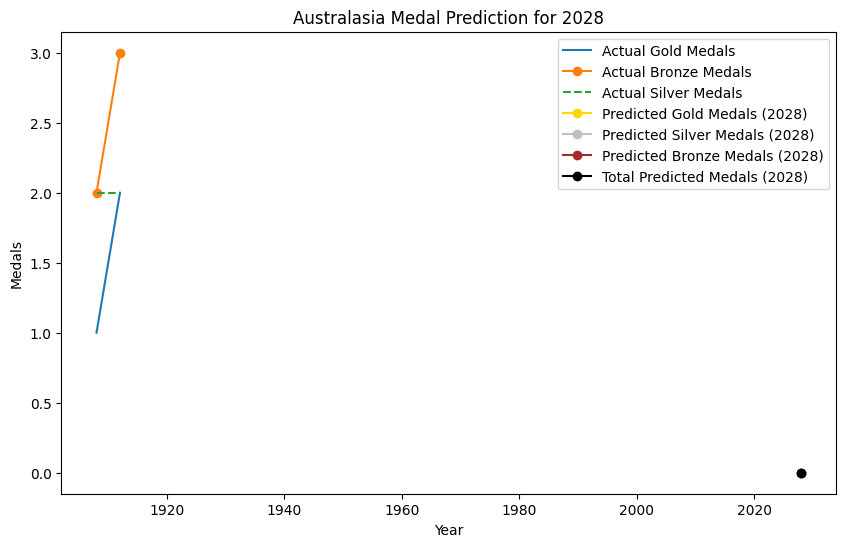

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

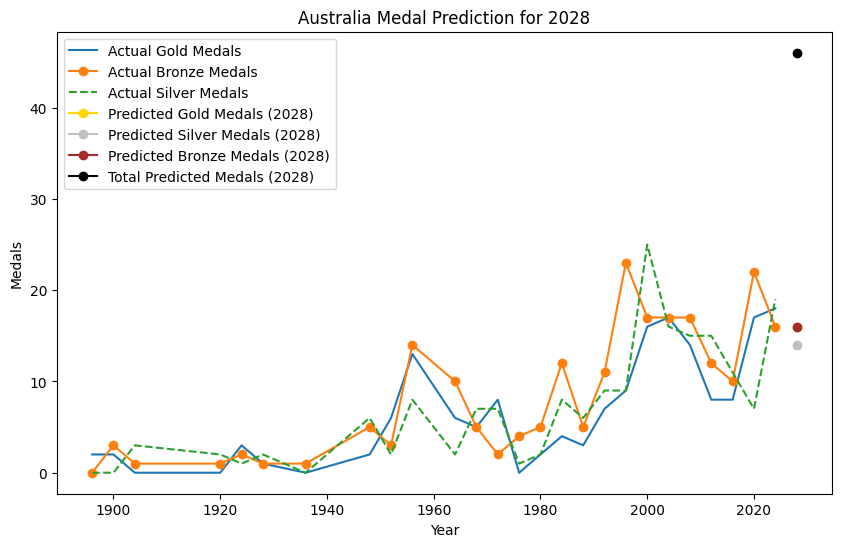

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

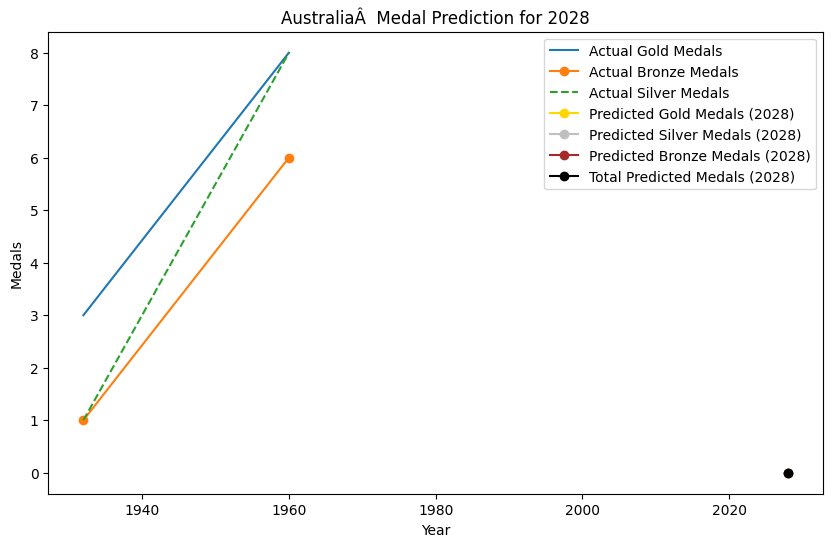

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

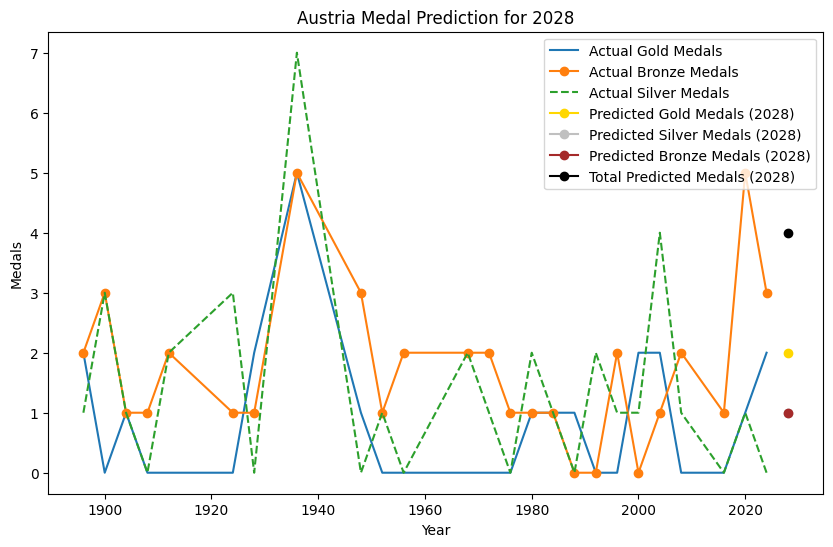

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

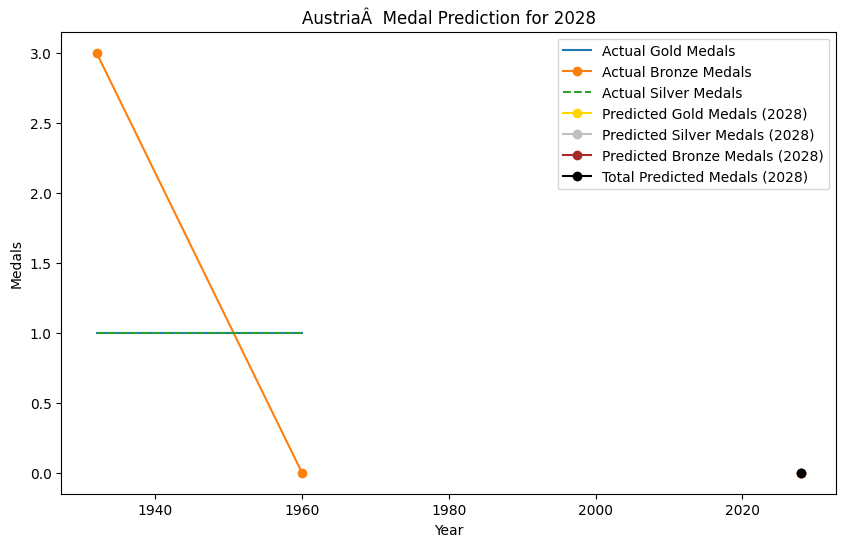

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

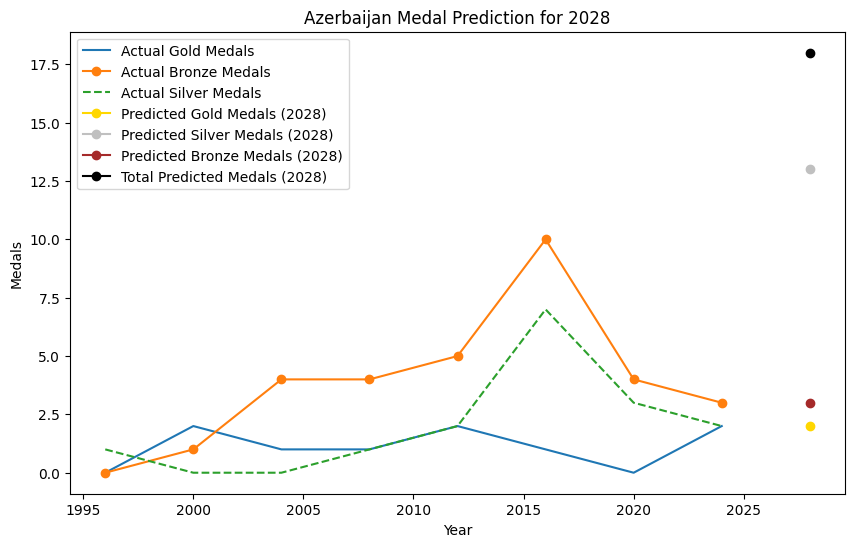

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

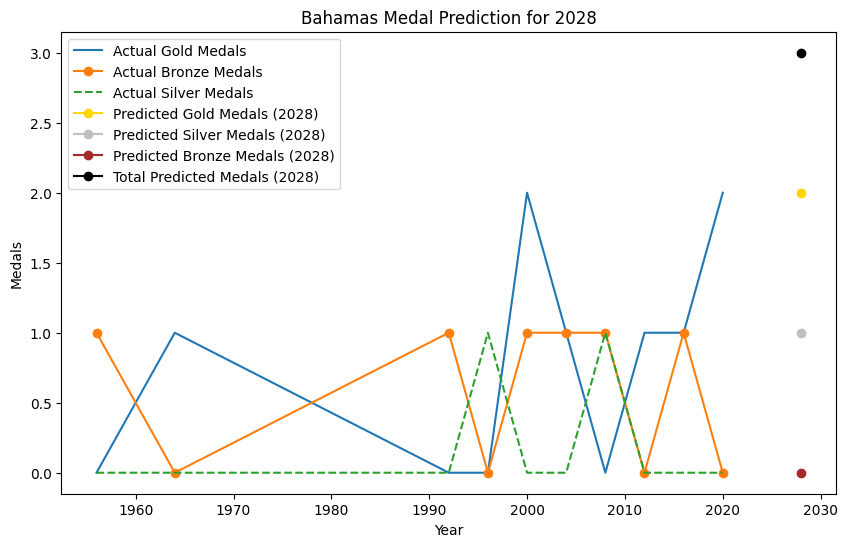

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

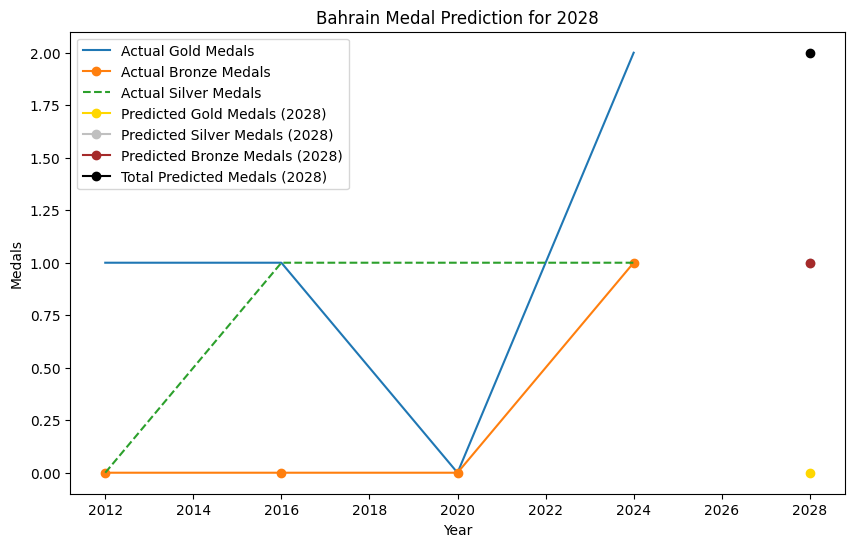

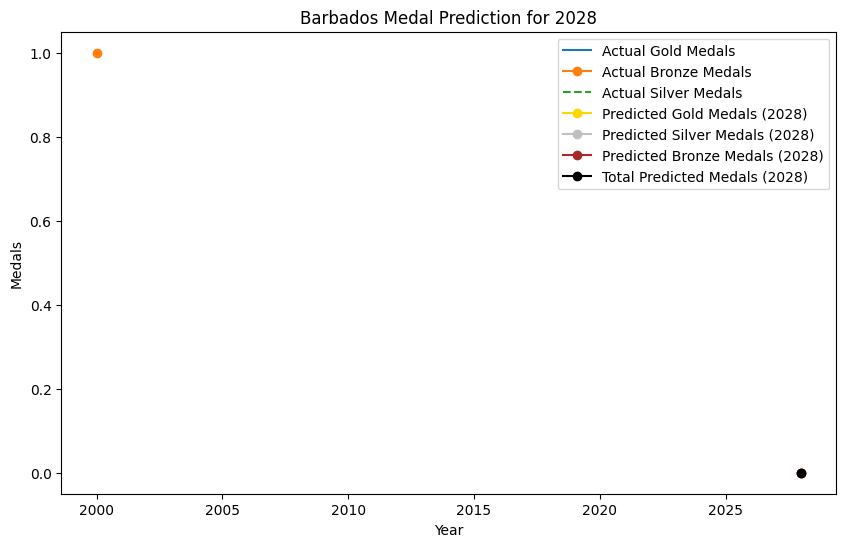

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

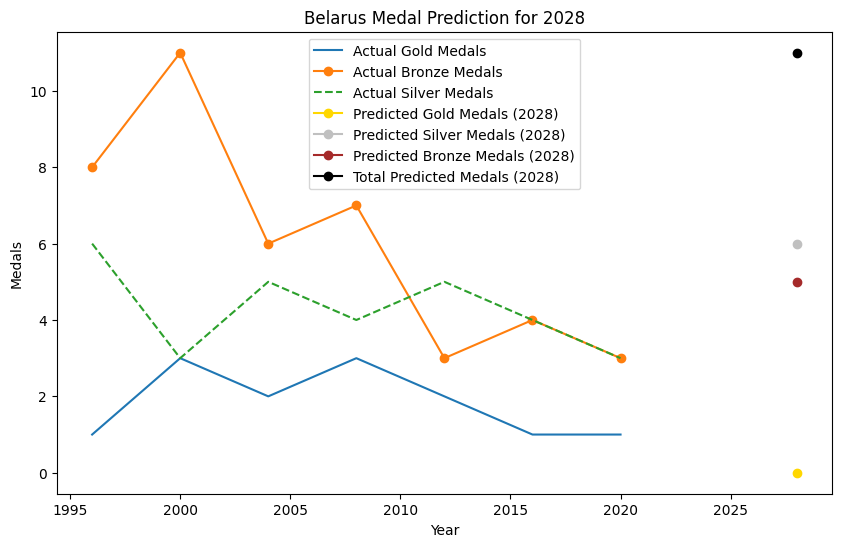

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

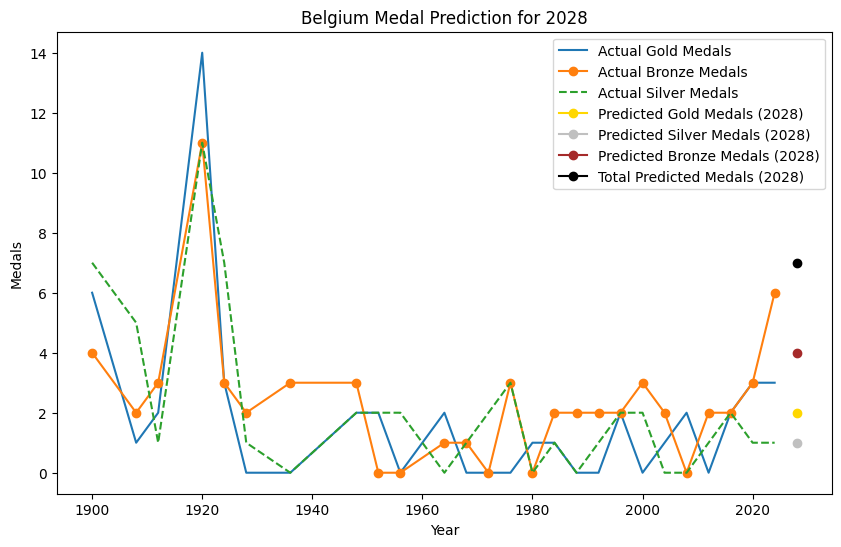

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

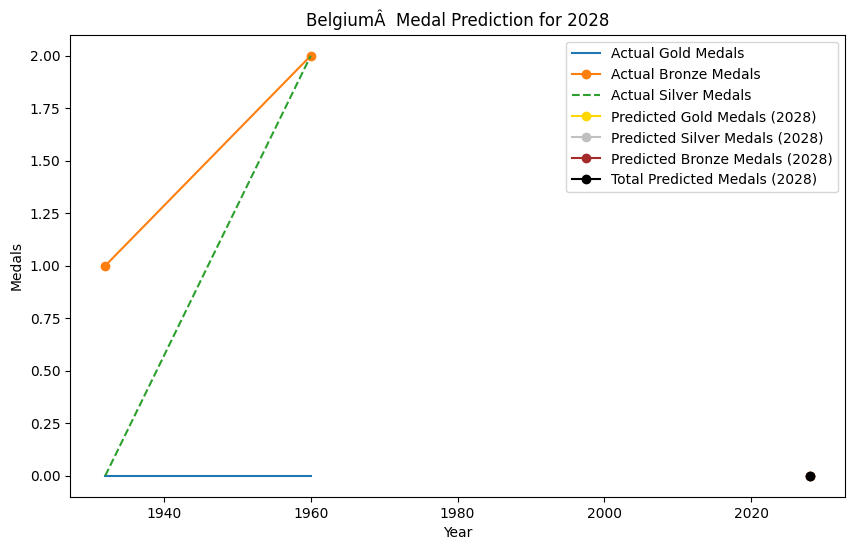

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

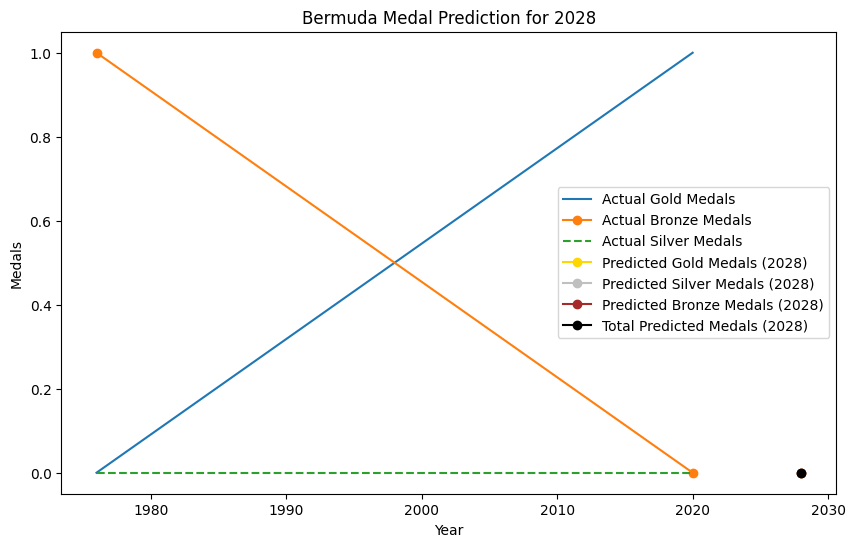

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

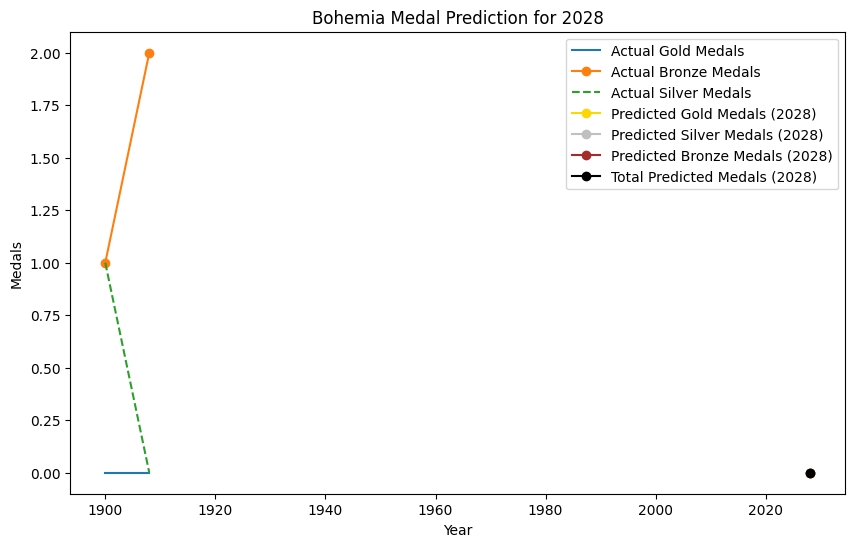

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

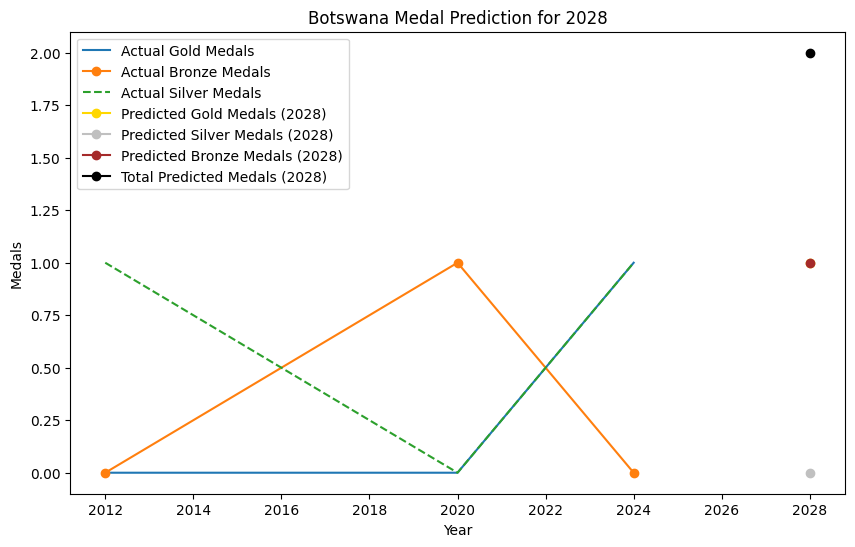

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

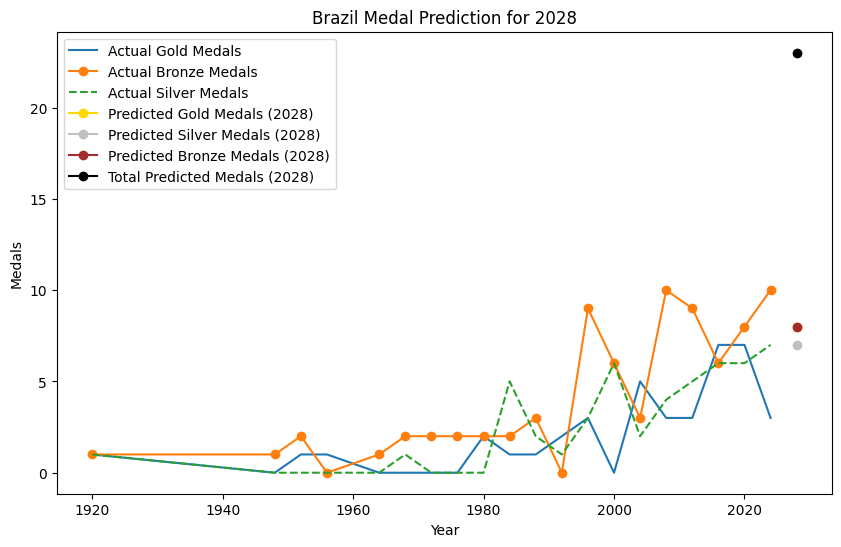

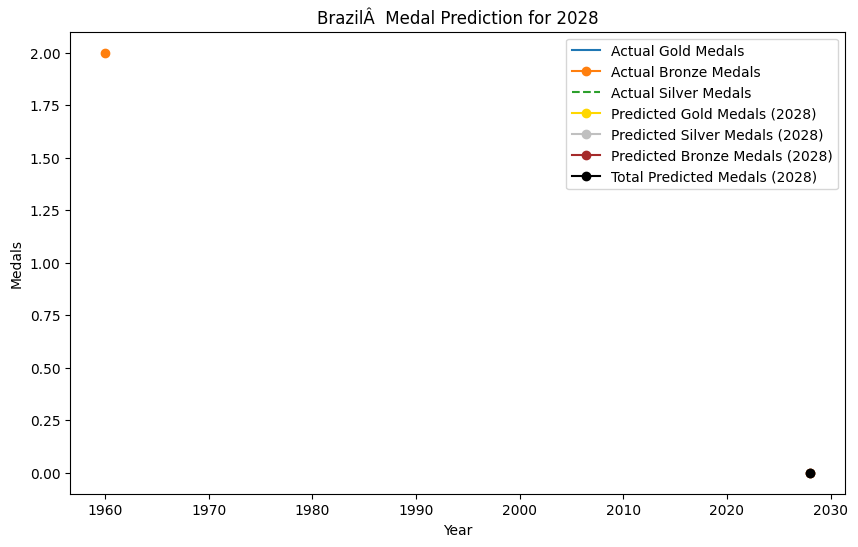

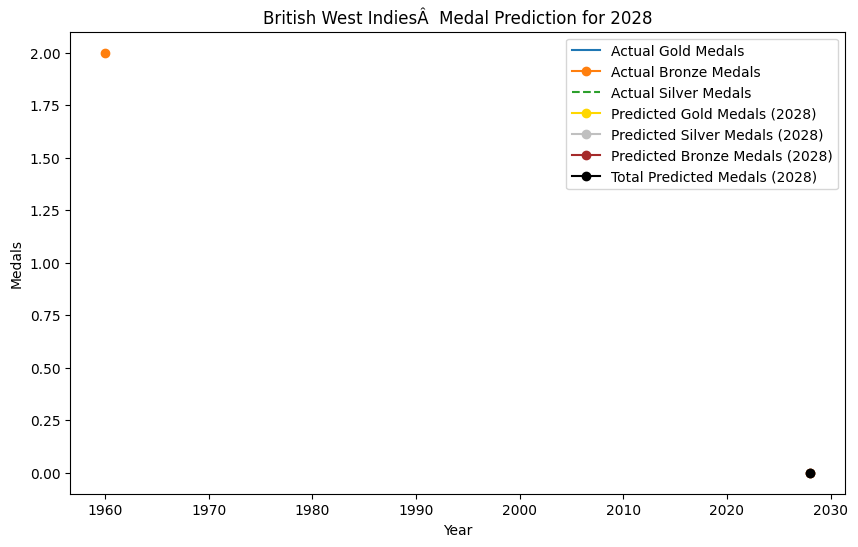

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

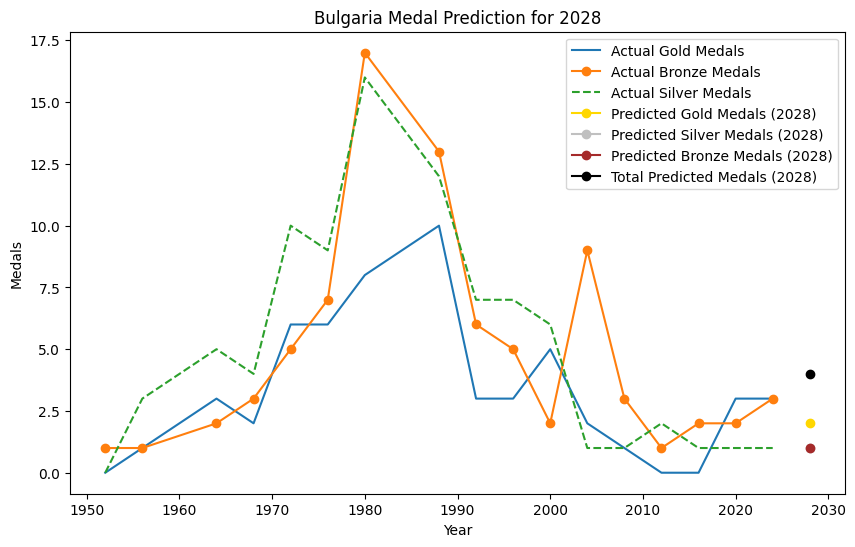

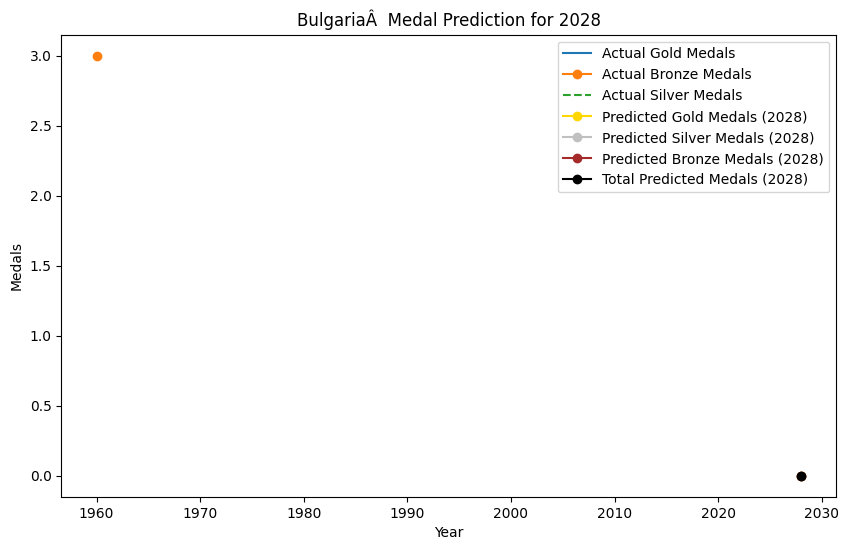

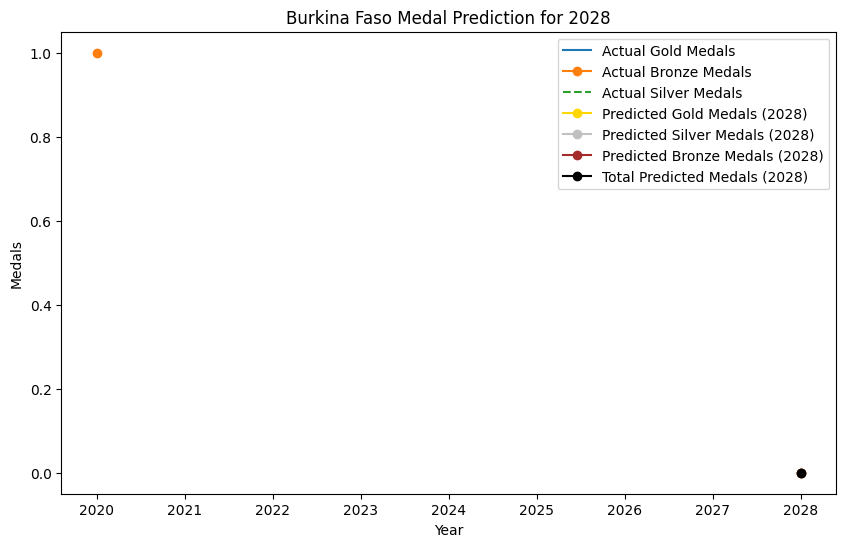

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

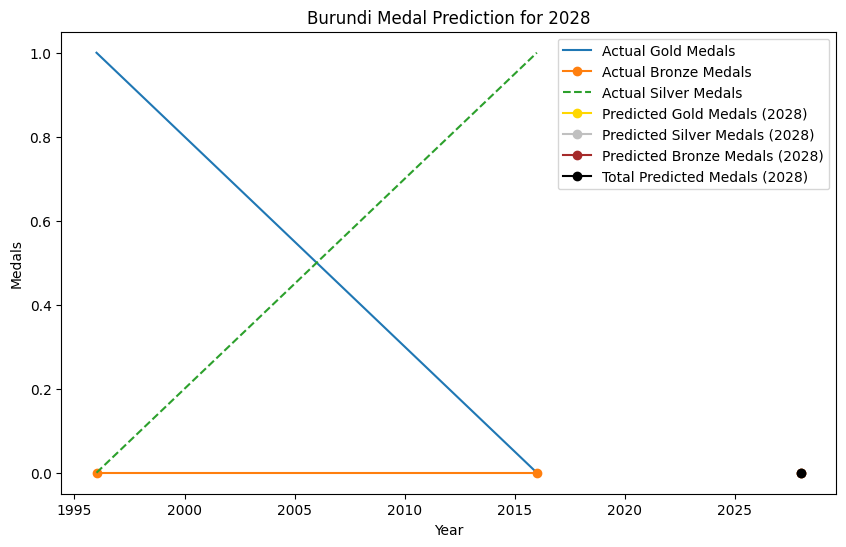

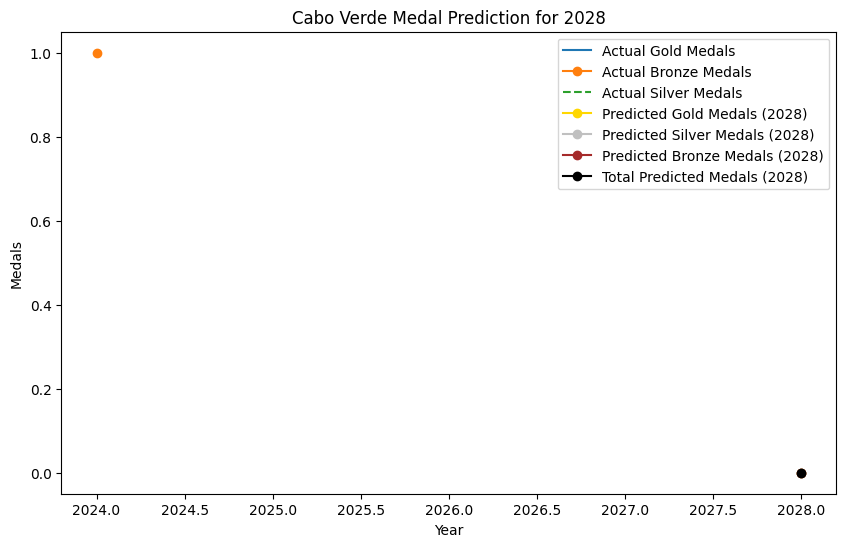

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

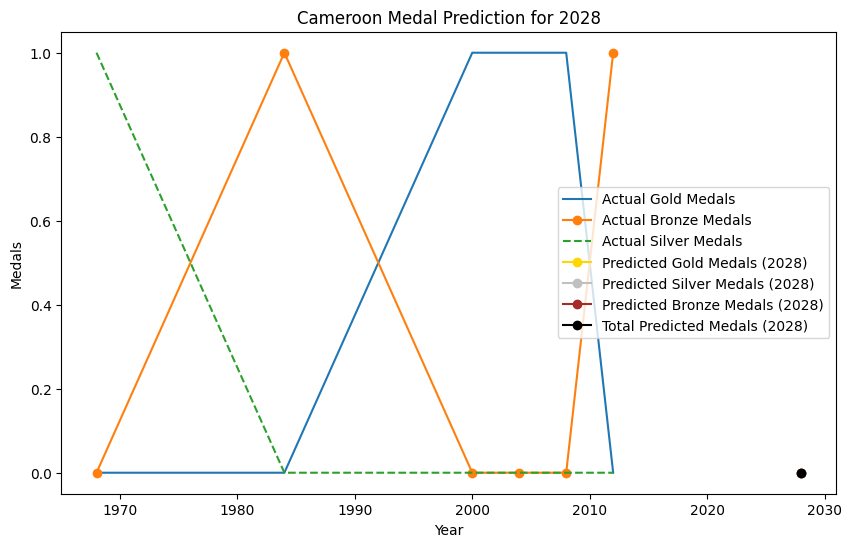

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

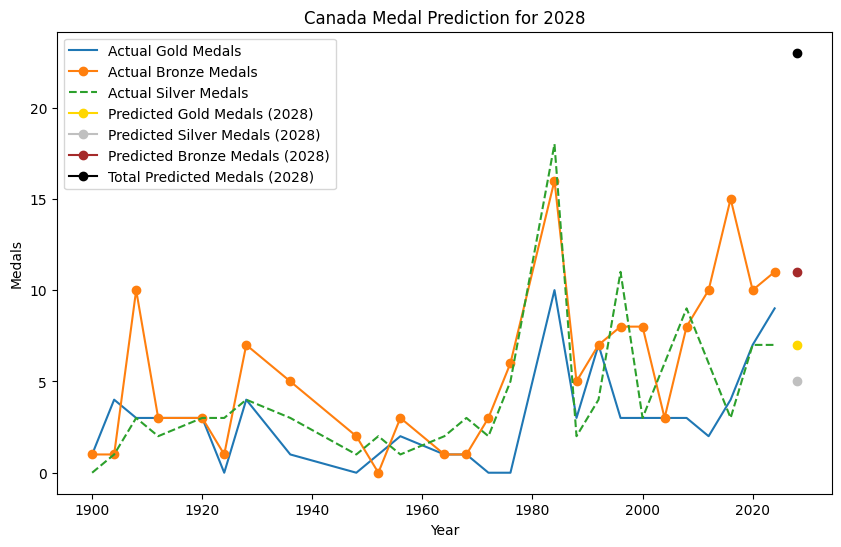

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

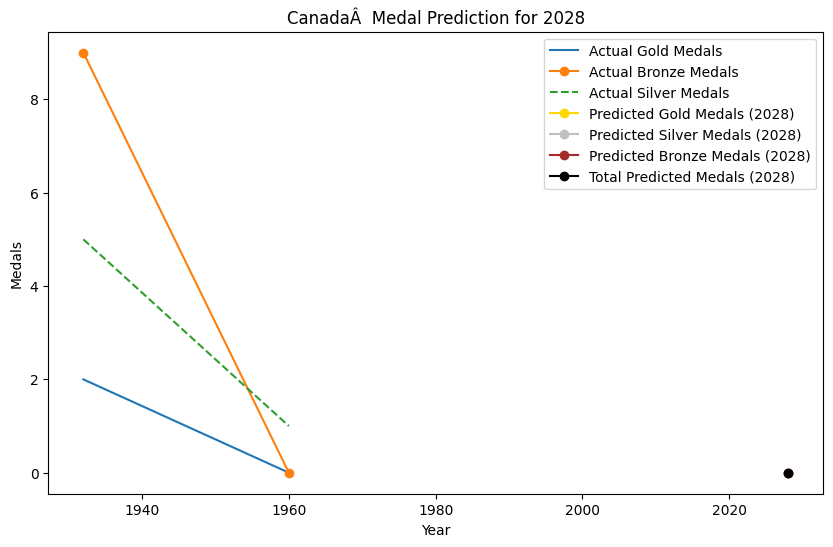

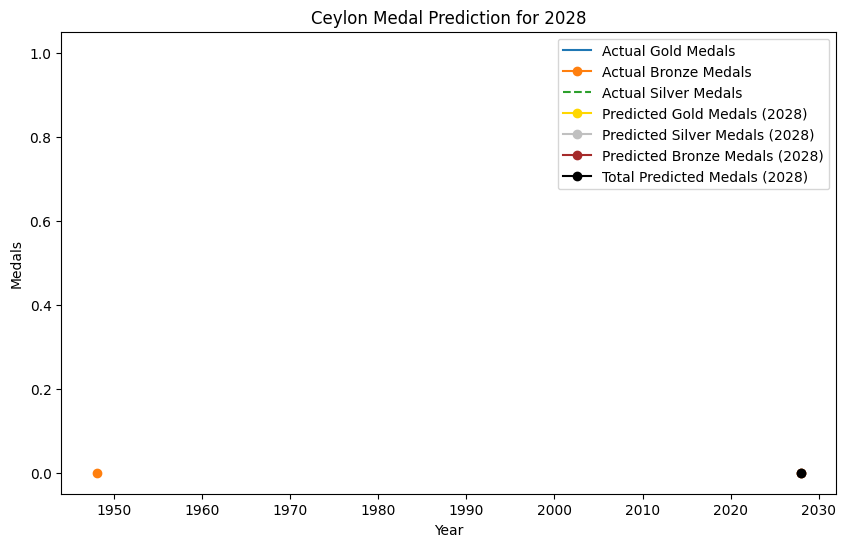

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

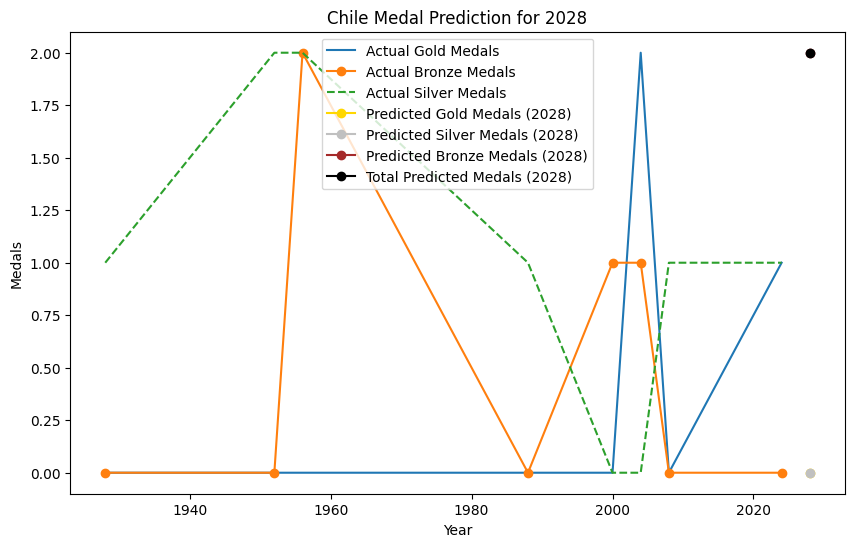

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

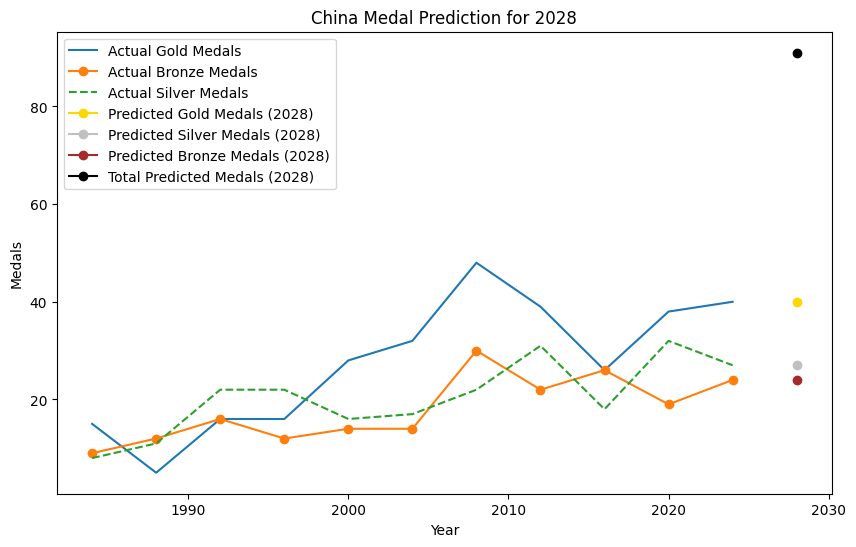

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

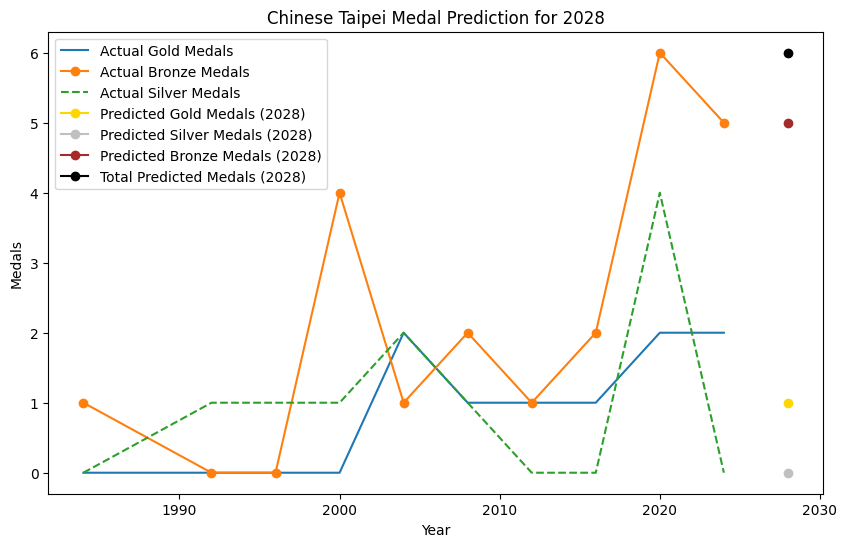

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

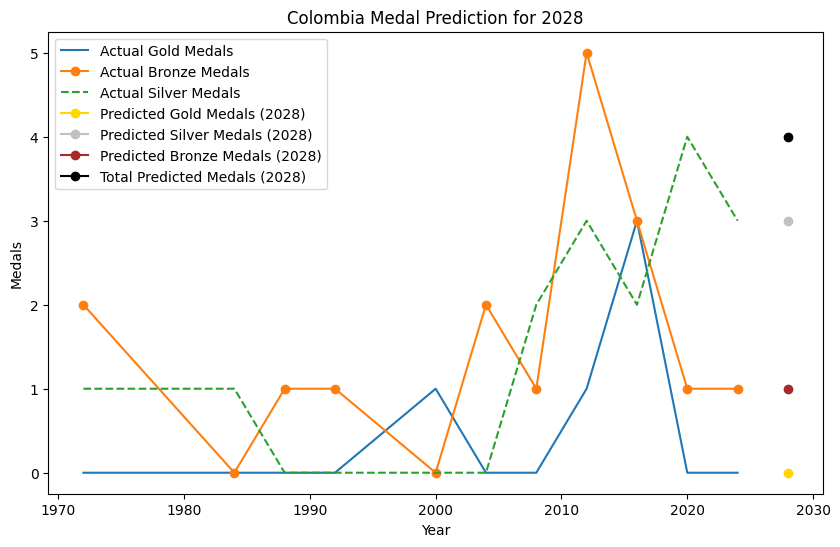

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

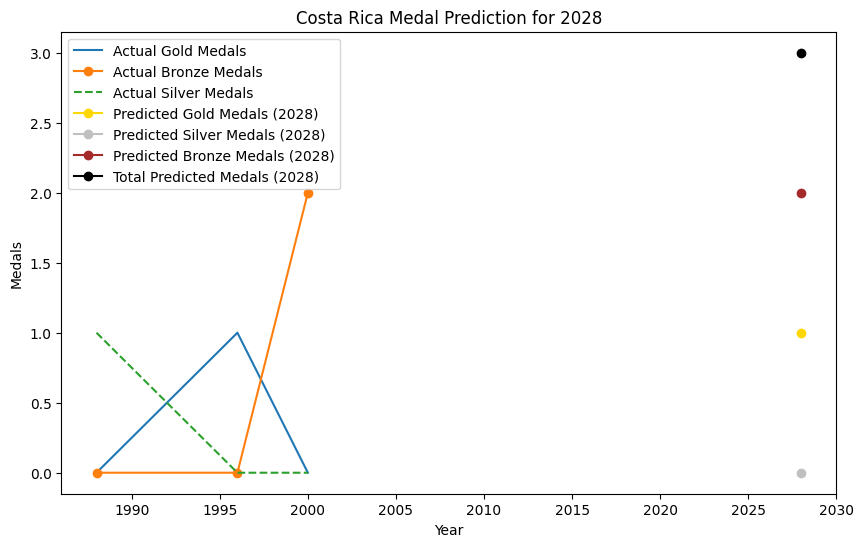

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

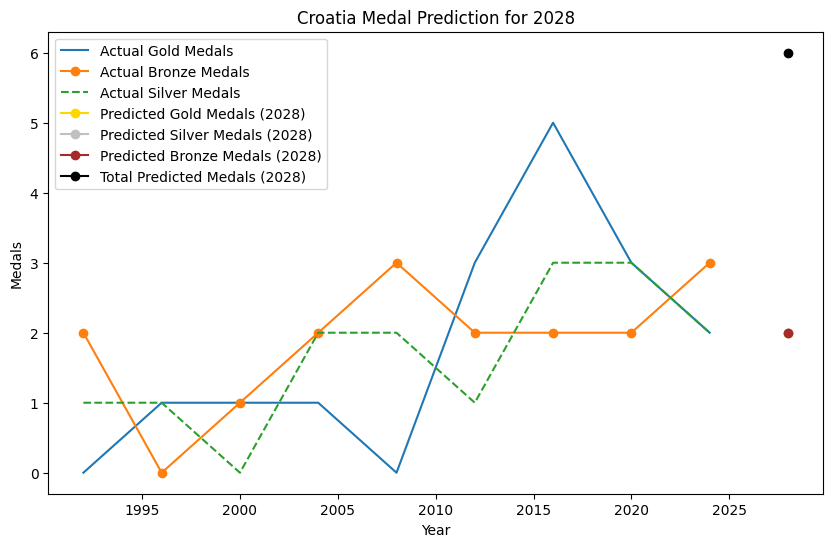

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

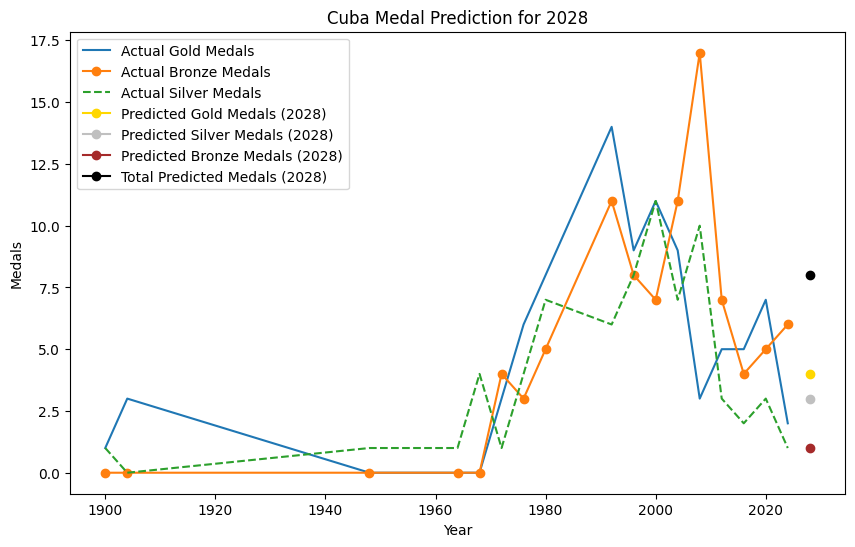

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

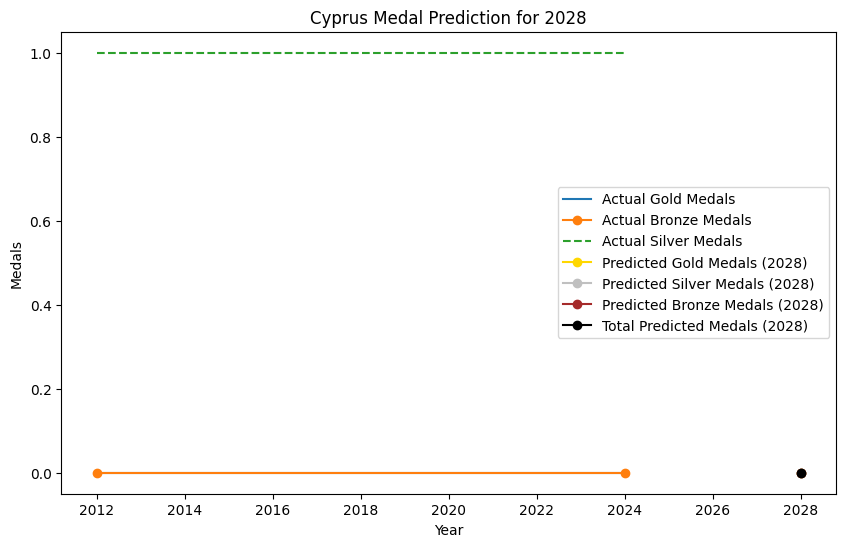

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

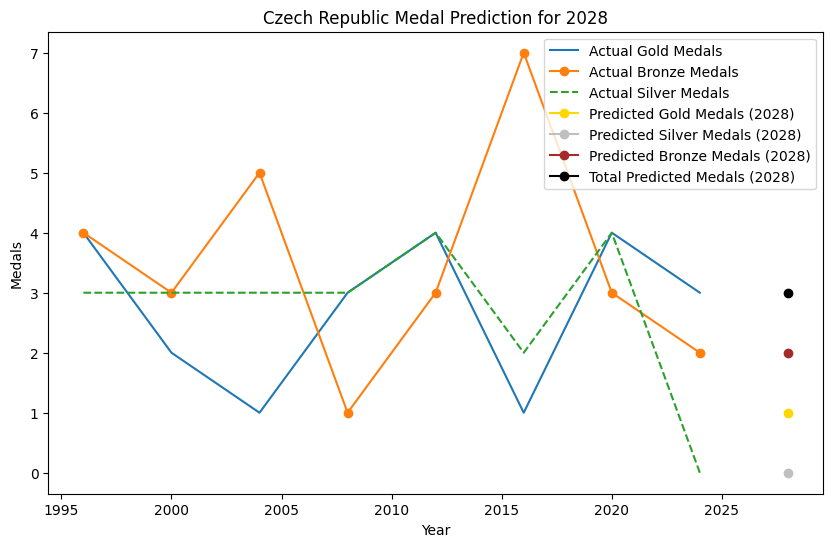

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

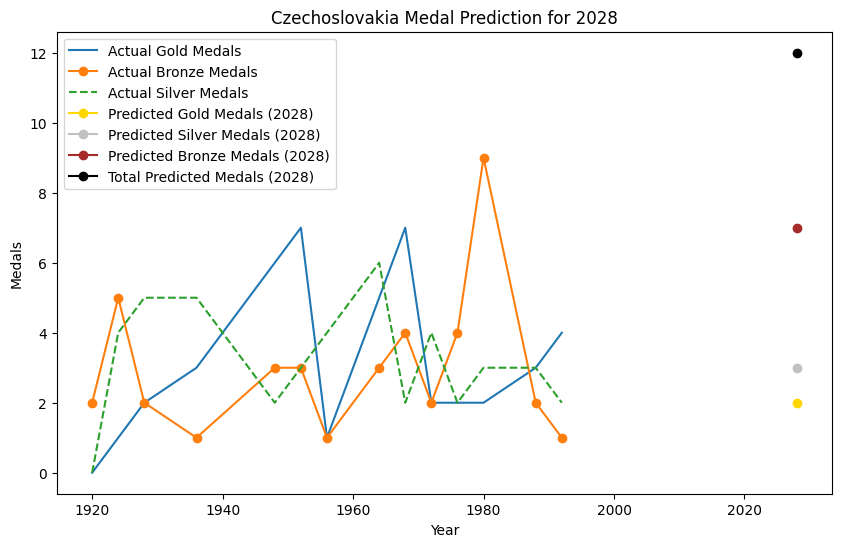

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

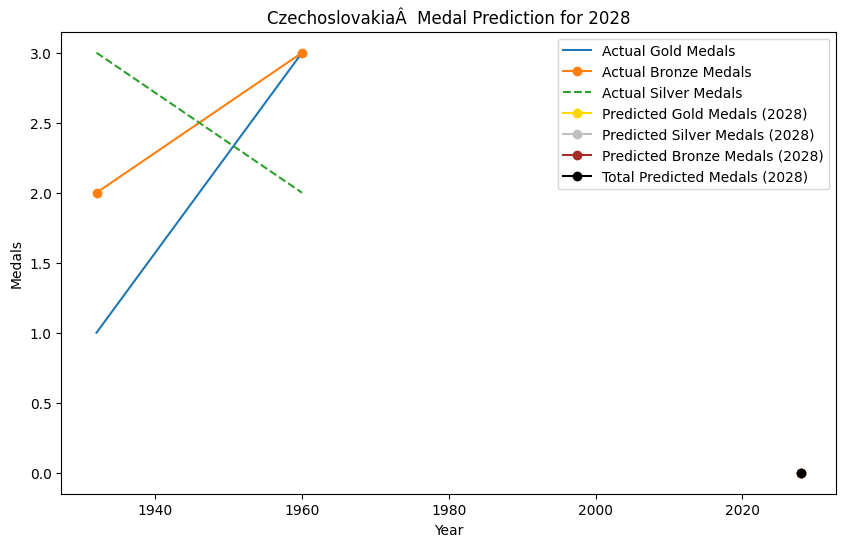

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

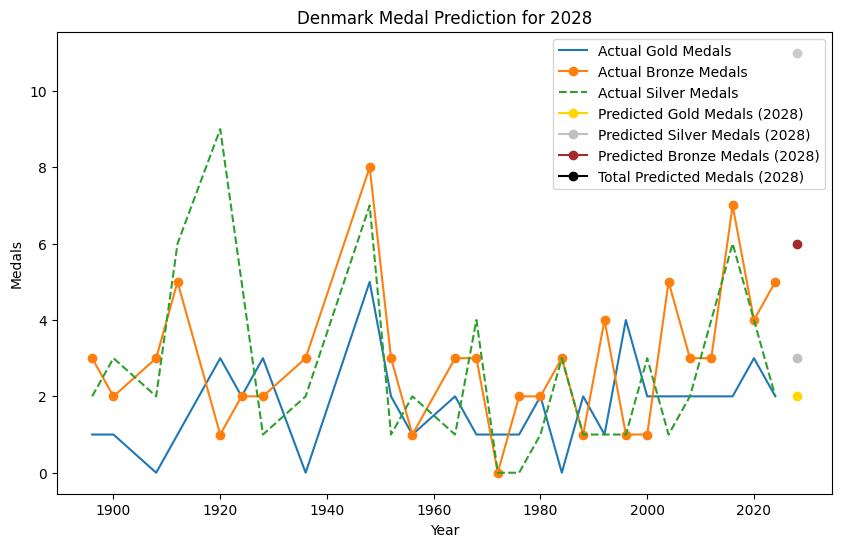

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

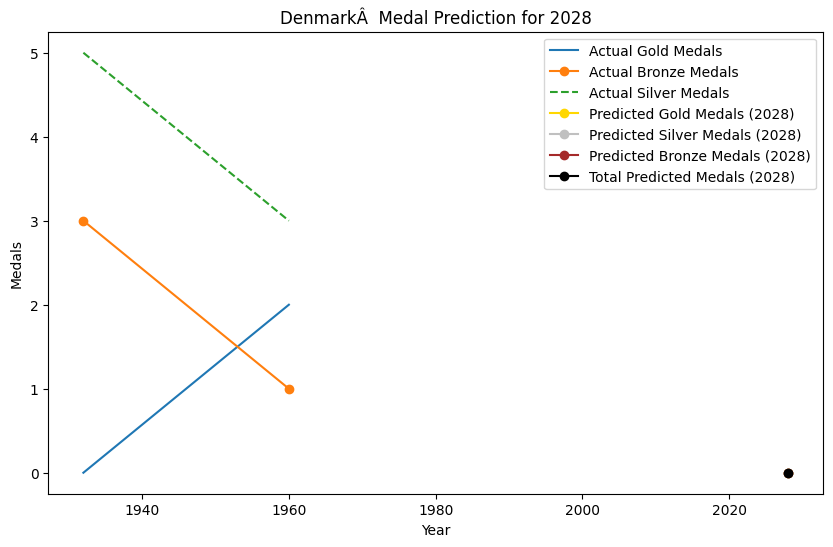

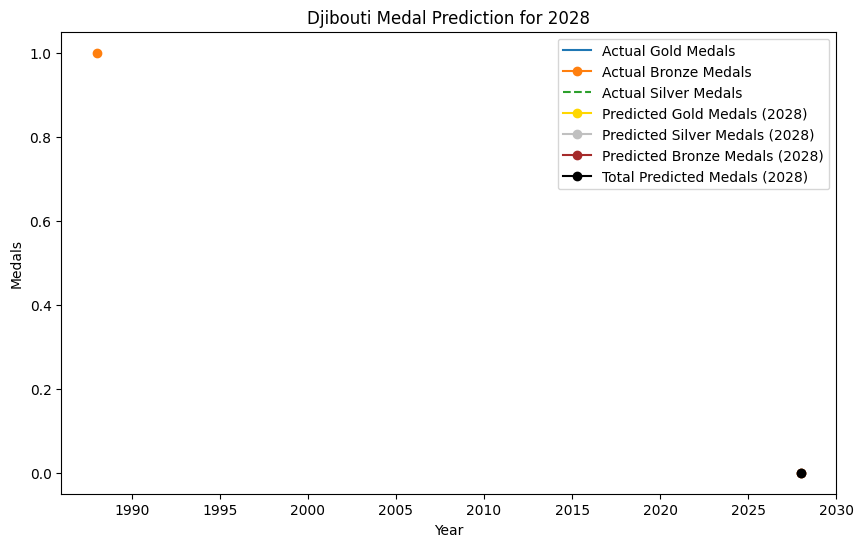

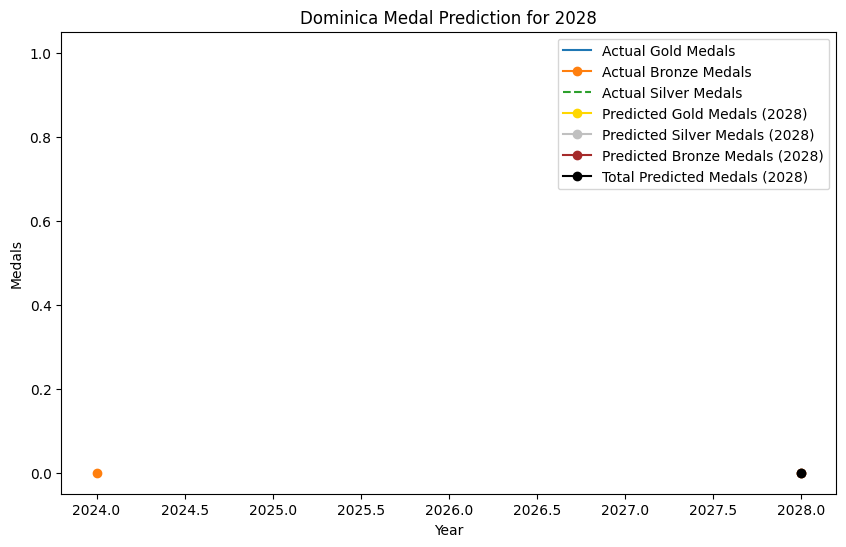

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

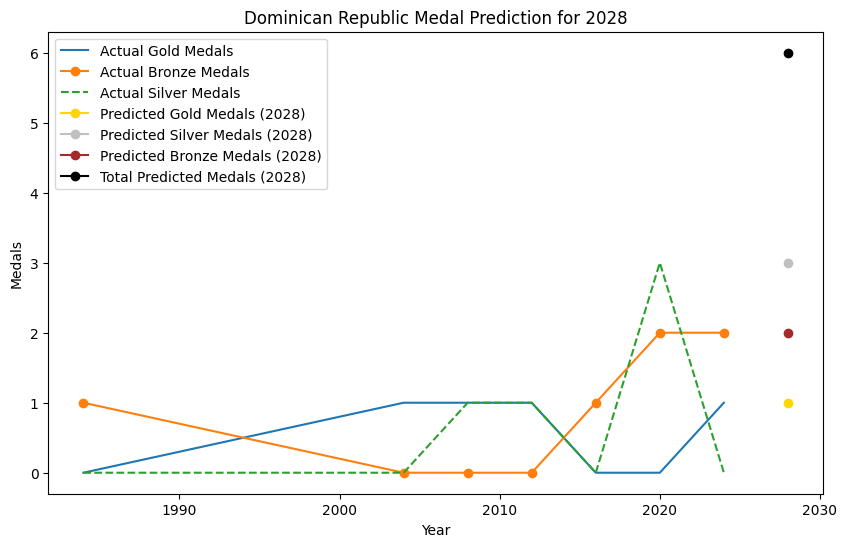

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

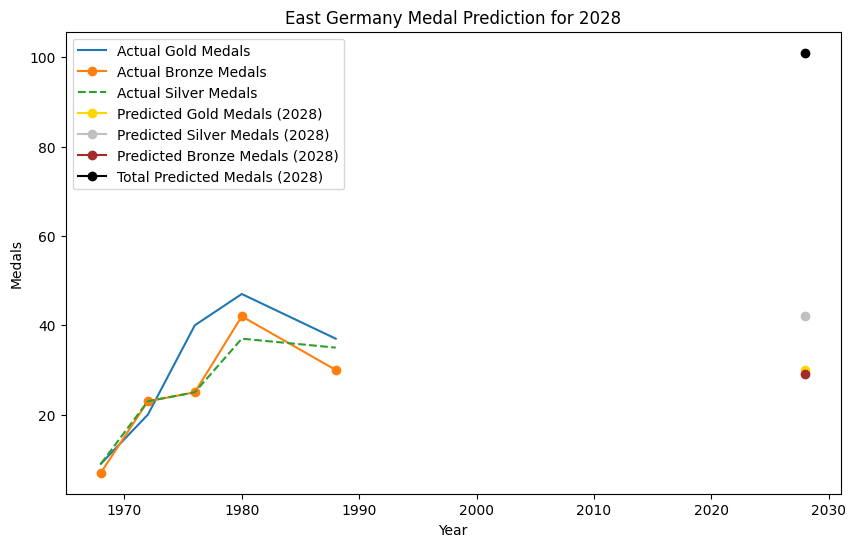

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

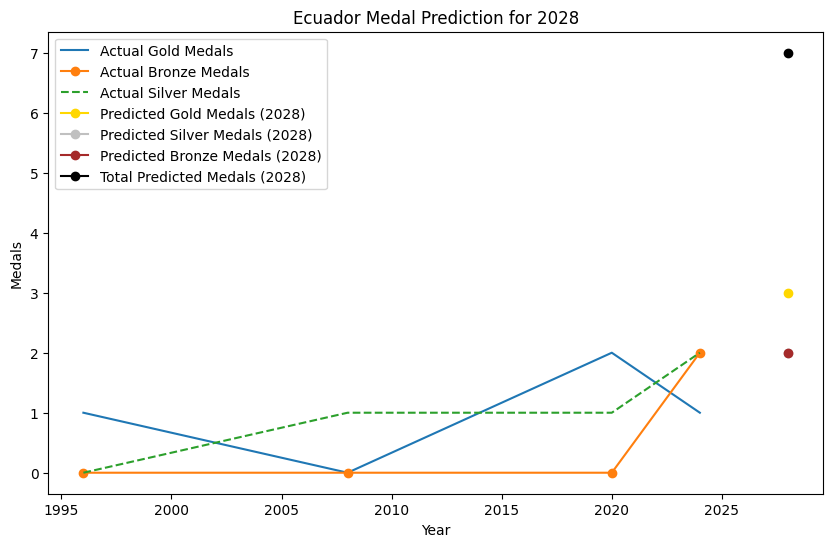

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

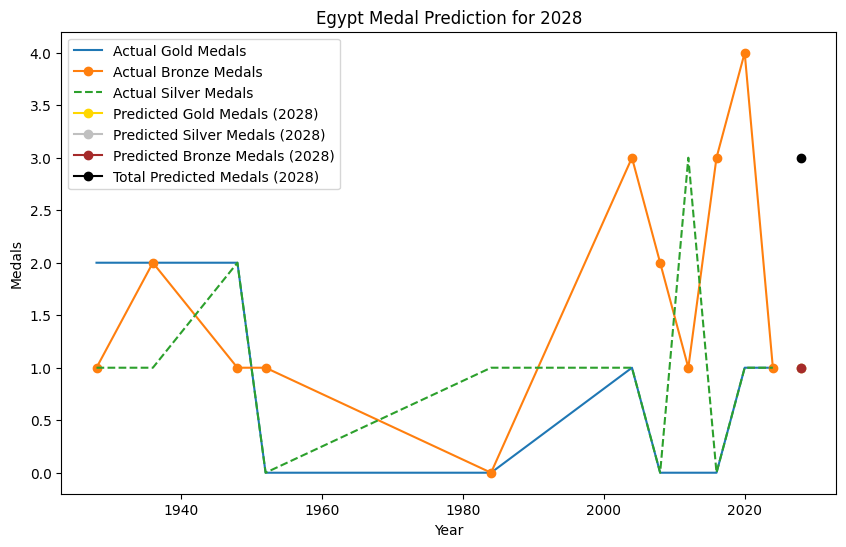

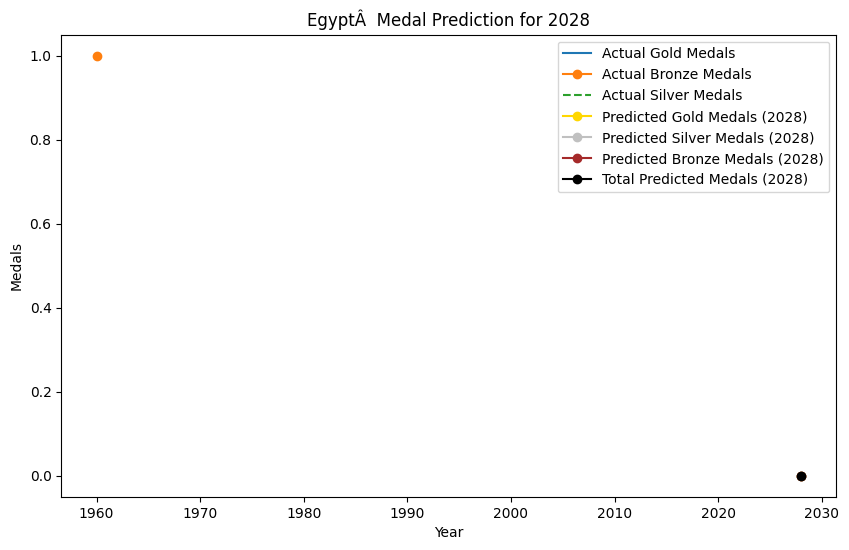

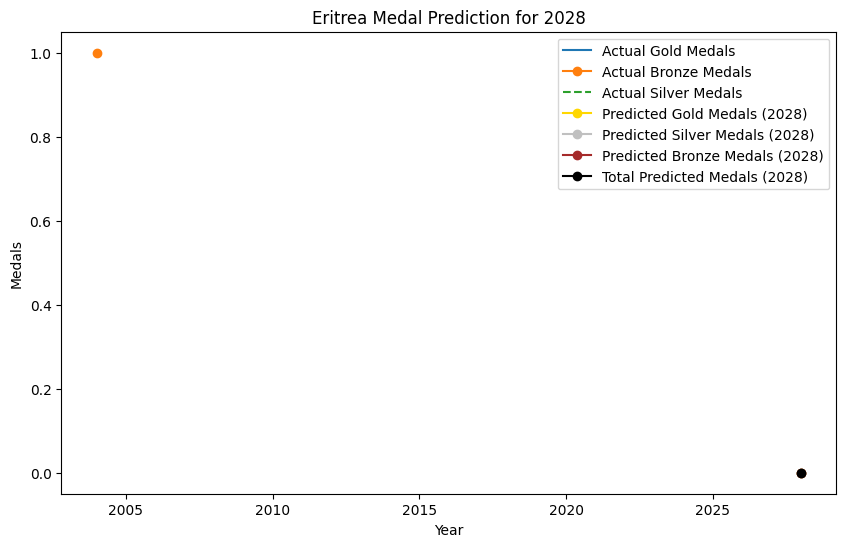

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

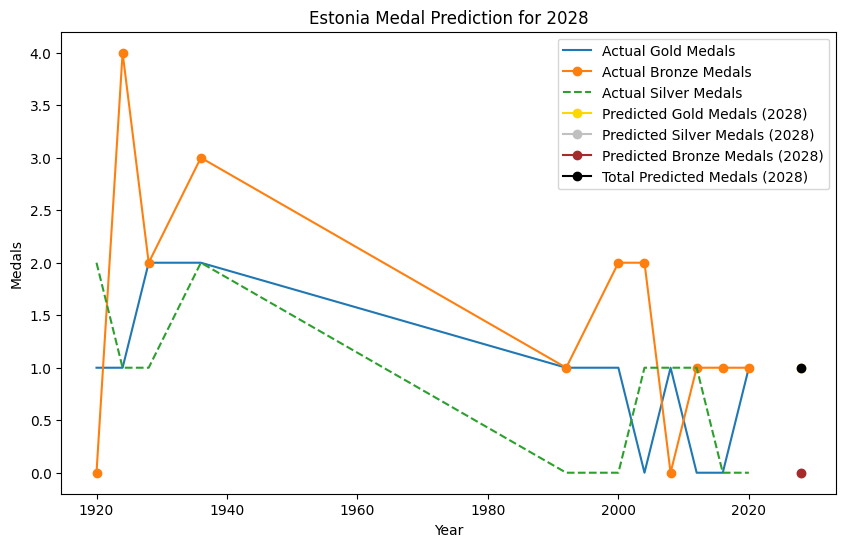

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

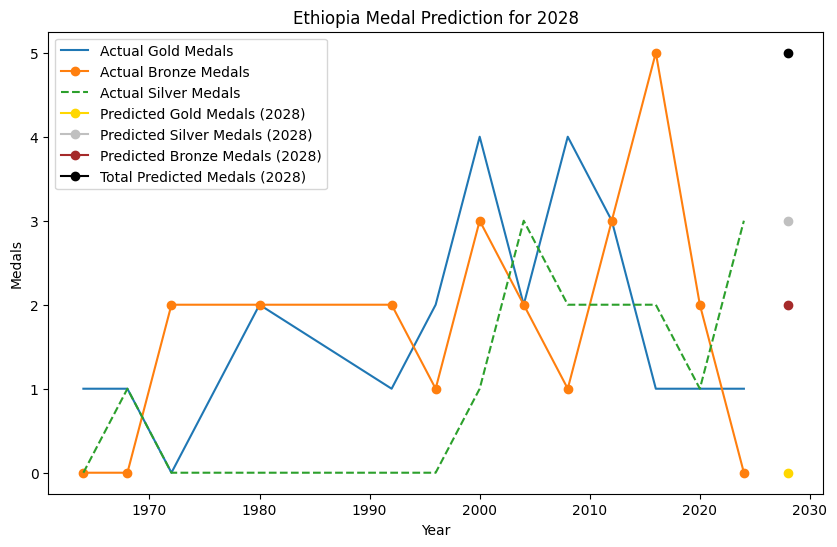

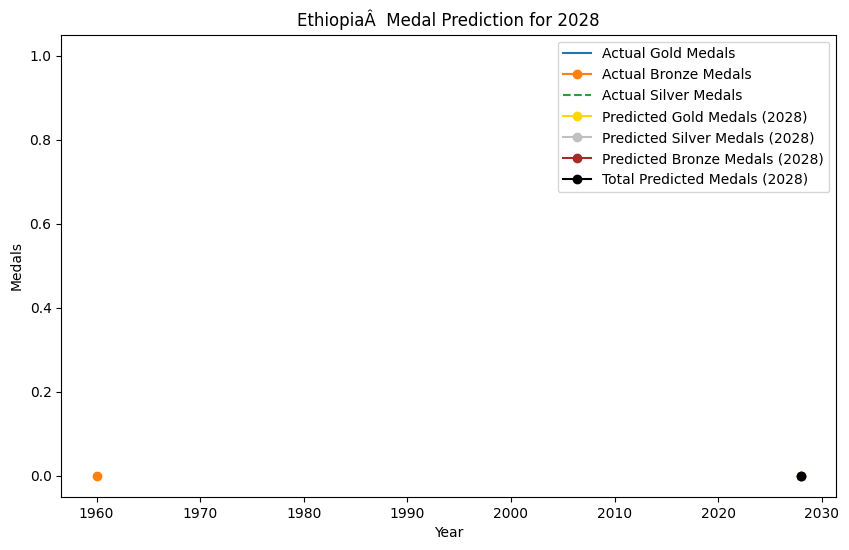

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

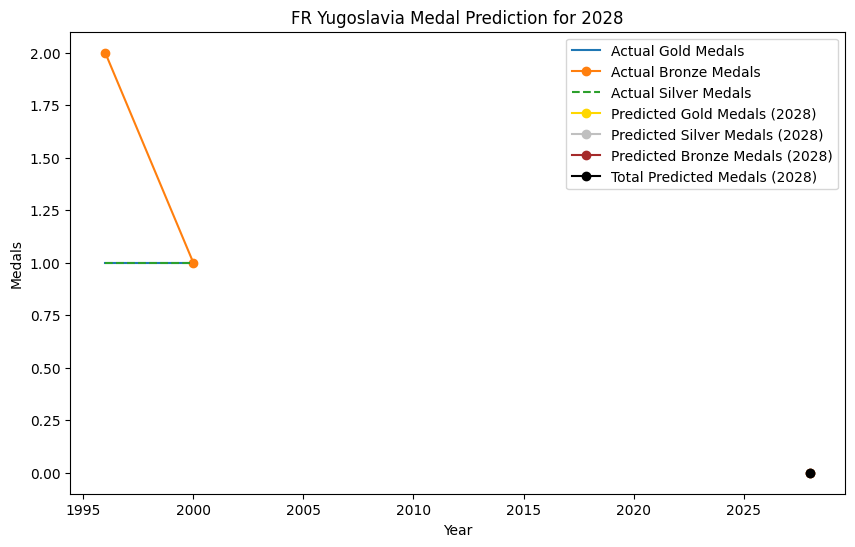

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

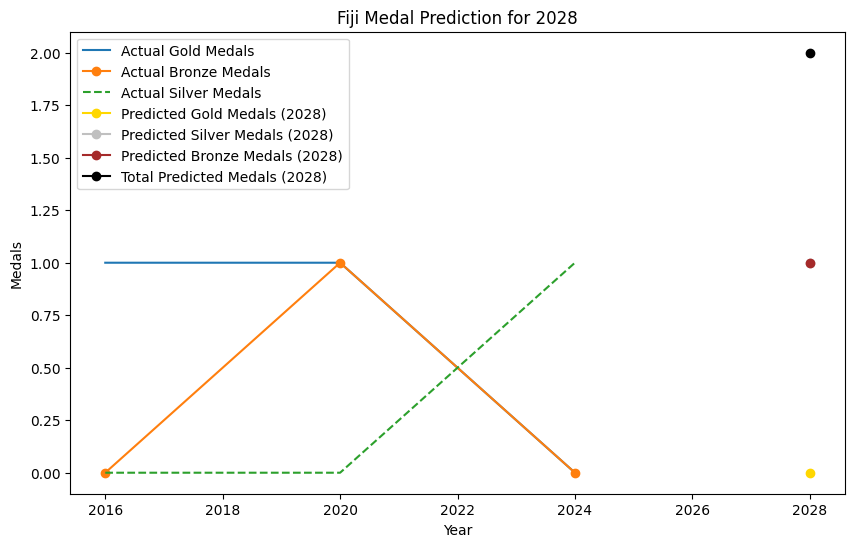

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

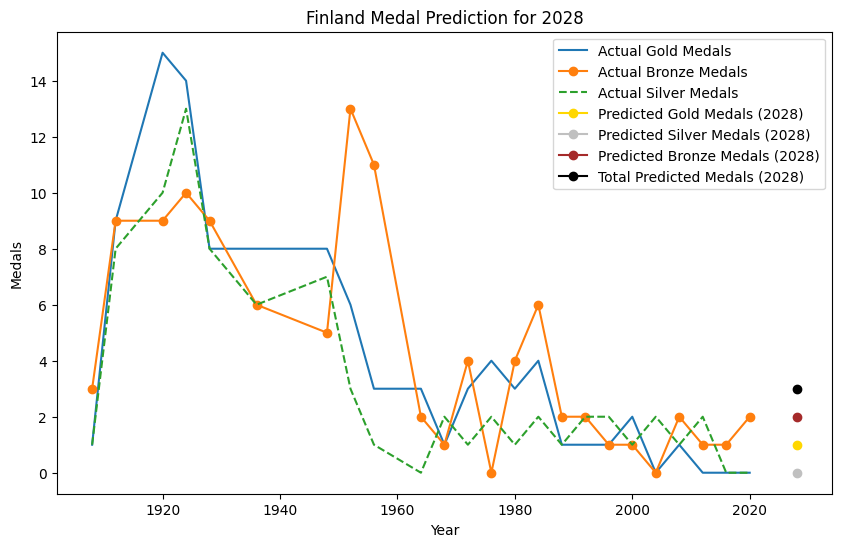

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

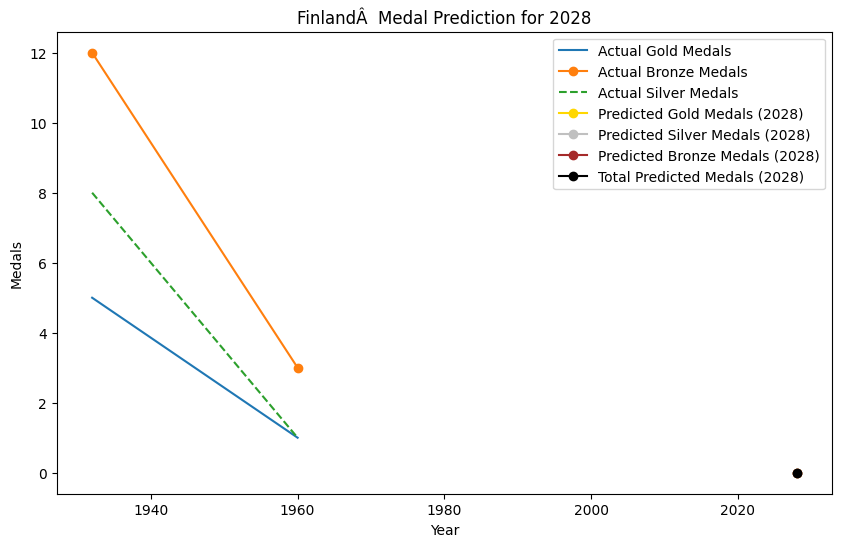

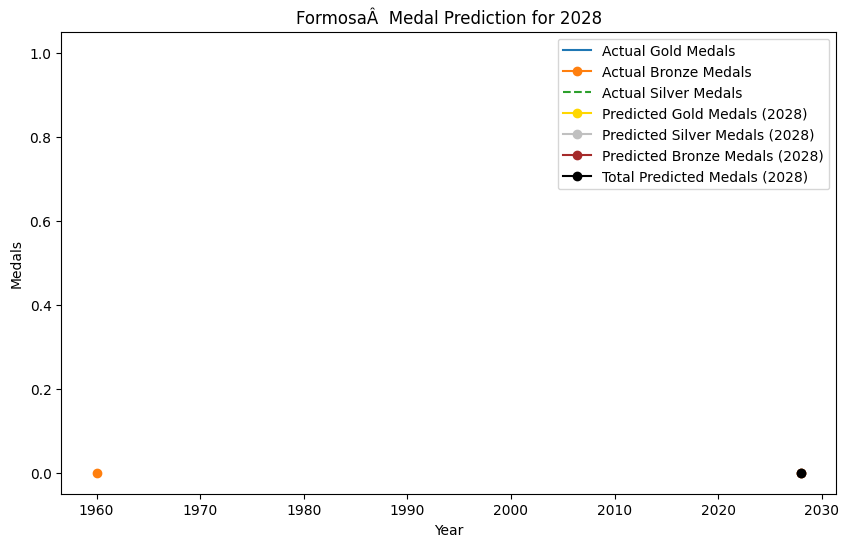

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

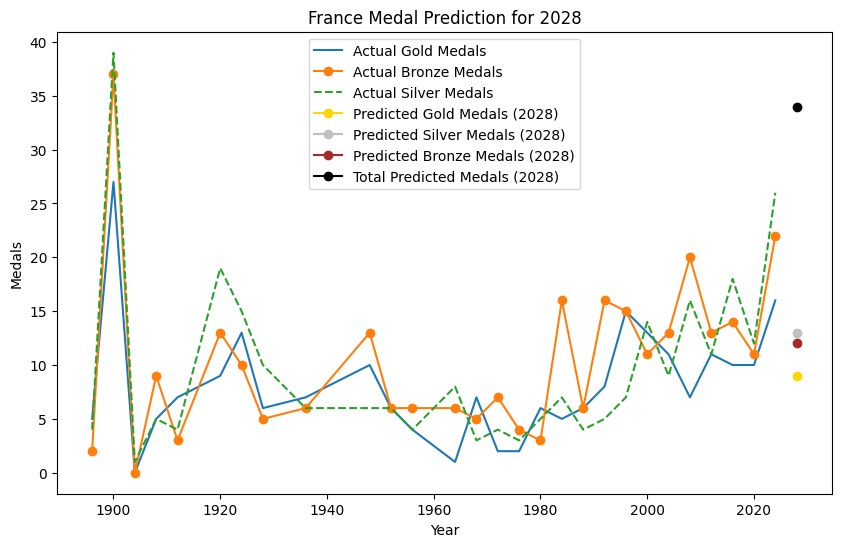

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

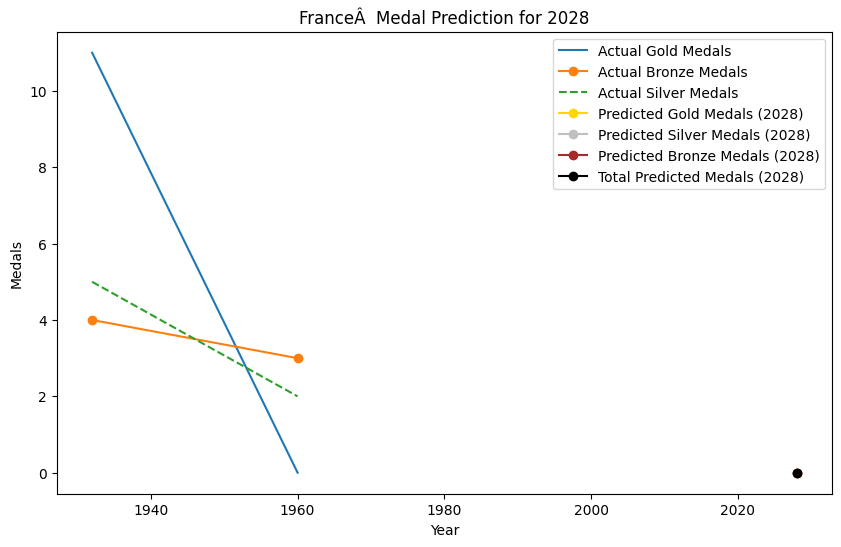

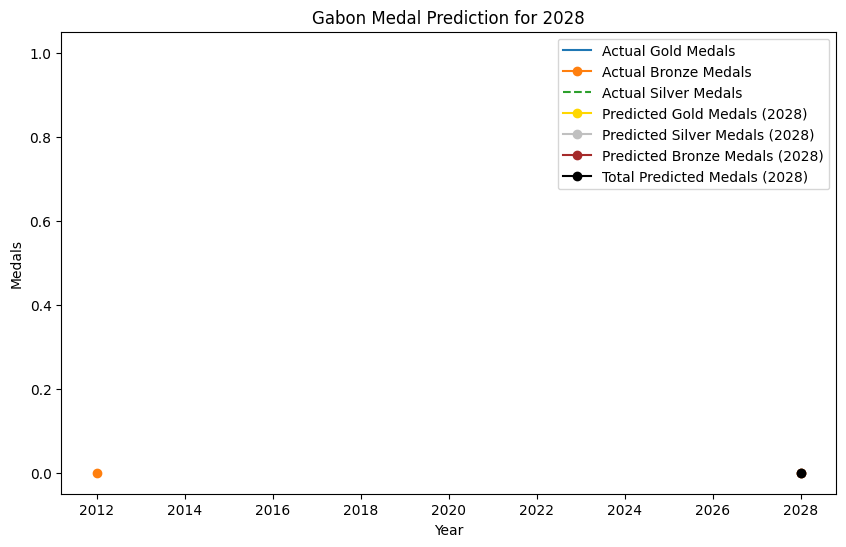

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

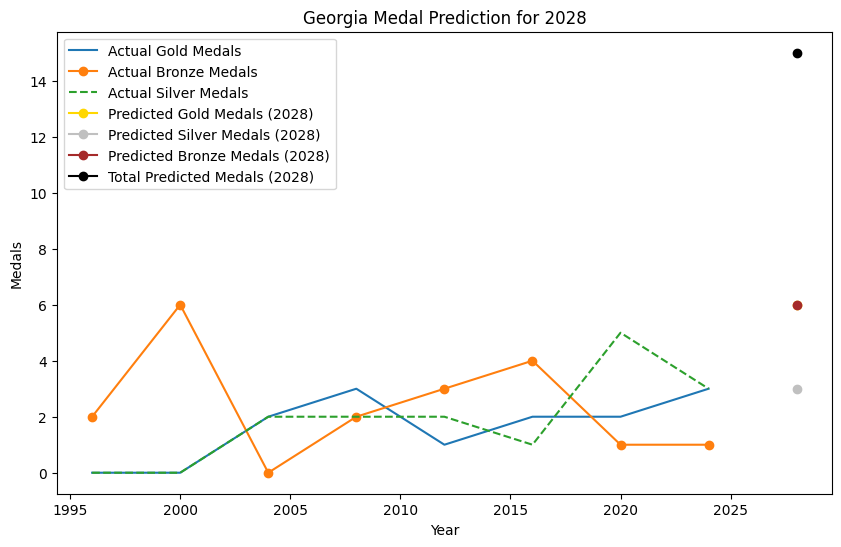

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

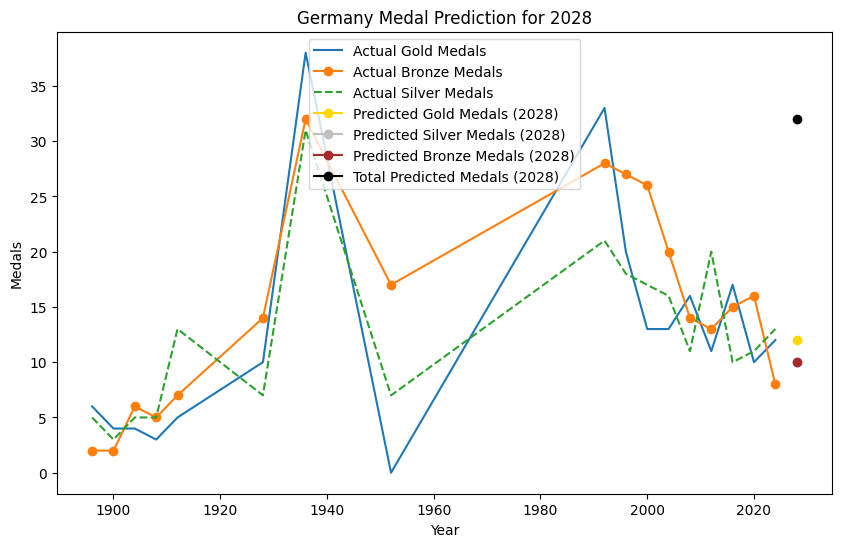

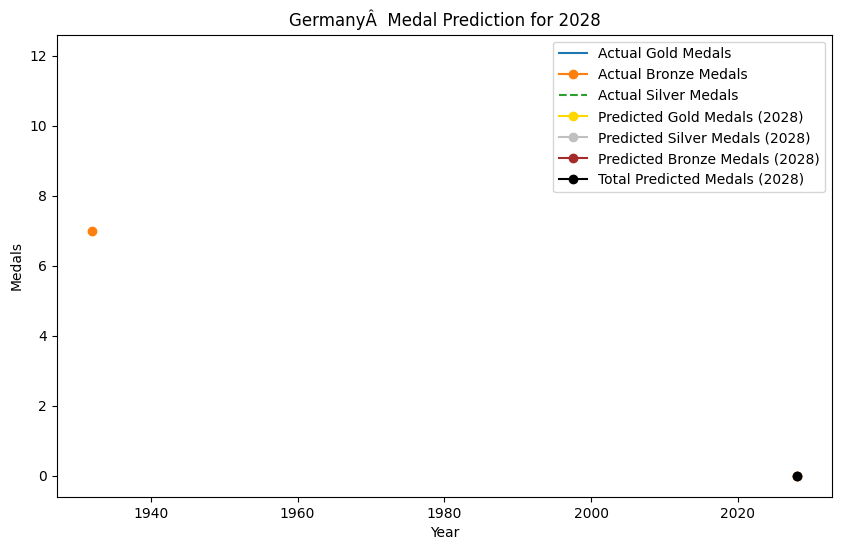

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

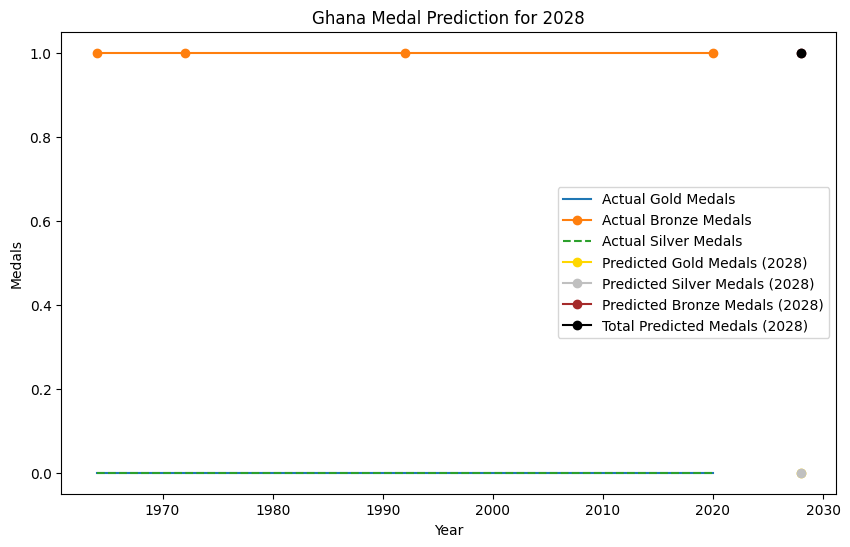

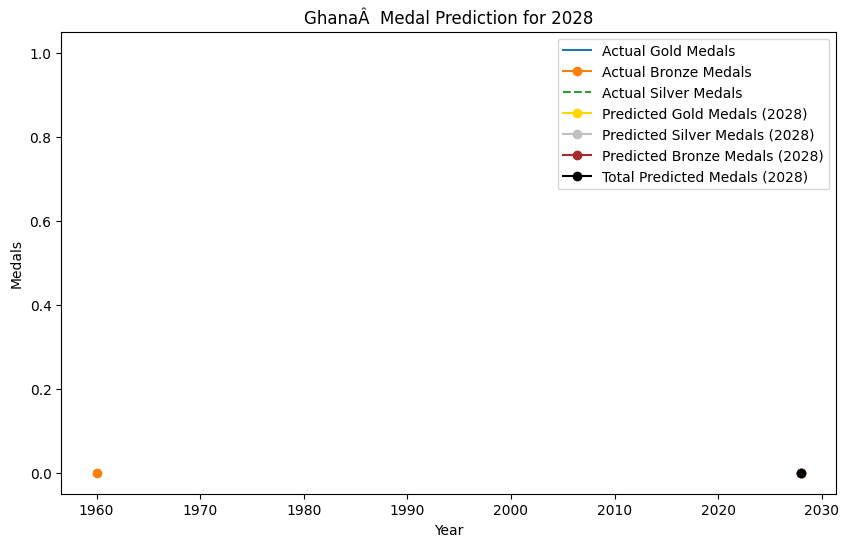

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

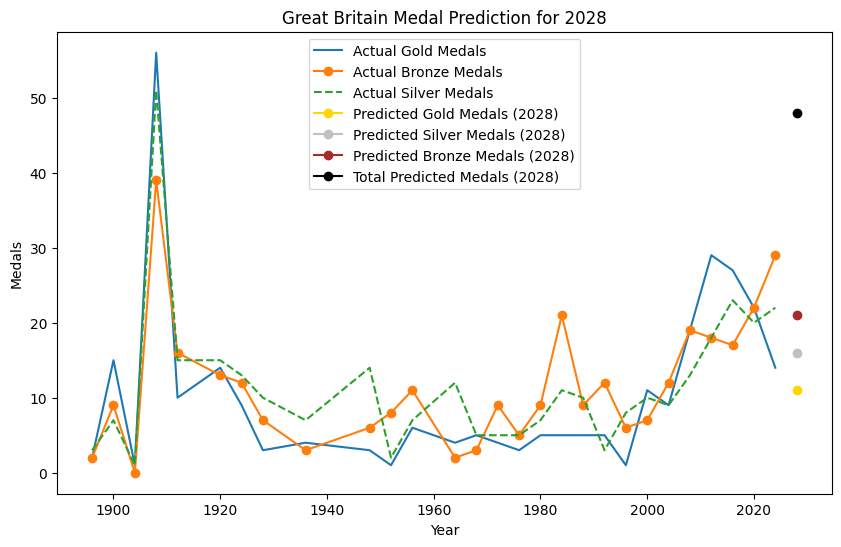

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

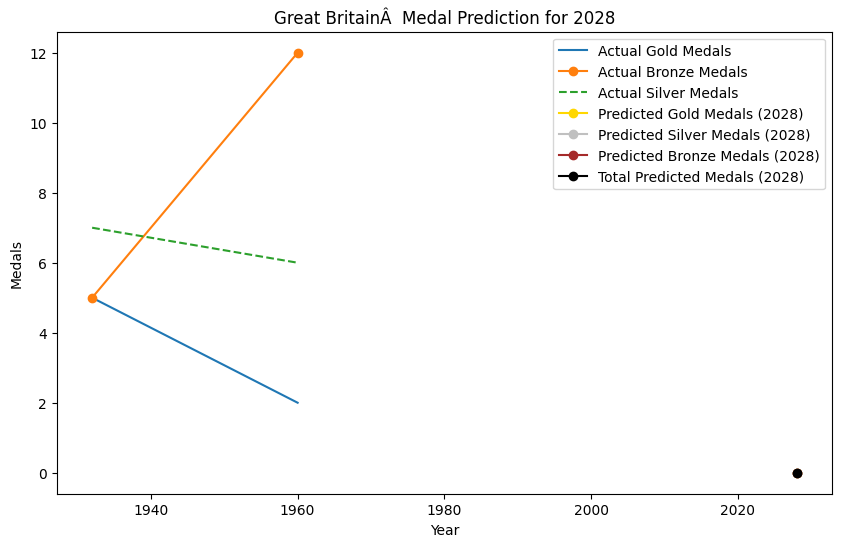

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

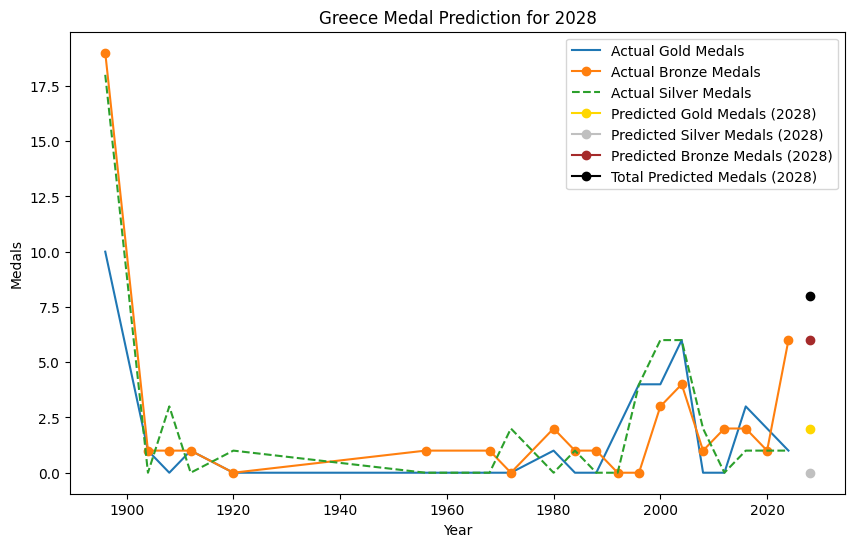

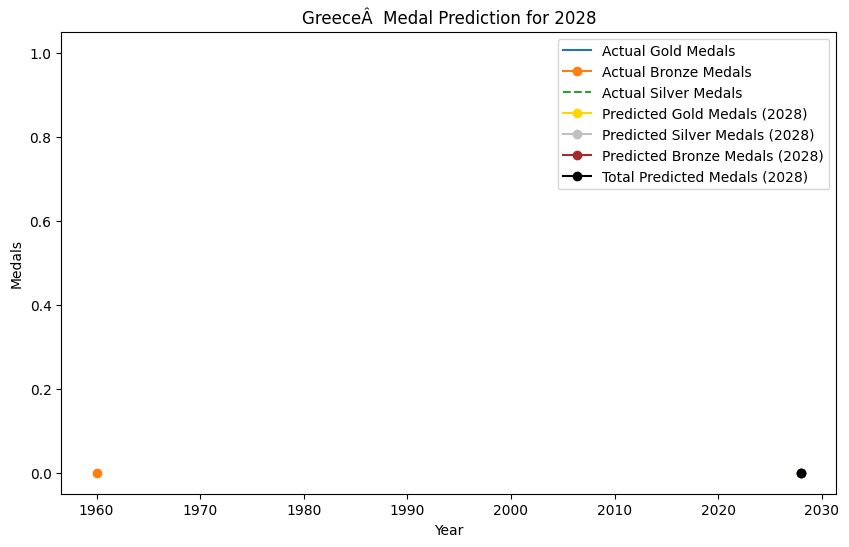

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

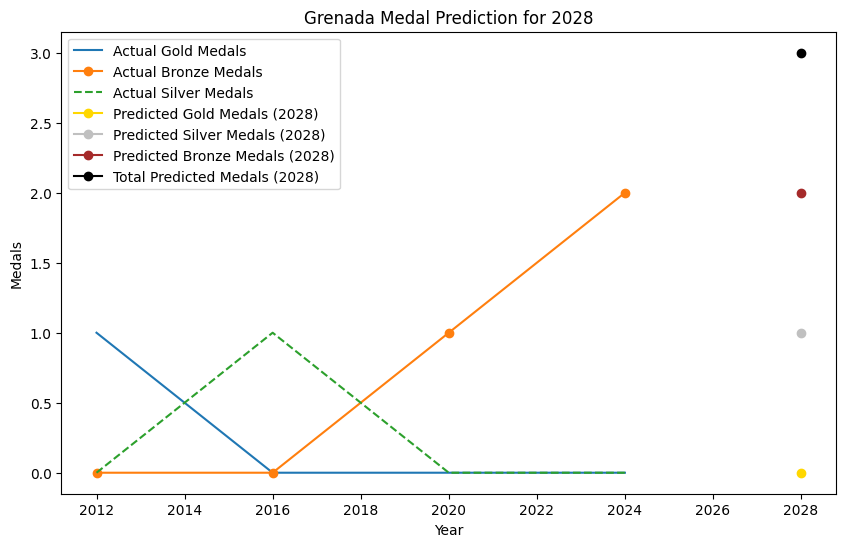

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

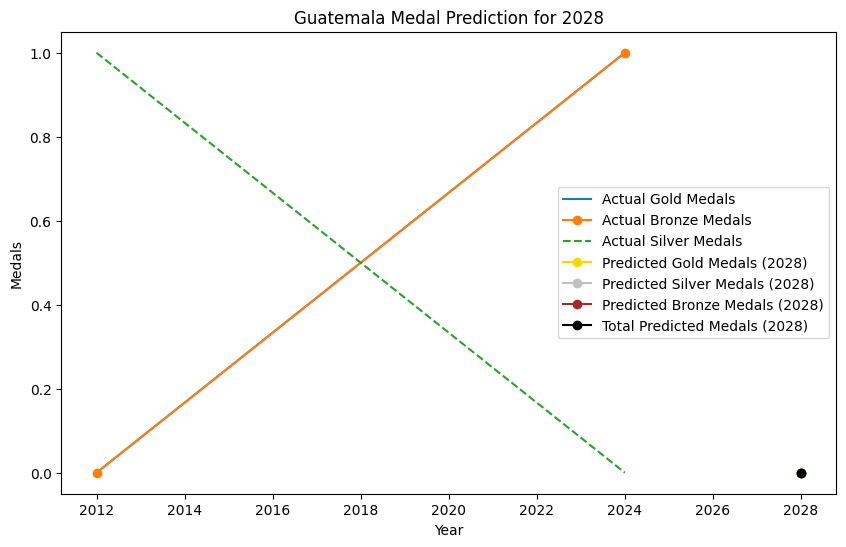

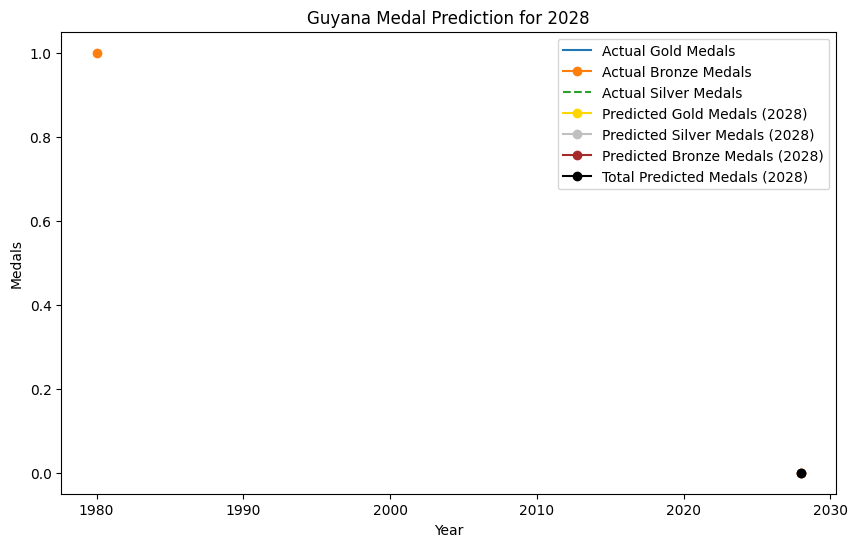

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

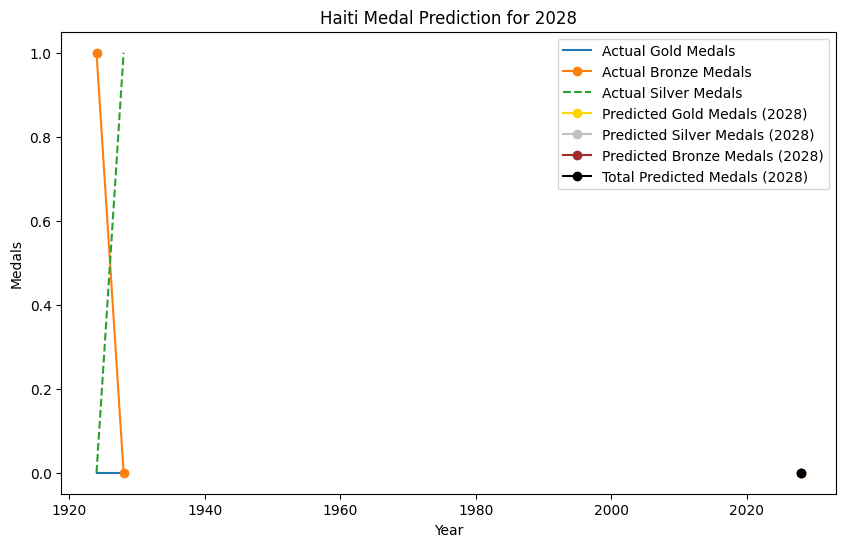

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

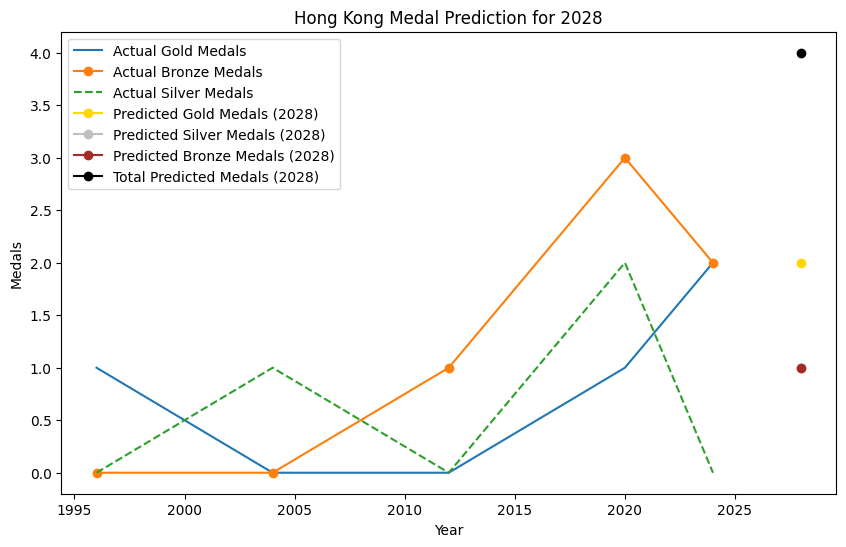

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

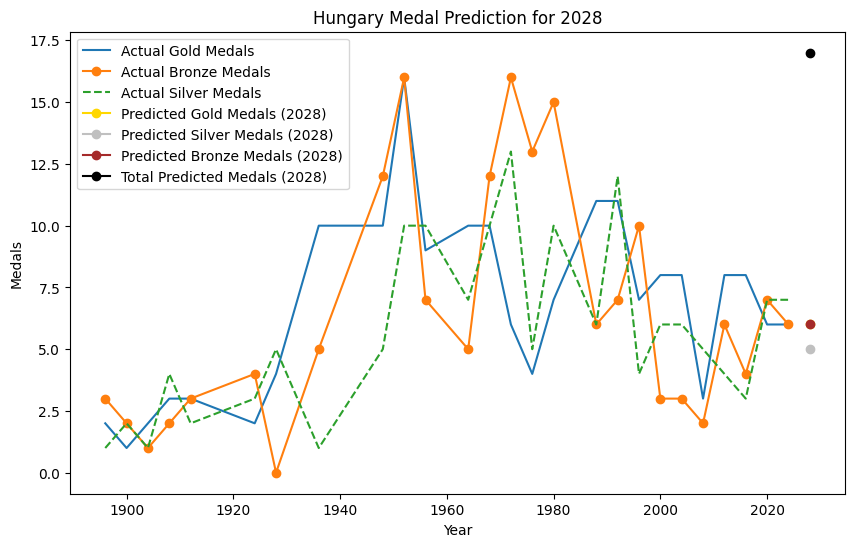

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

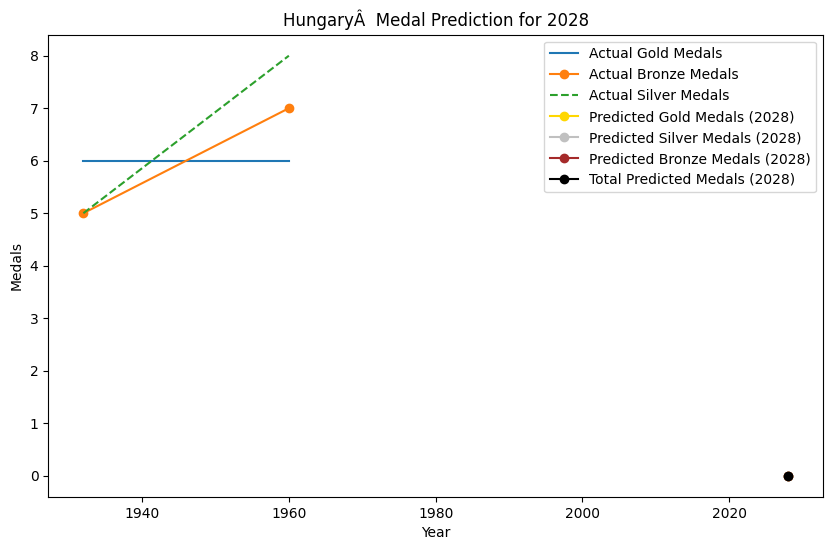

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

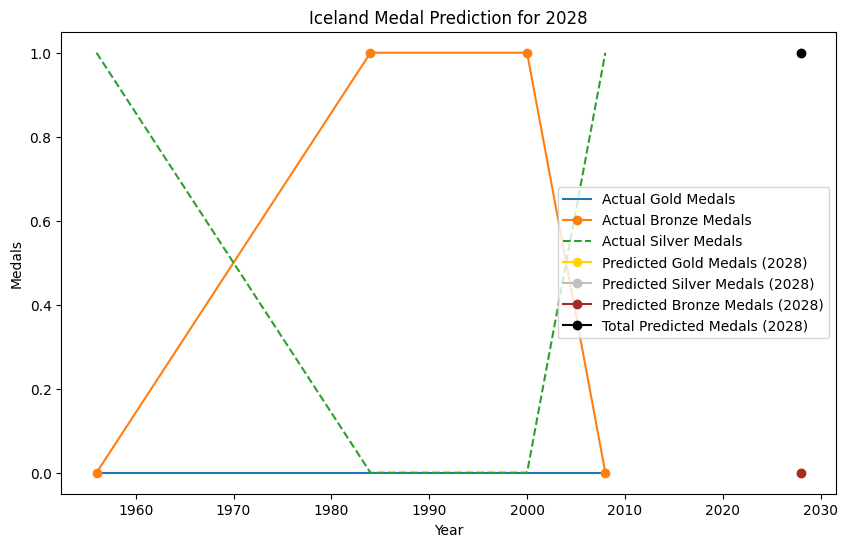

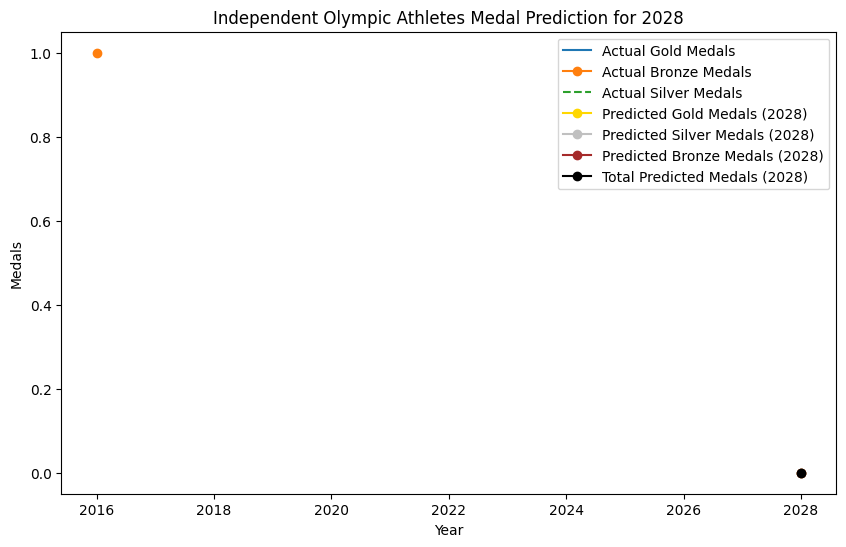

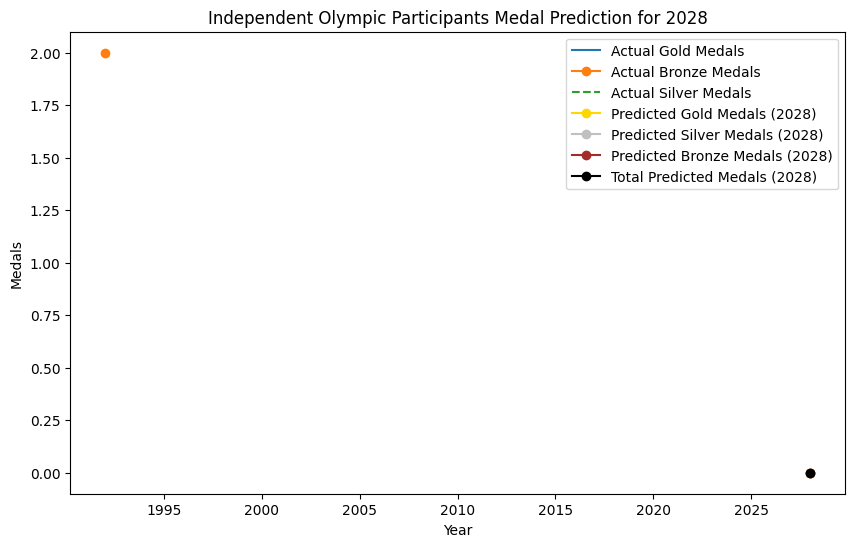

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

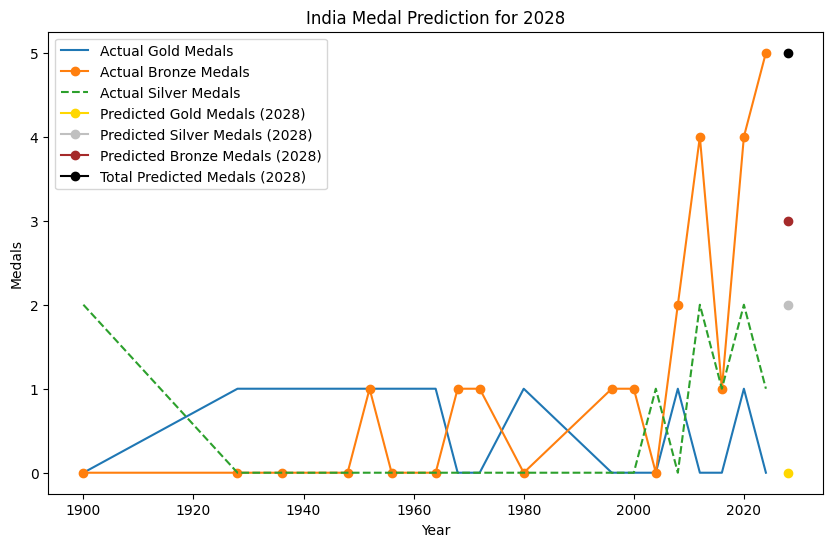

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

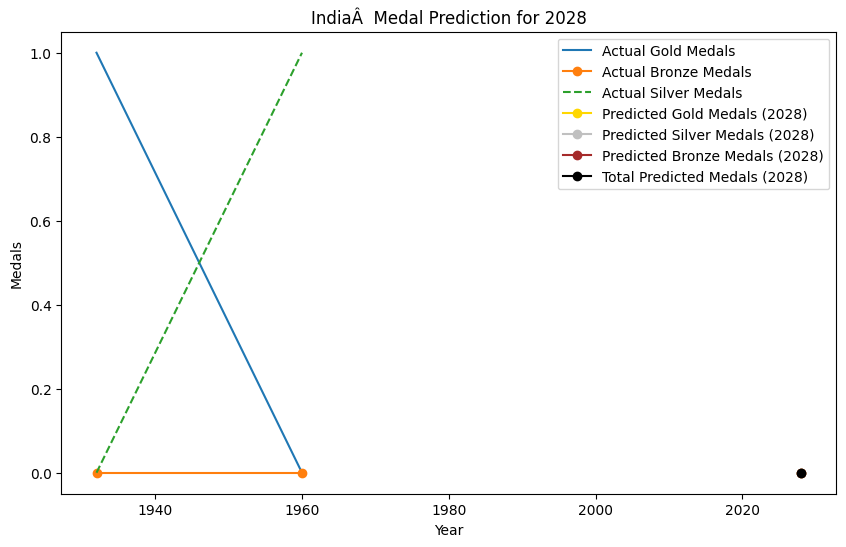

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

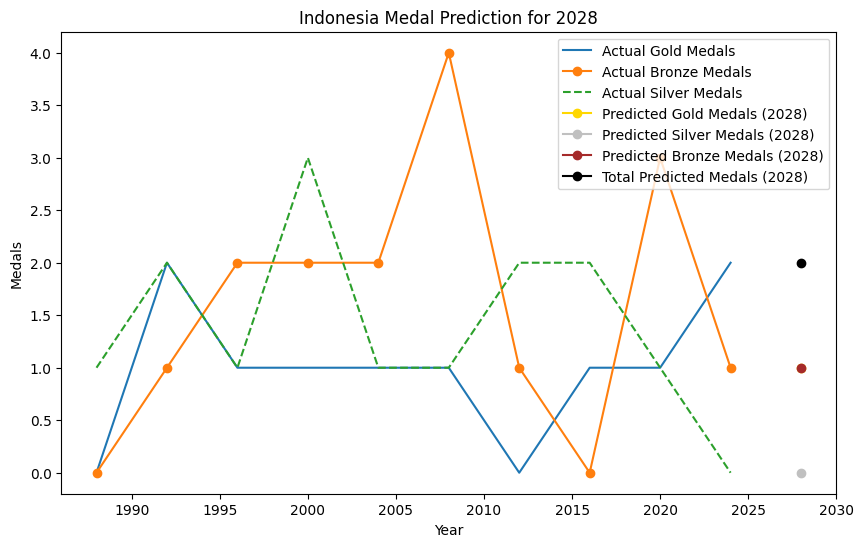

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

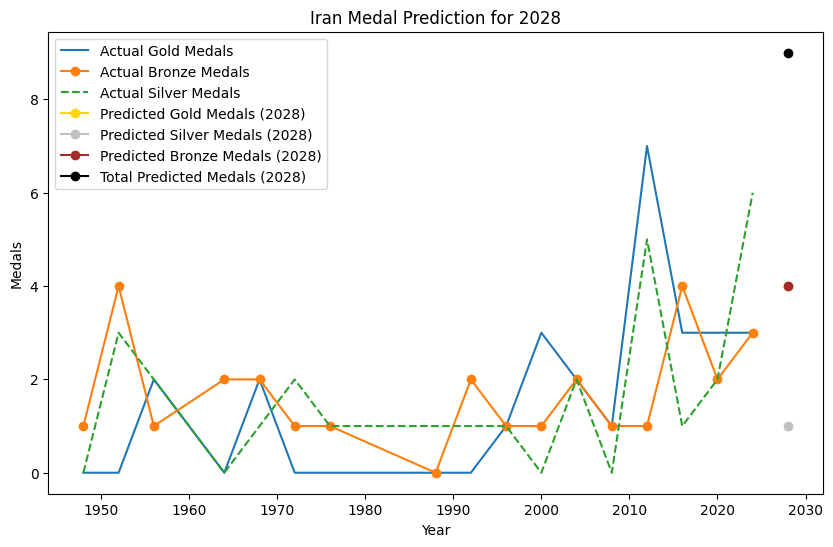

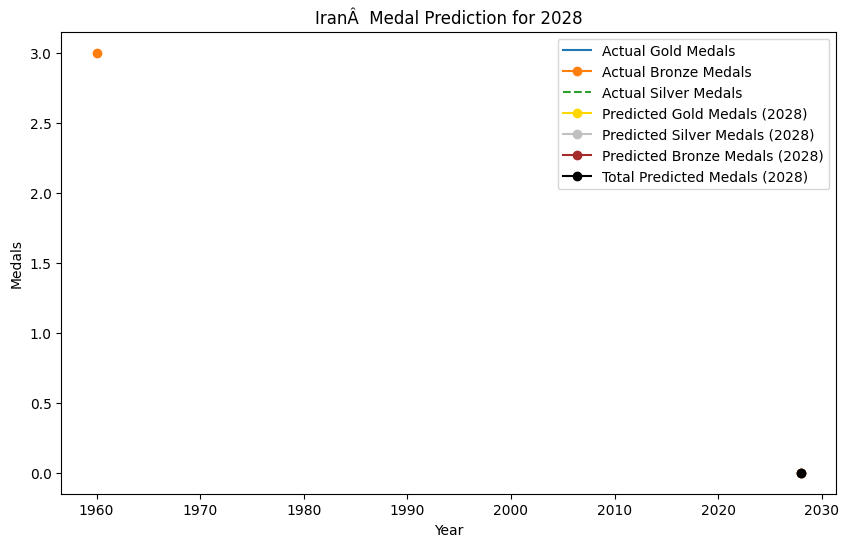

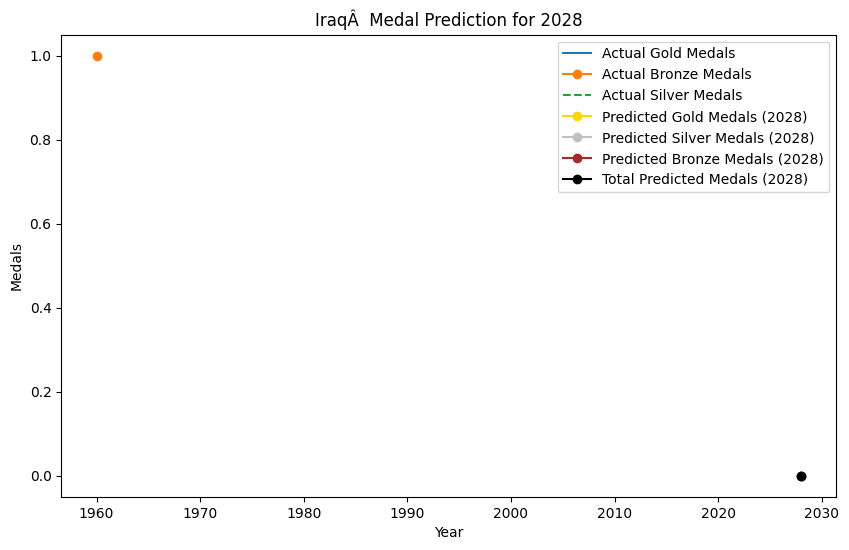

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

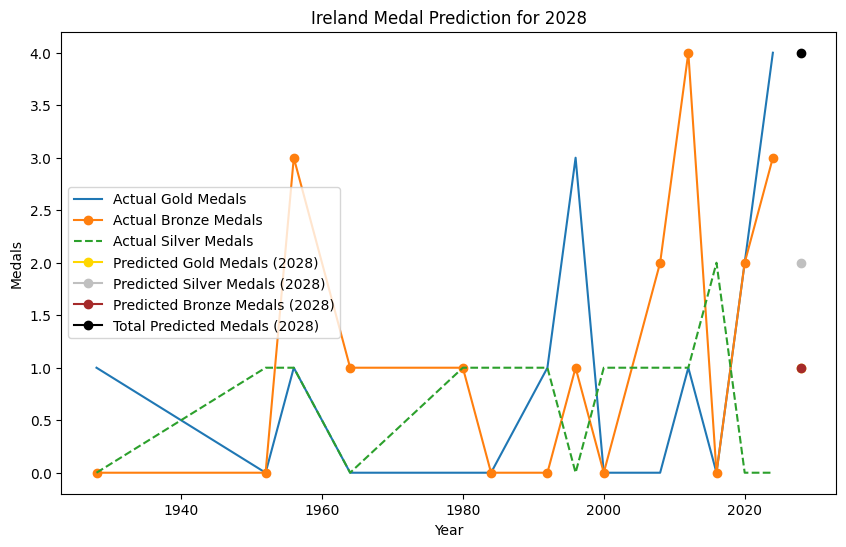

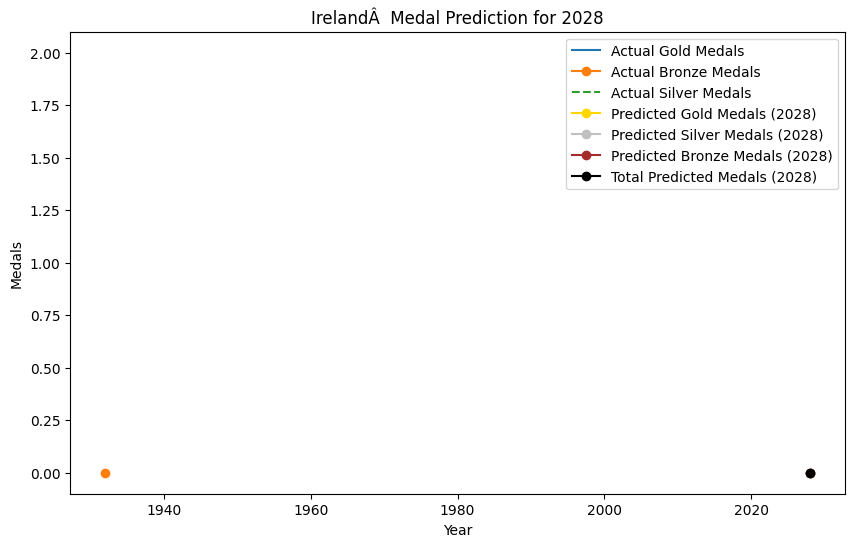

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

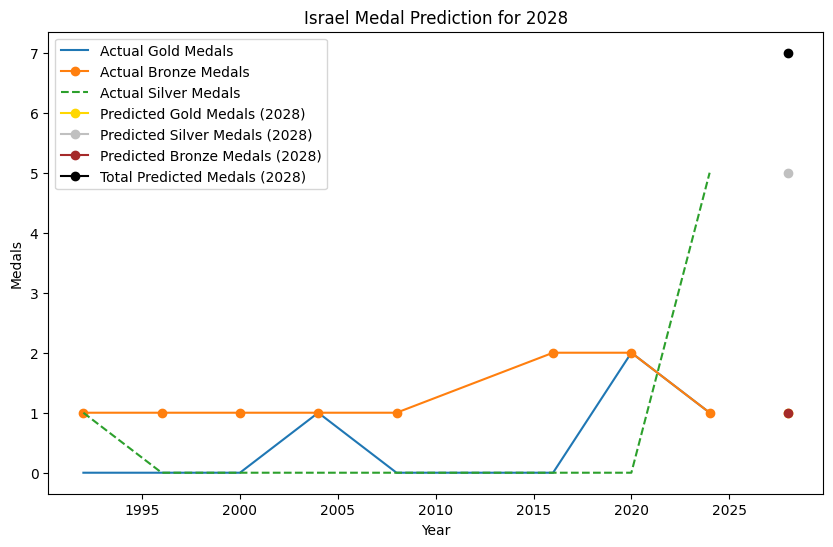

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

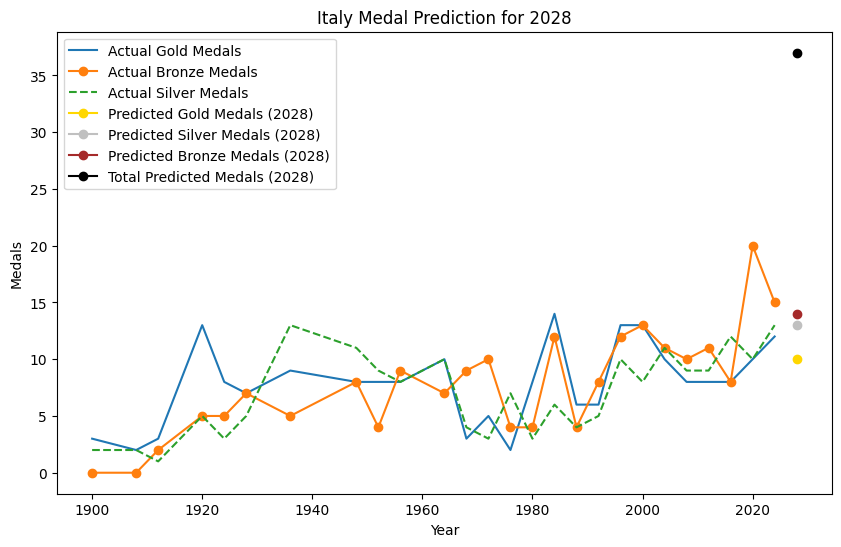

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

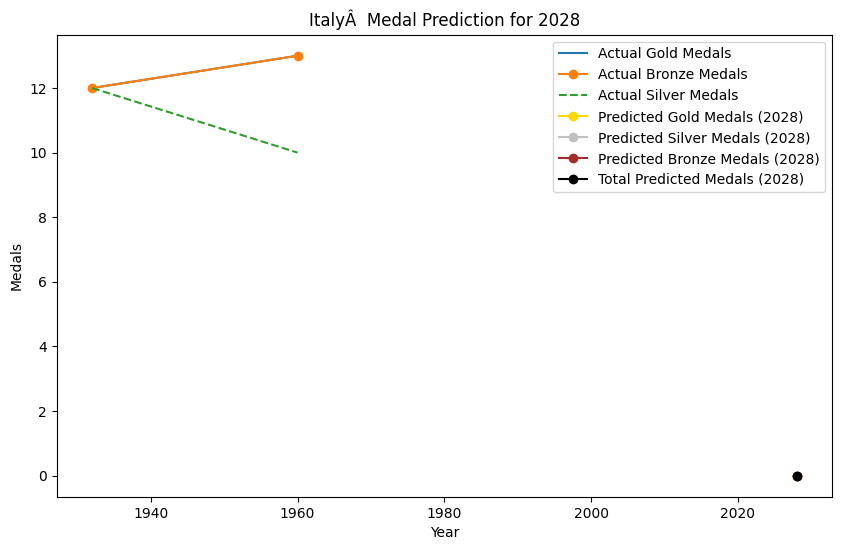

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

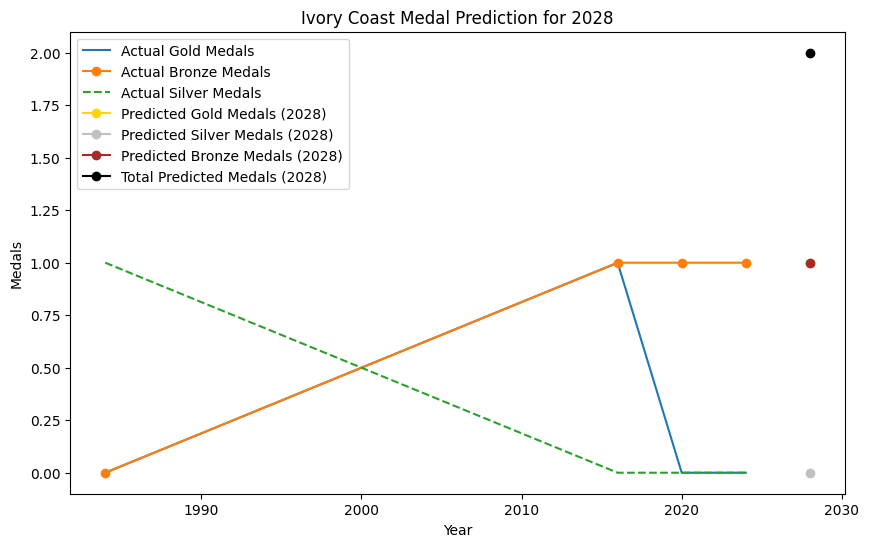

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

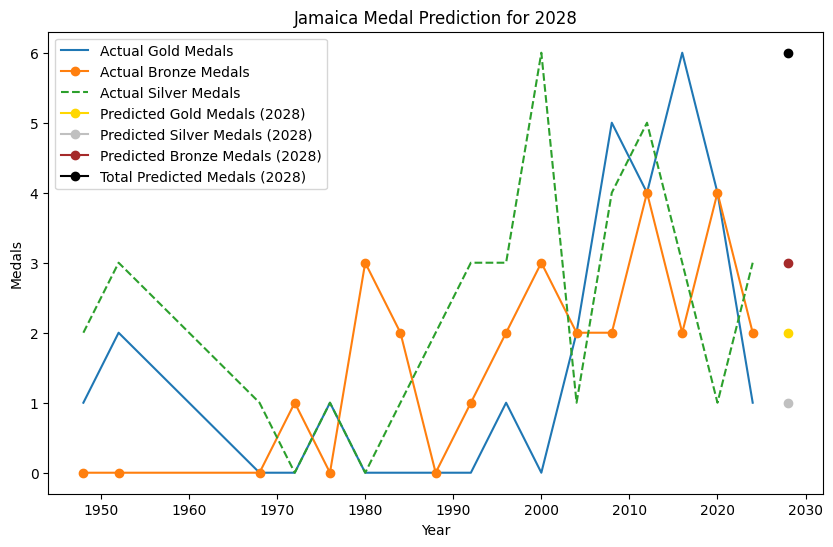

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

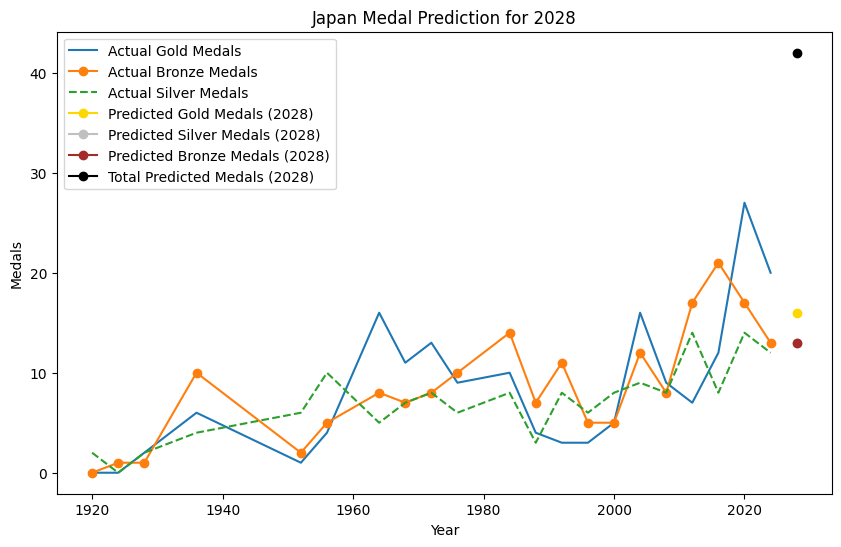

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

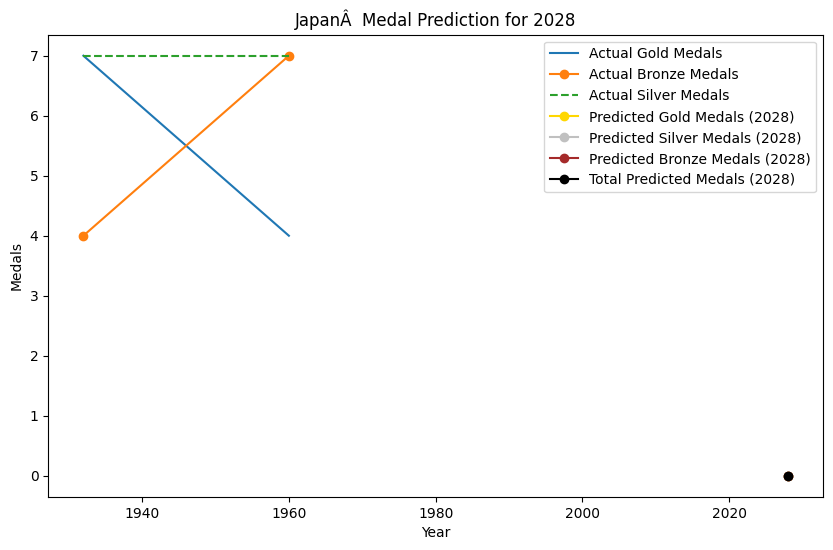

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

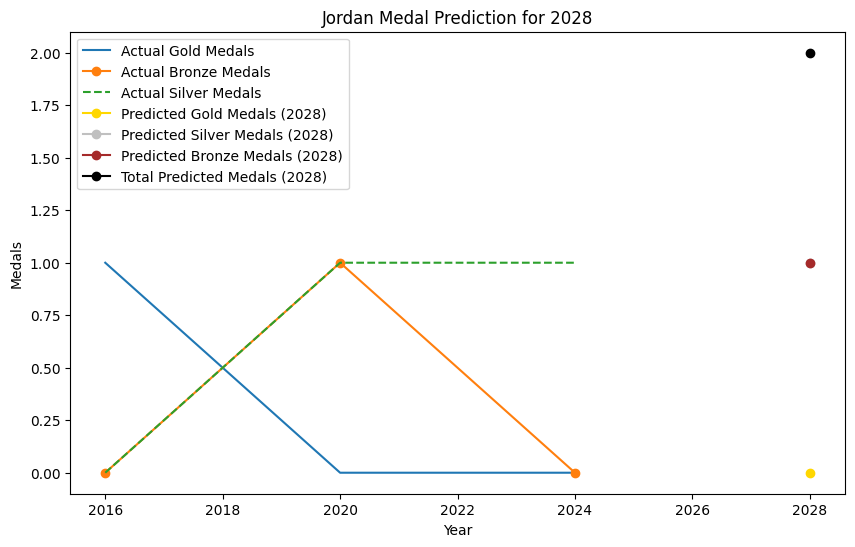

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: Convergenc

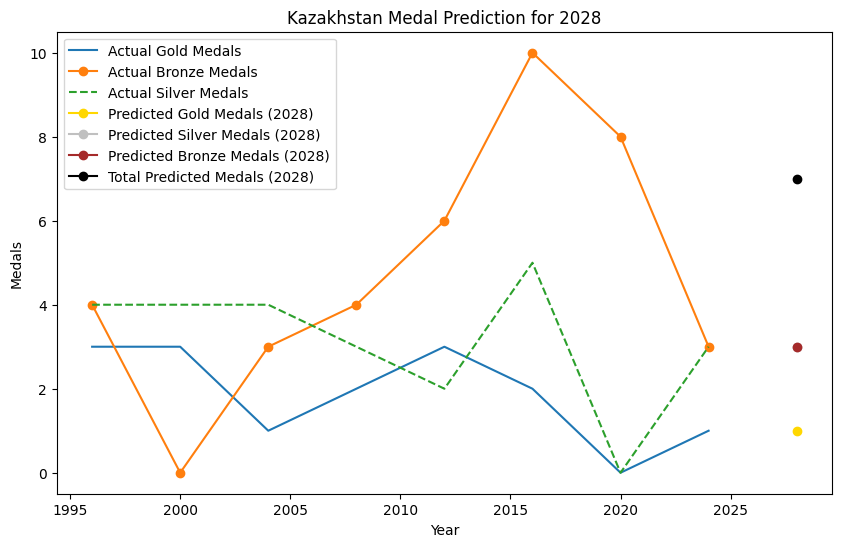

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

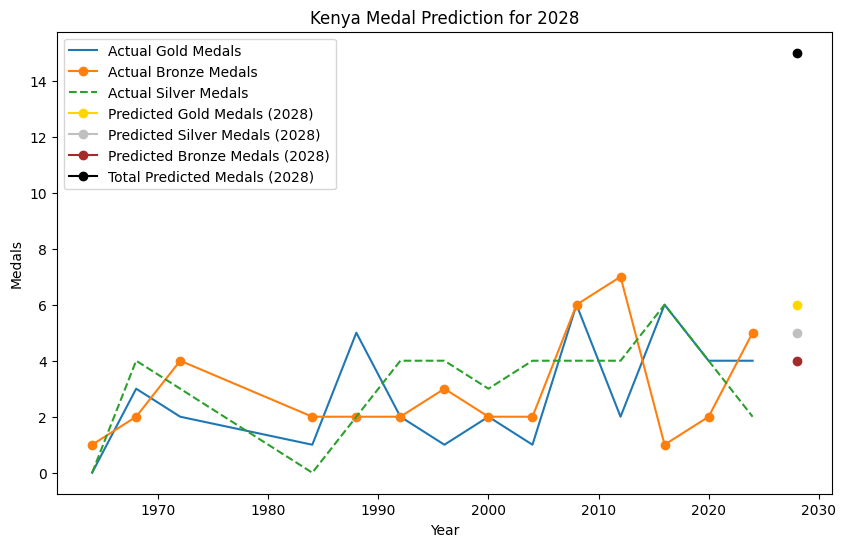

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

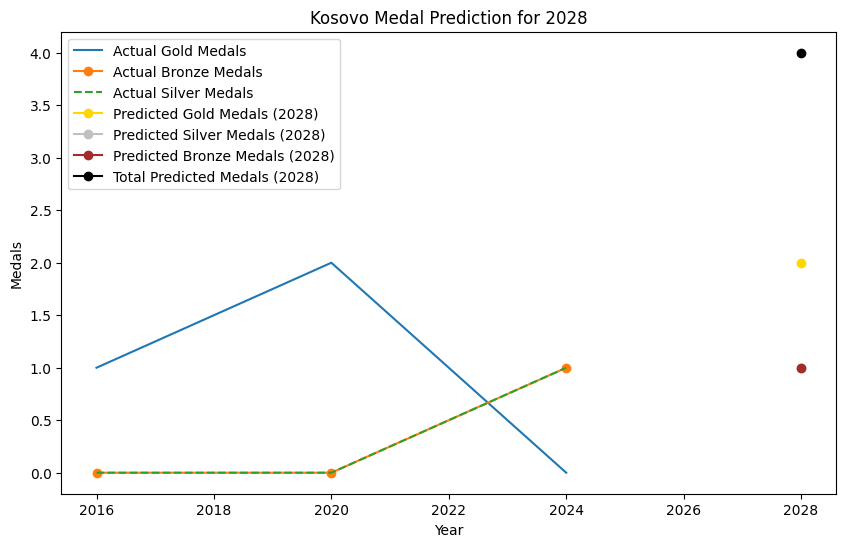

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

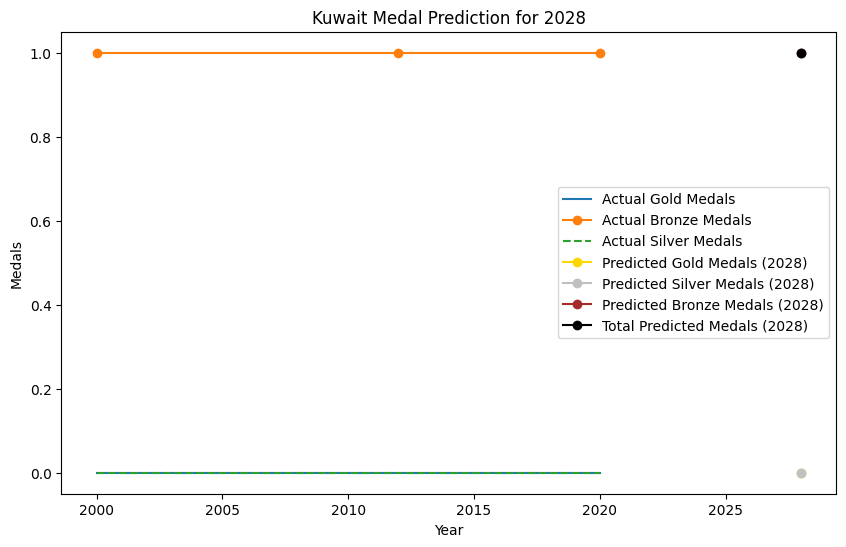

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

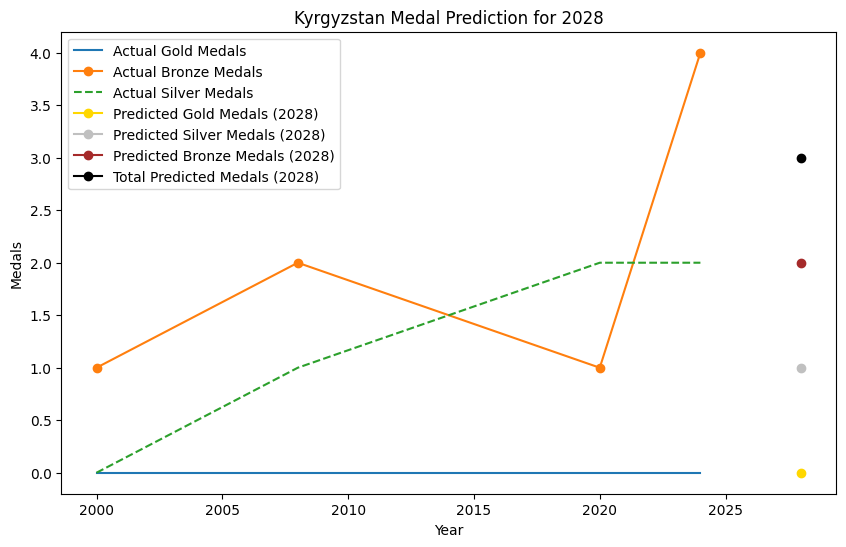

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

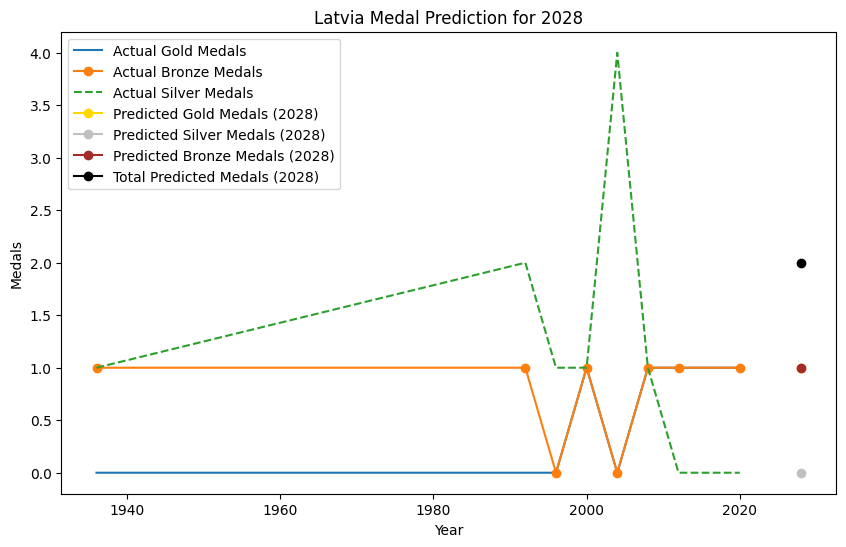

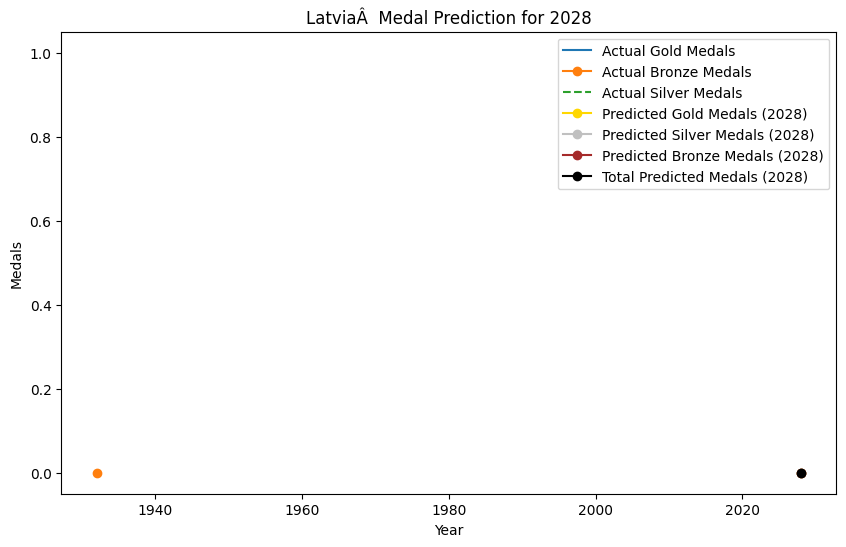

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

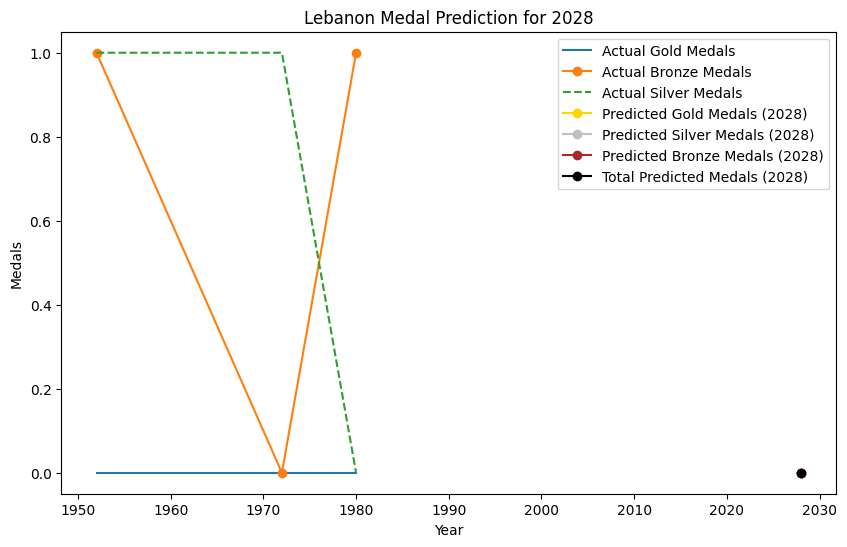

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

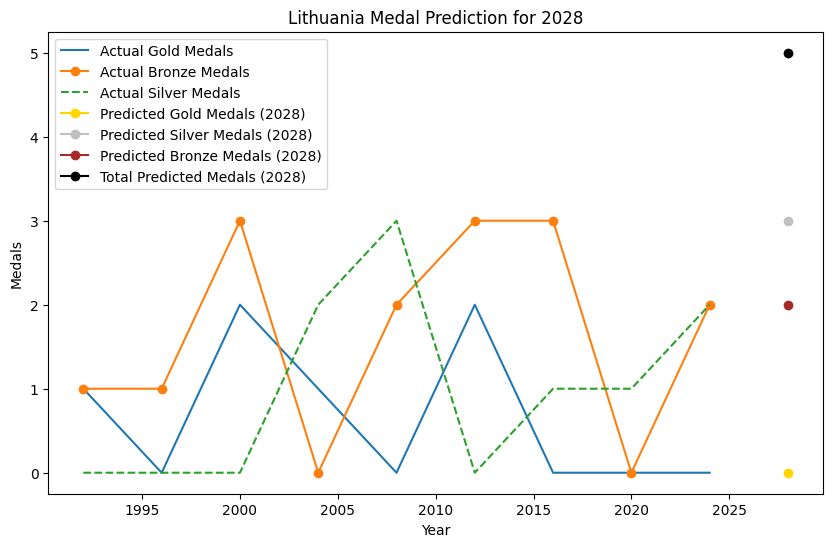

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

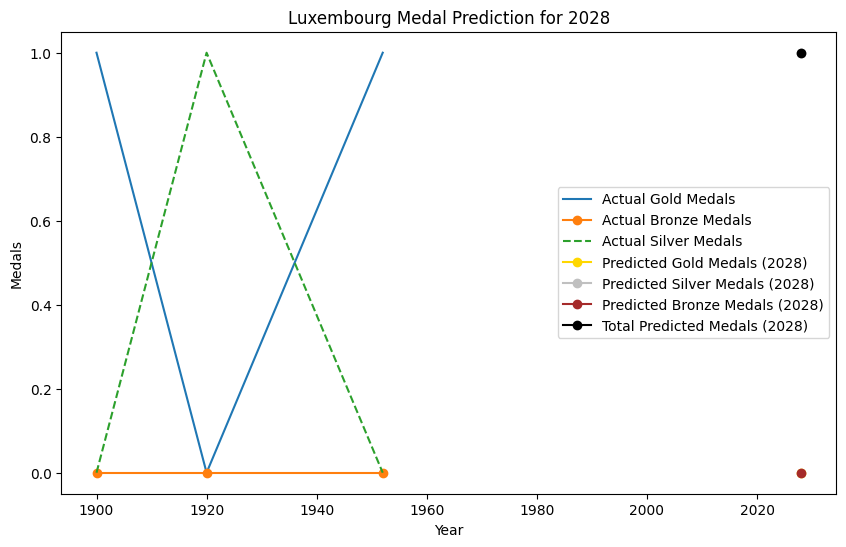

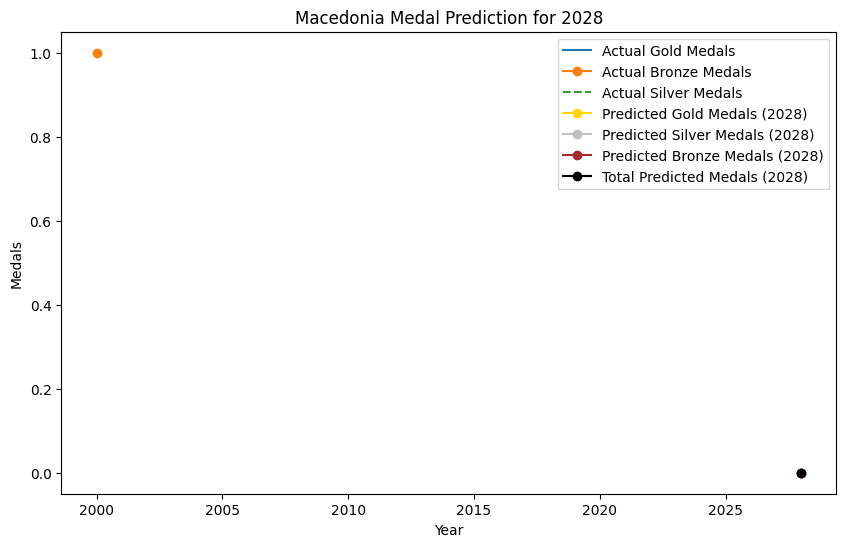

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

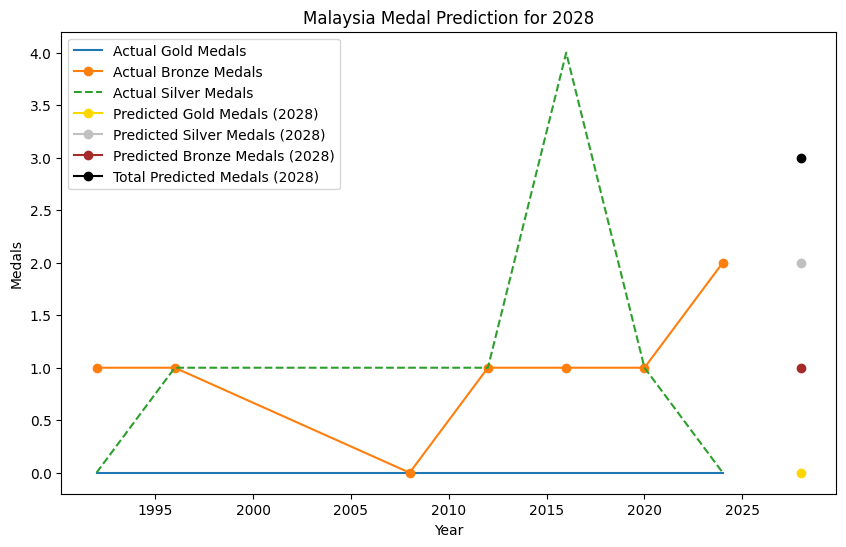

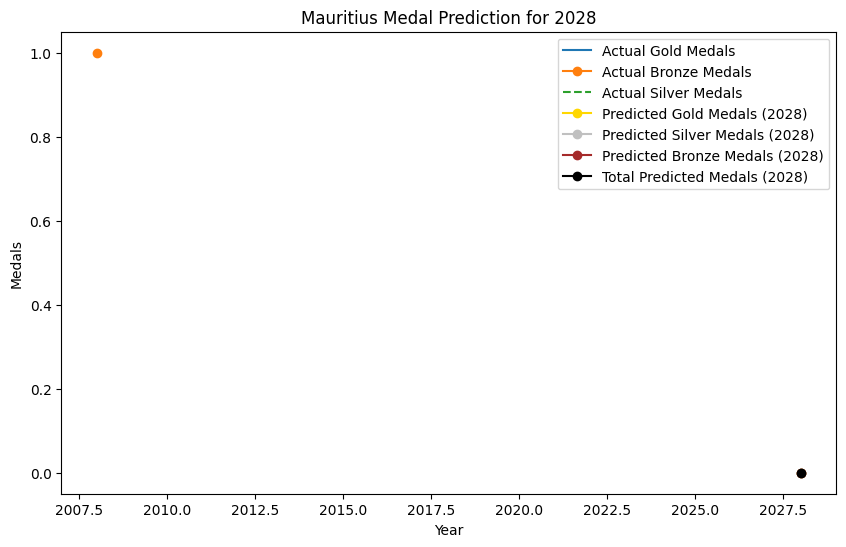

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

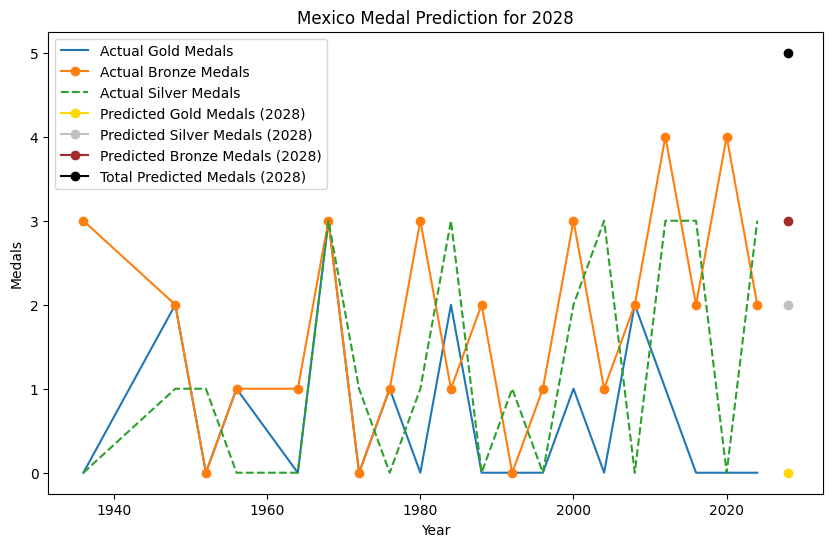

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

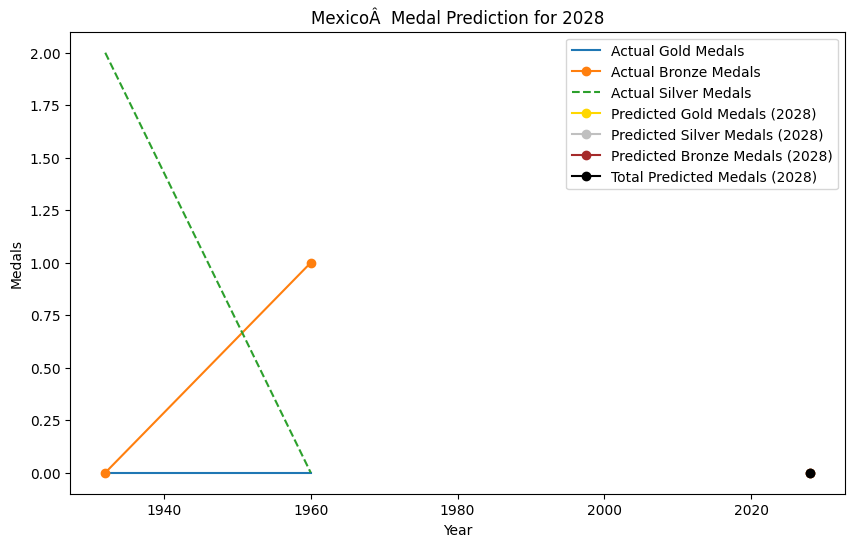

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

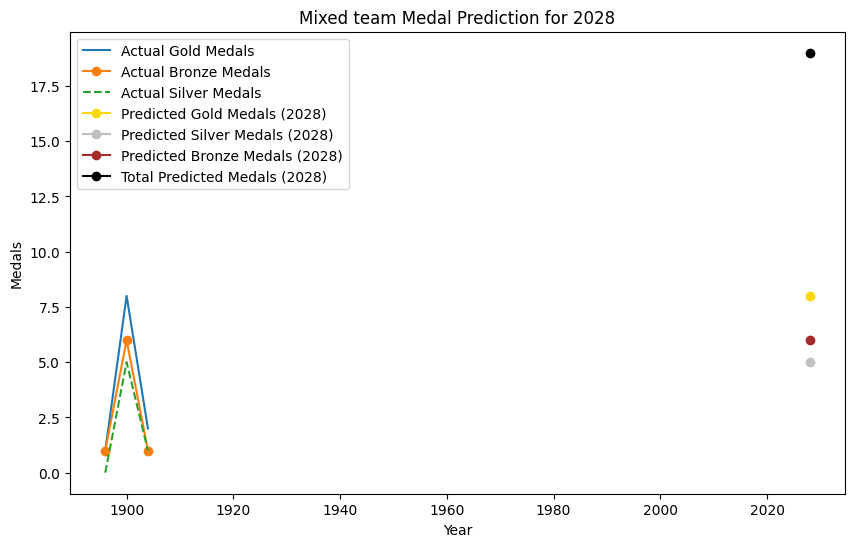

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

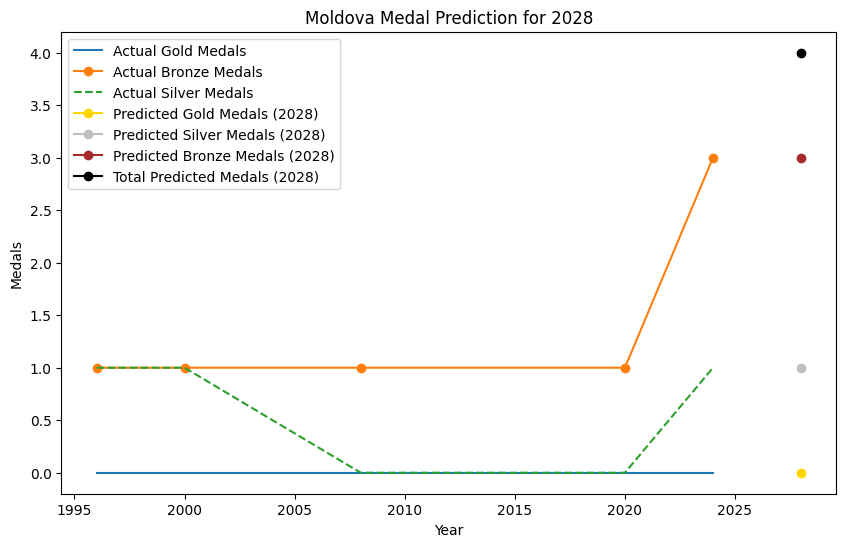

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

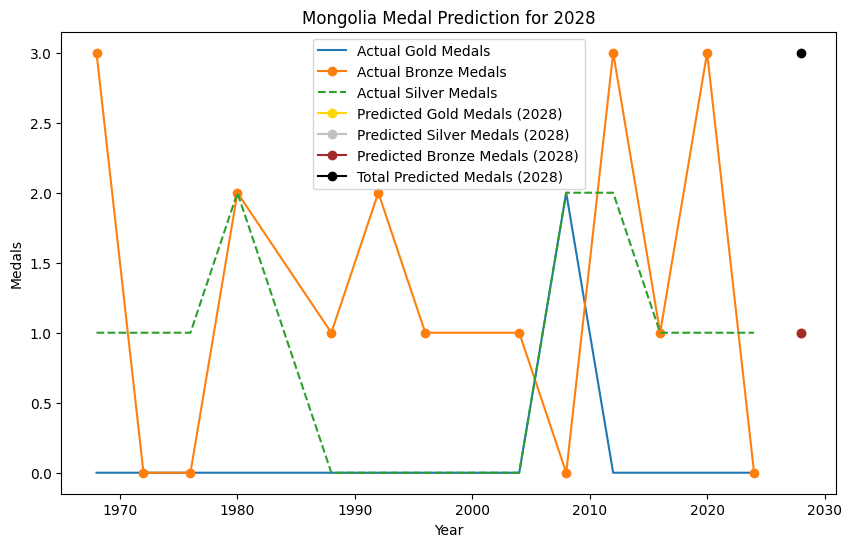

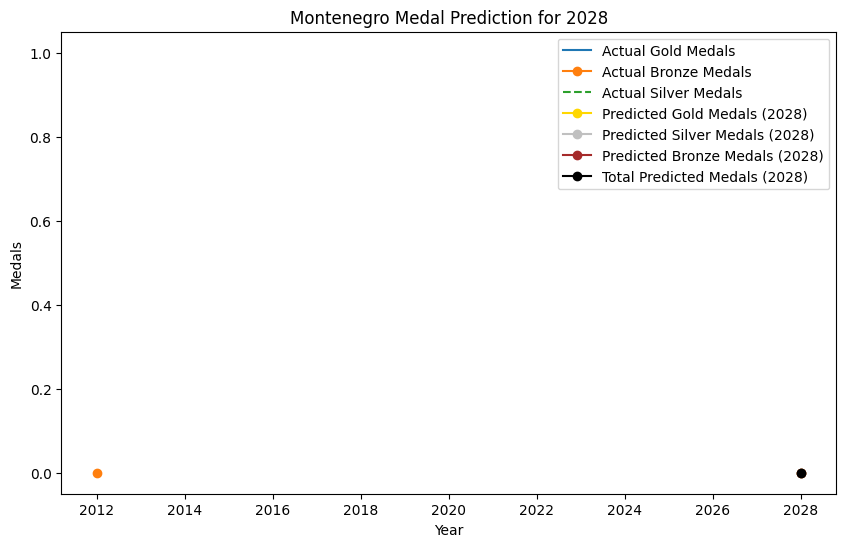

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

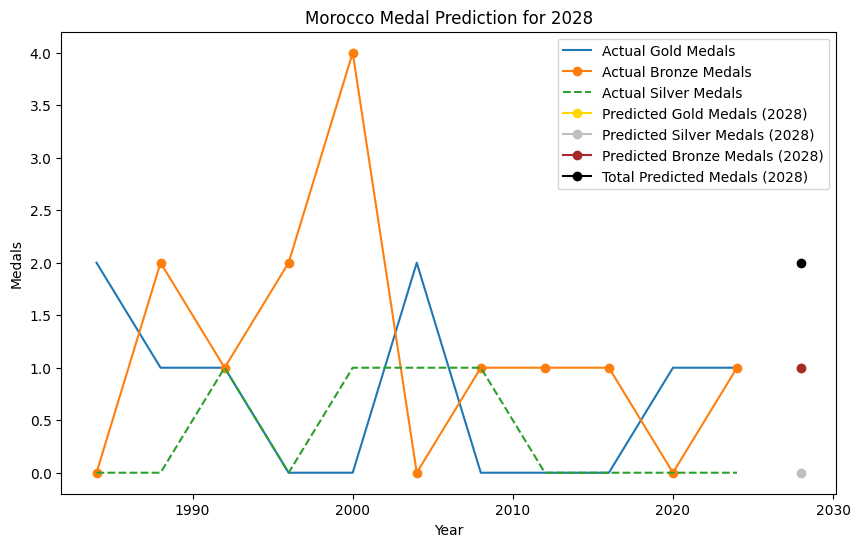

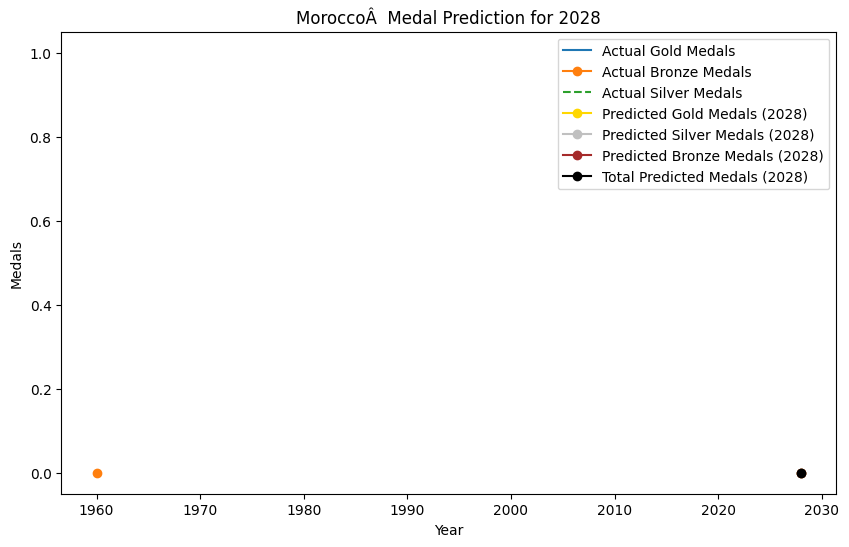

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

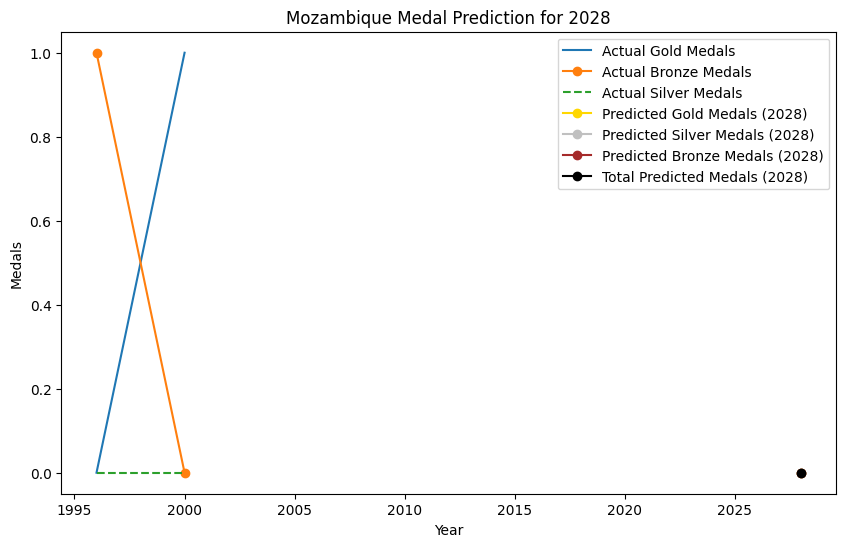

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

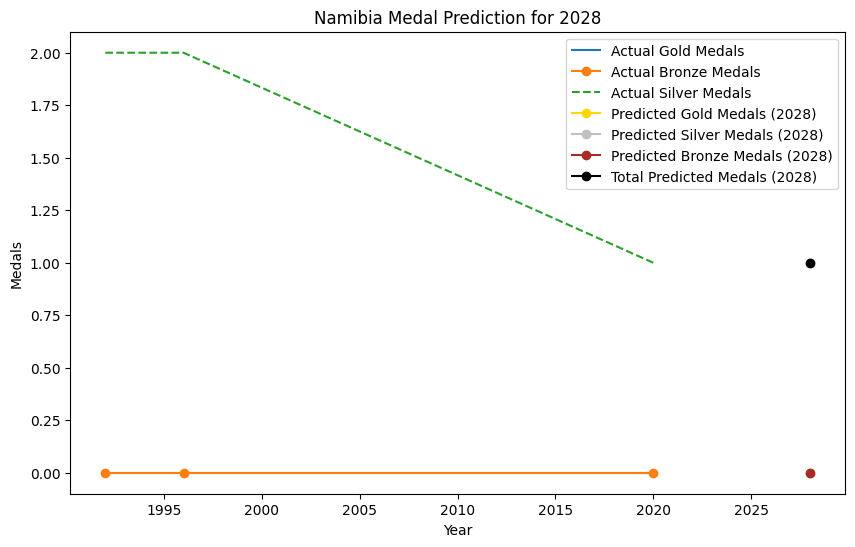

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

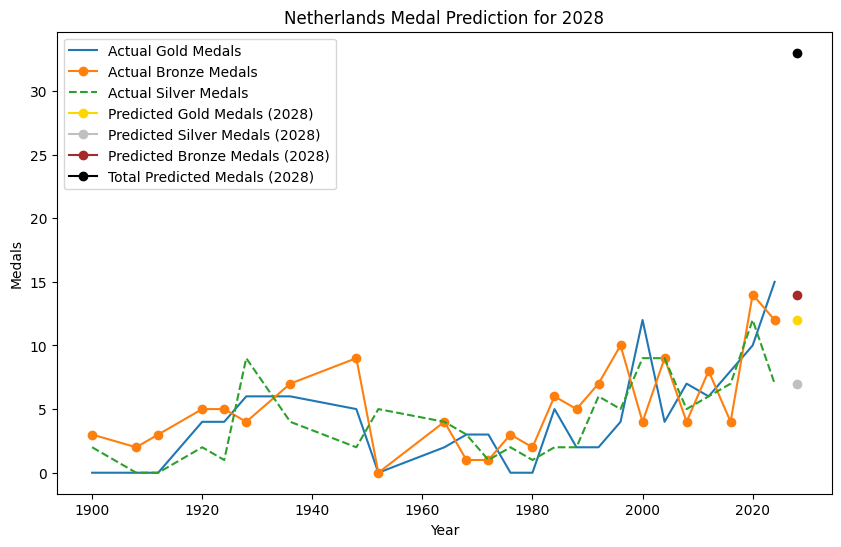

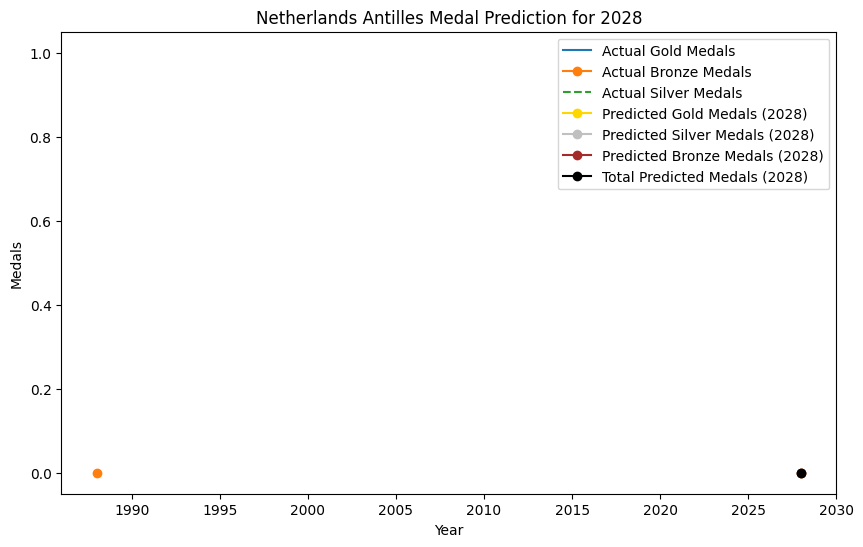

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

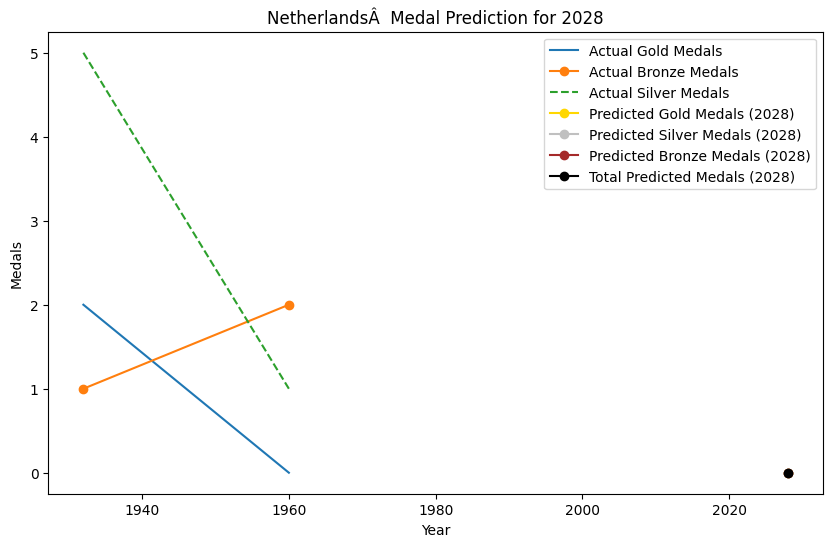

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

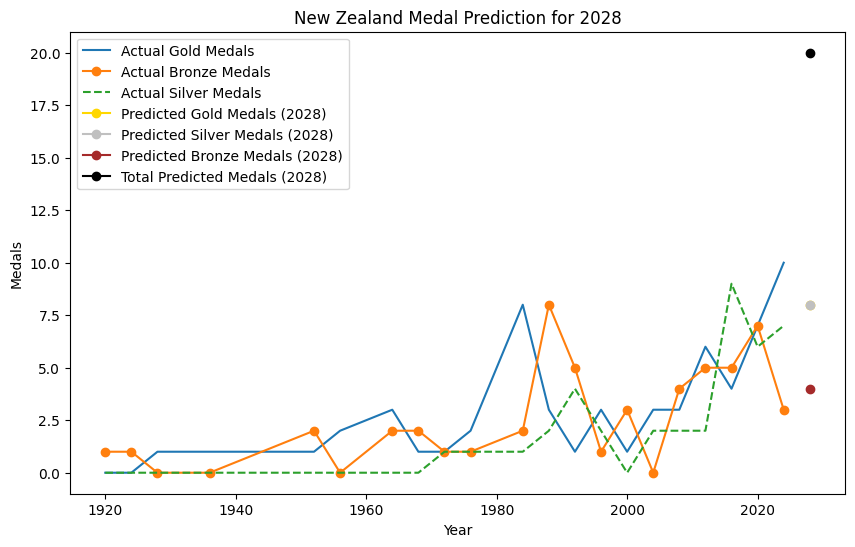

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

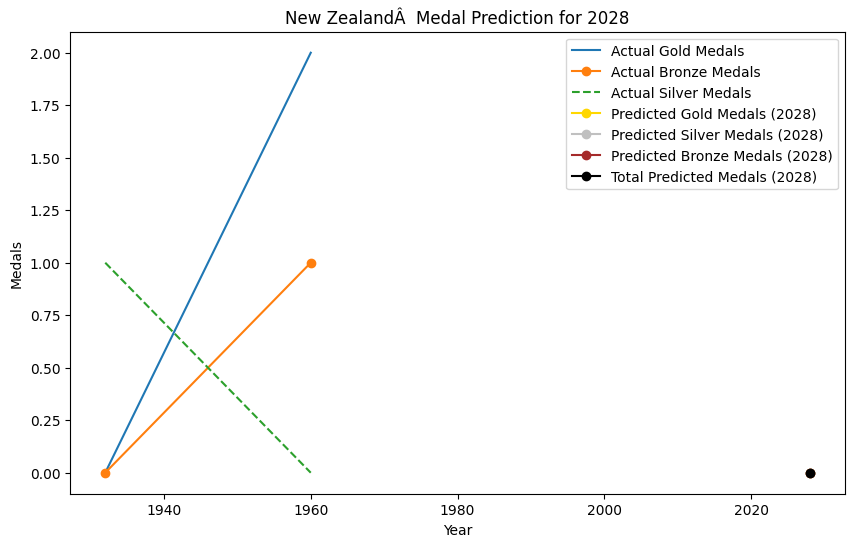

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

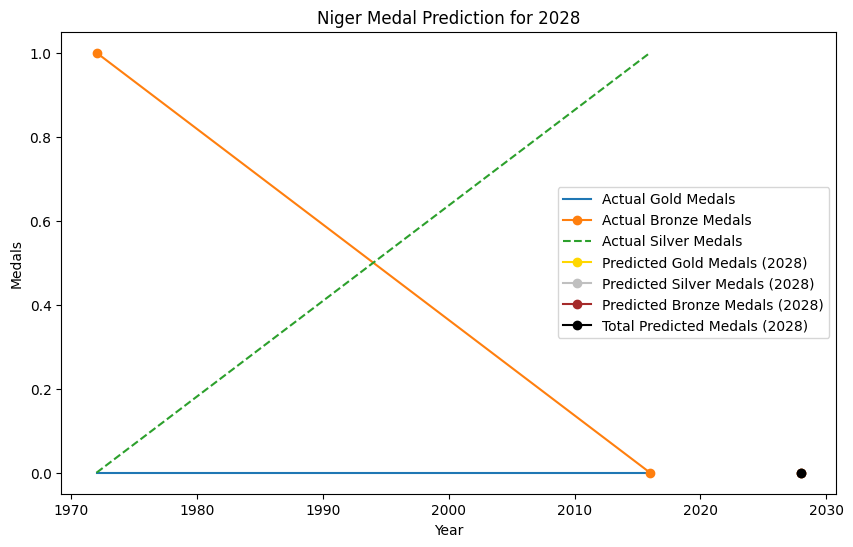

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

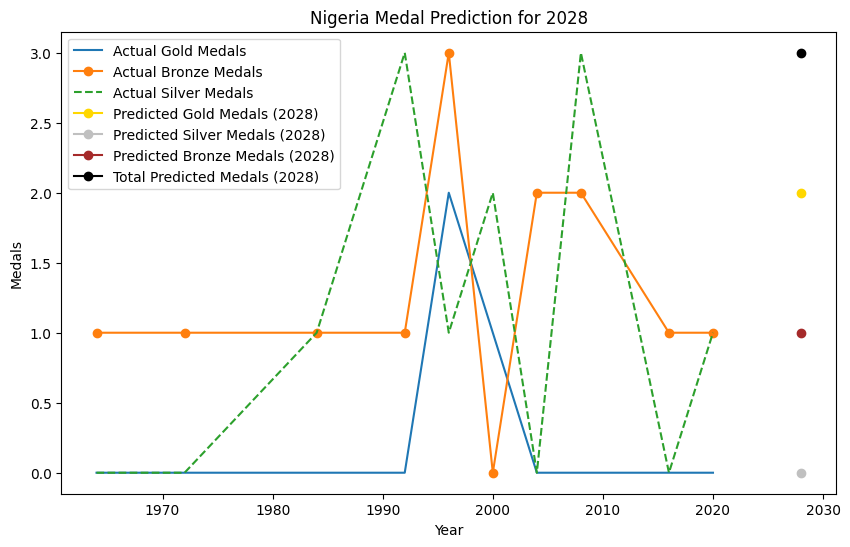

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: Va

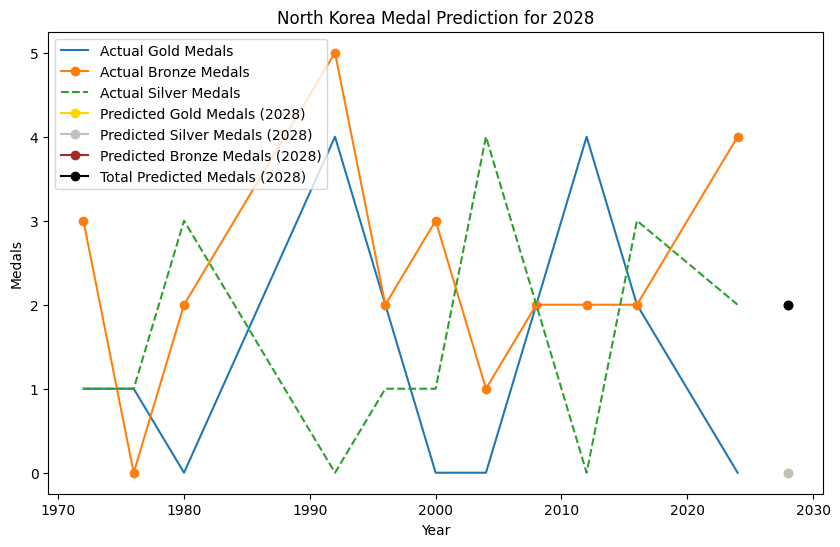

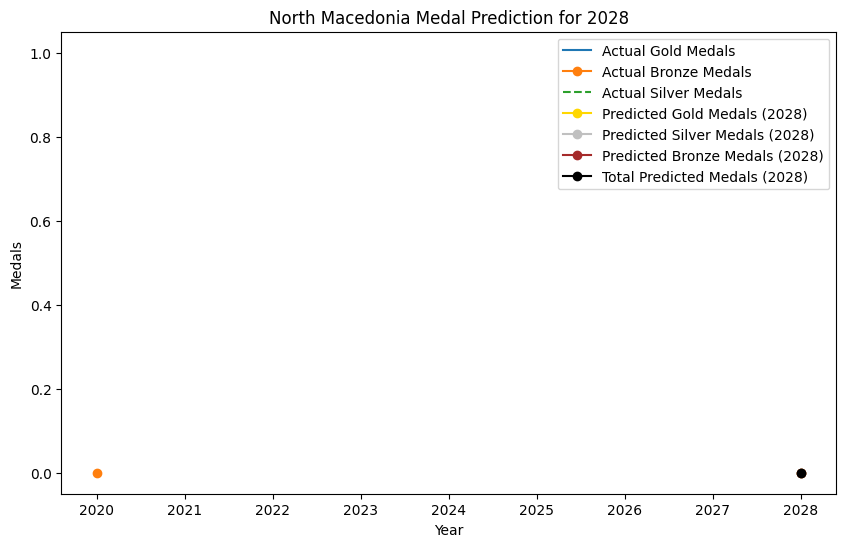

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

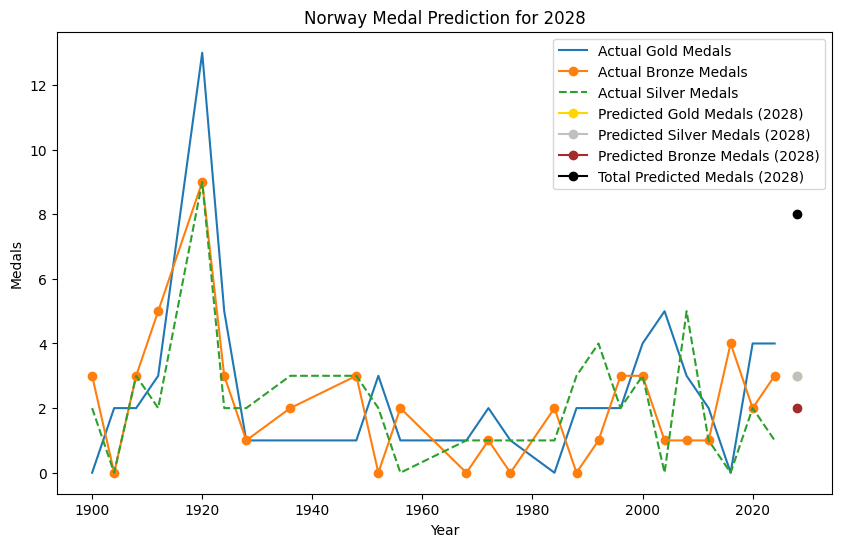

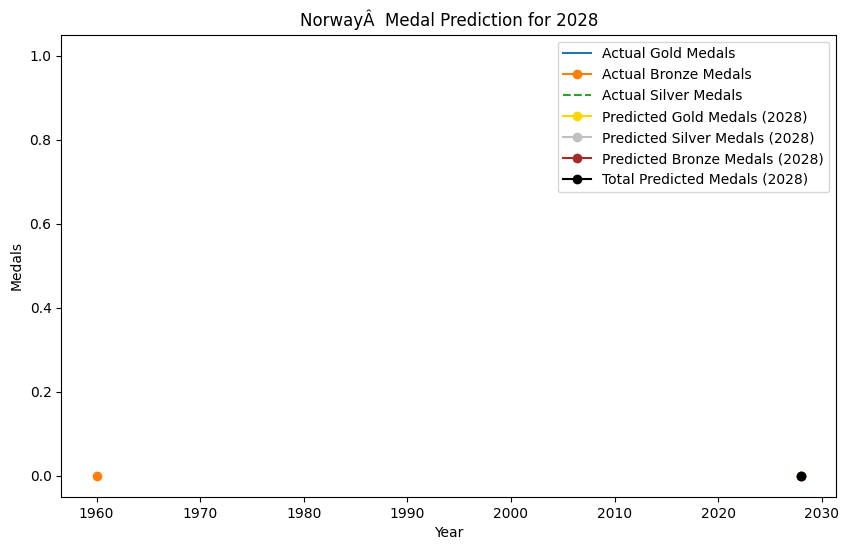

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

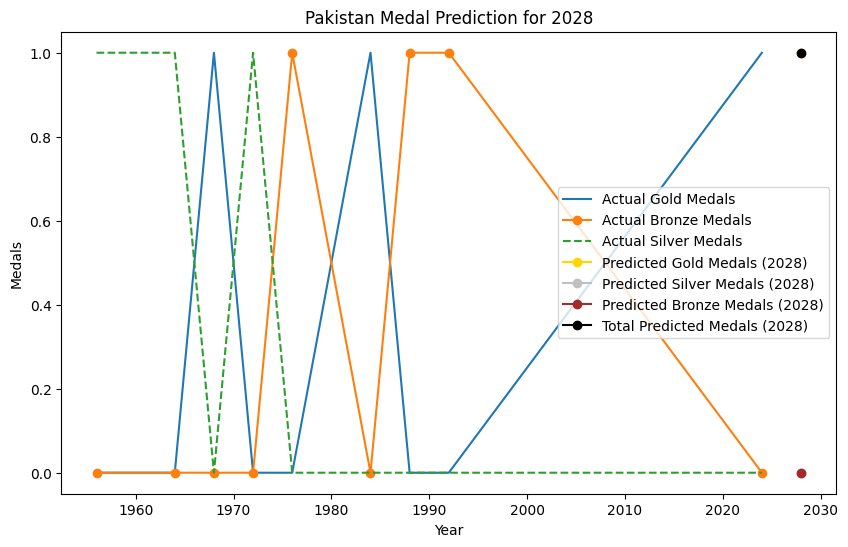

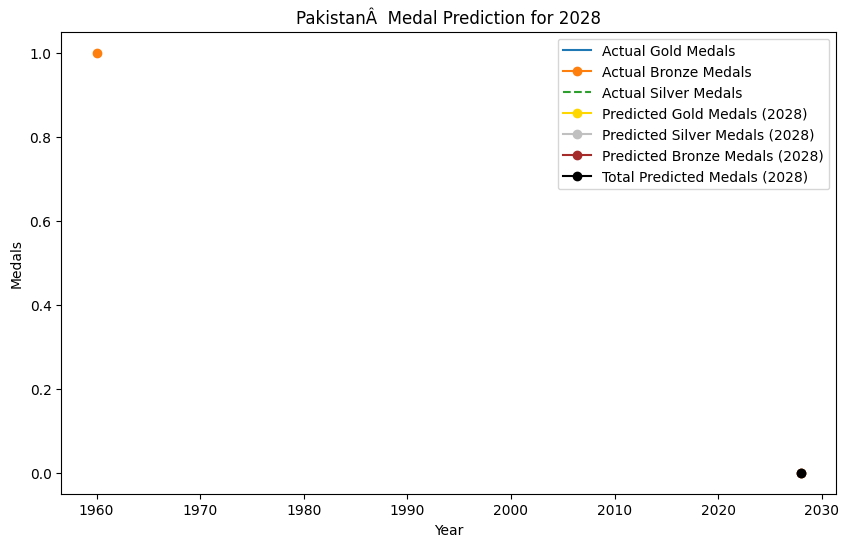

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

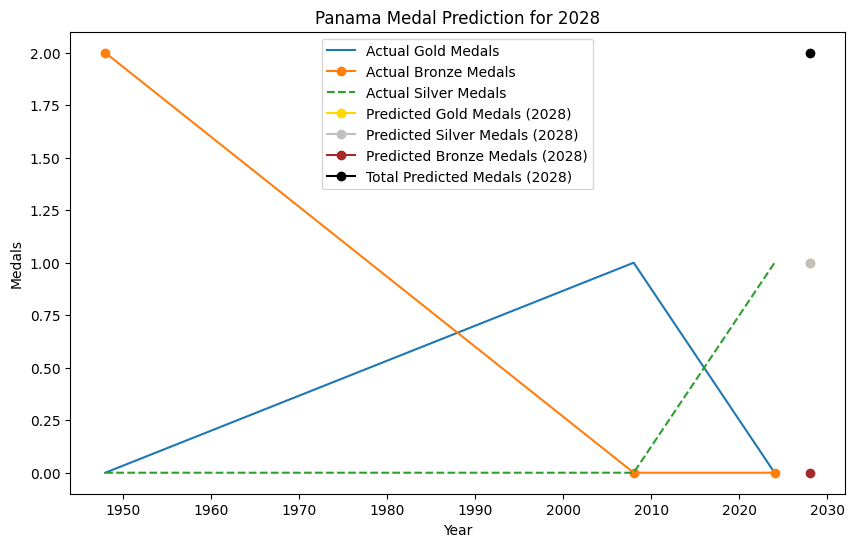

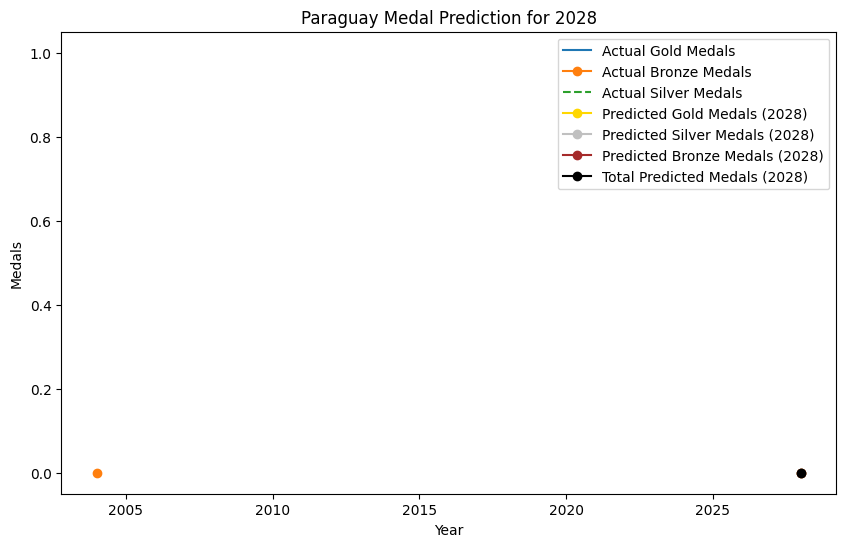

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

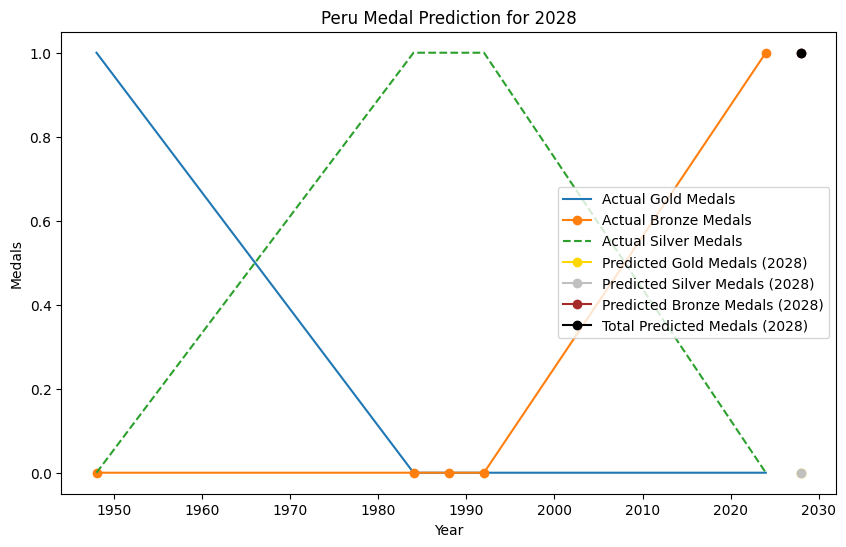

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

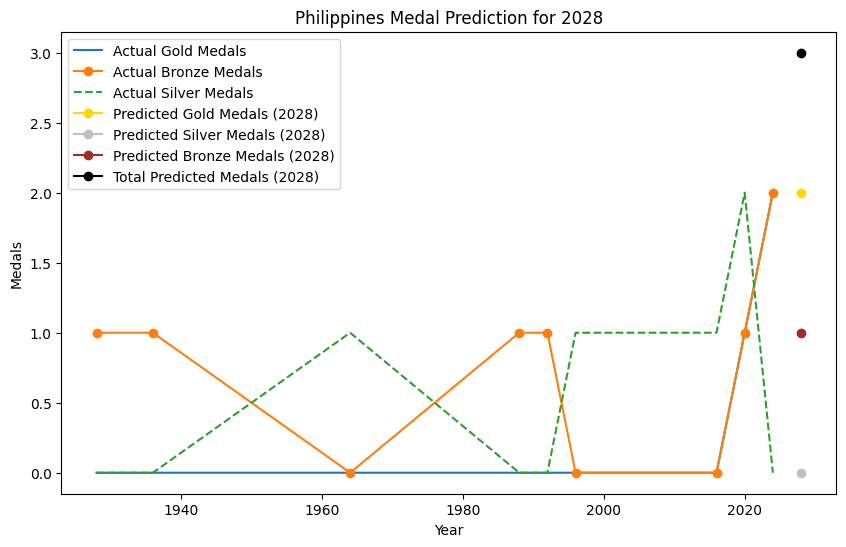

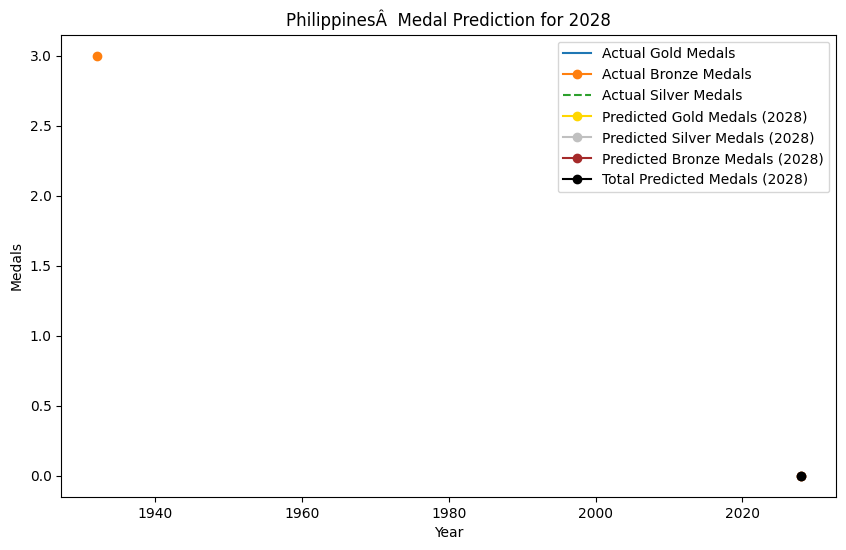

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

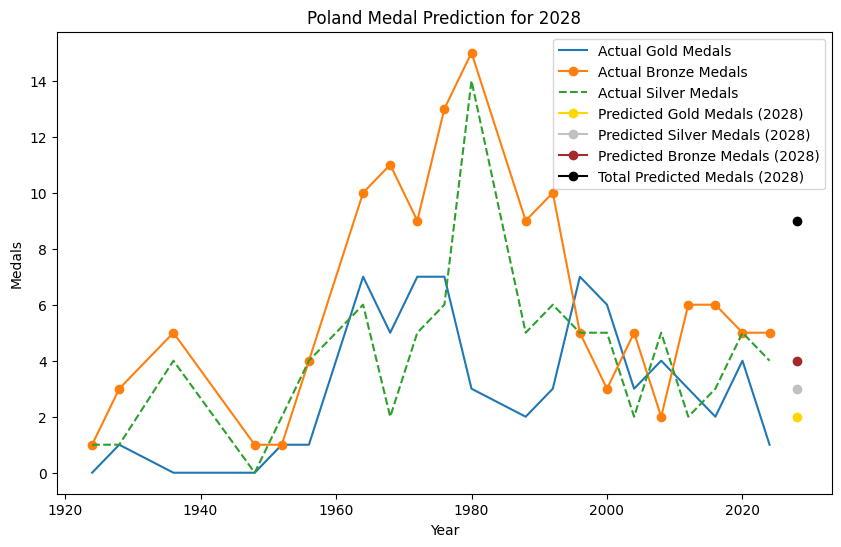

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

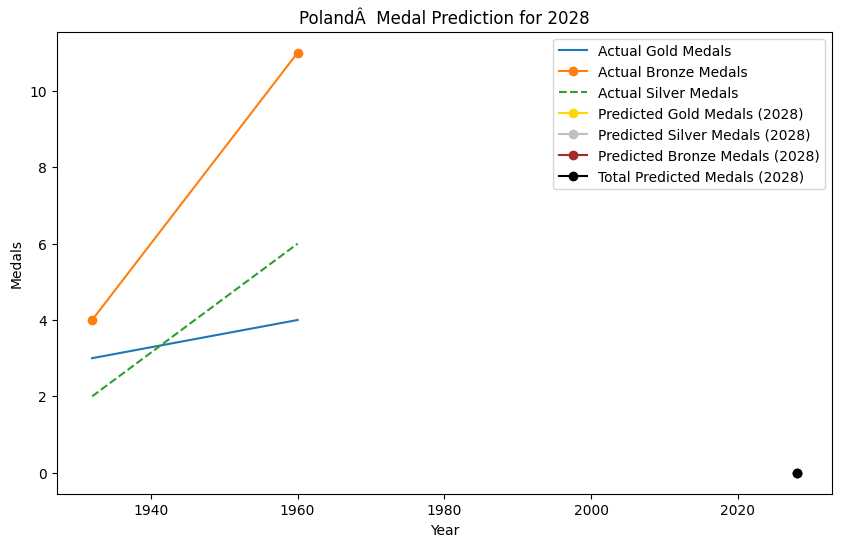

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

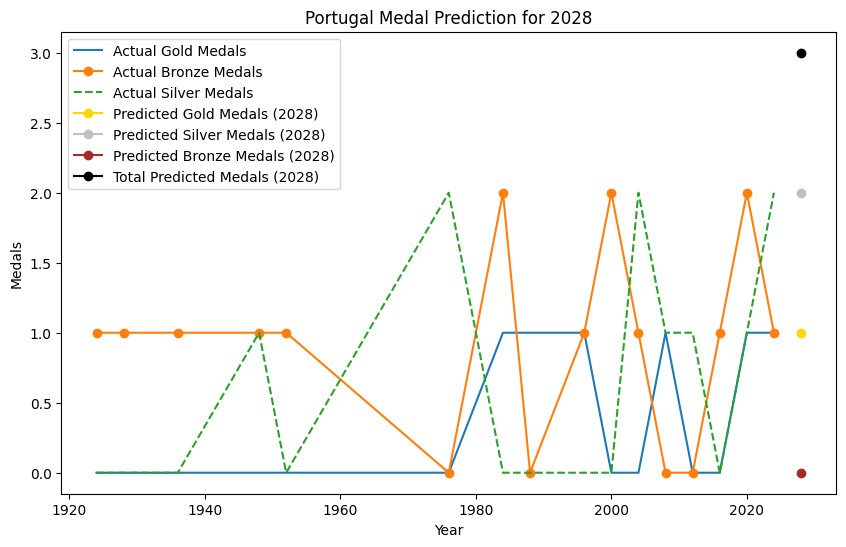

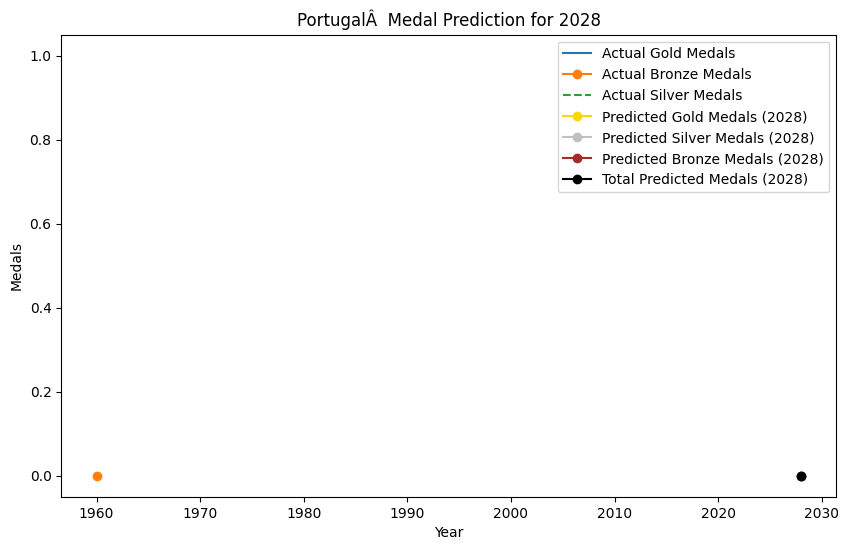

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

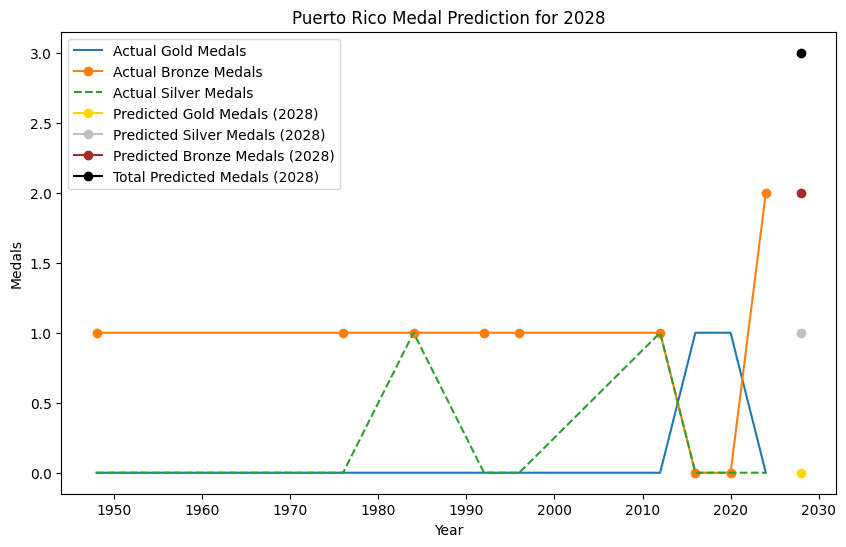

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

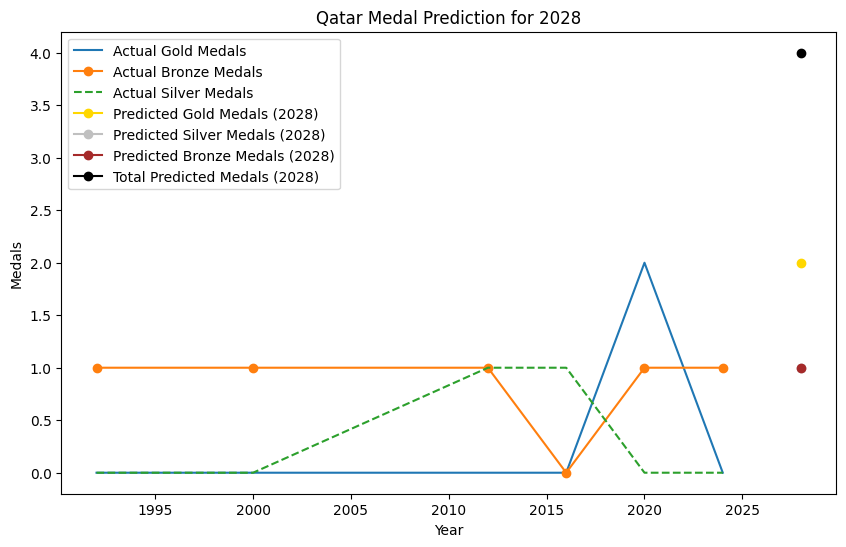

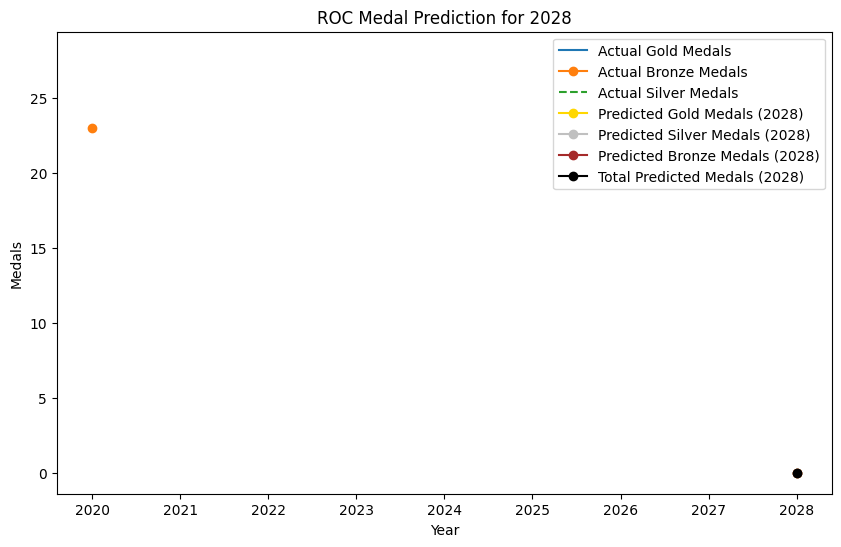

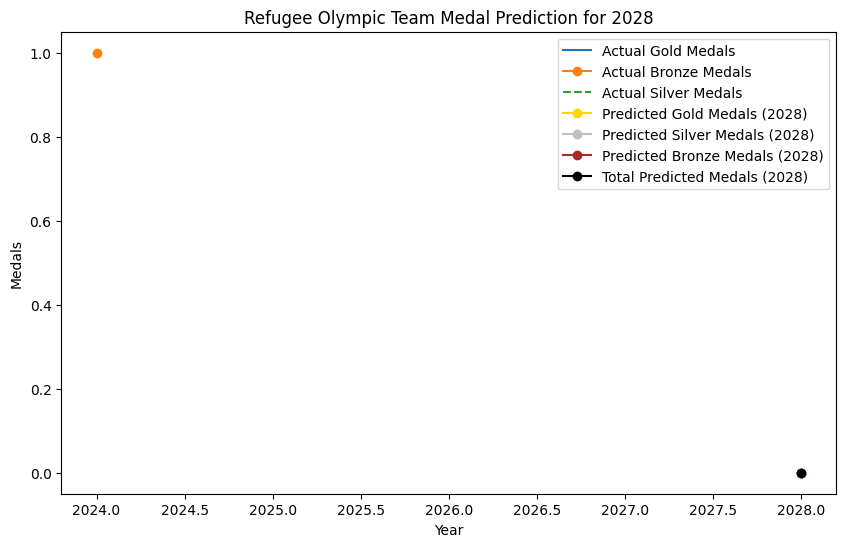

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

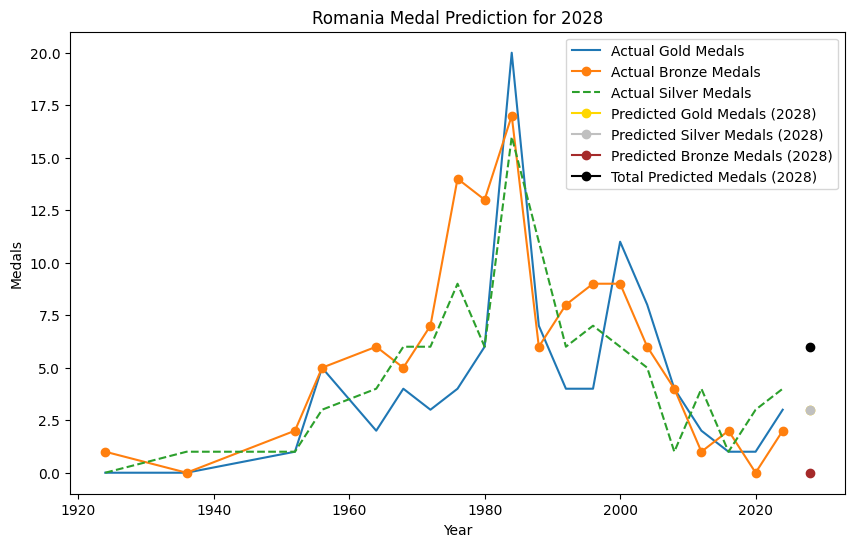

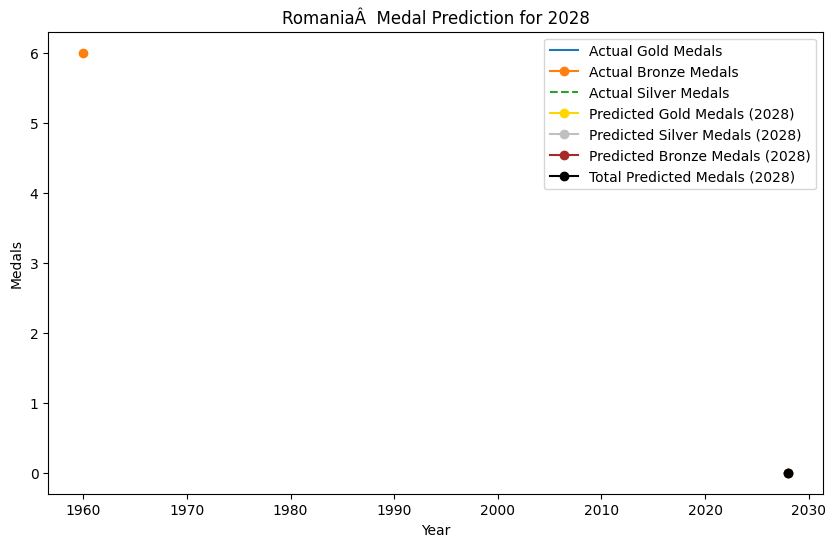

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

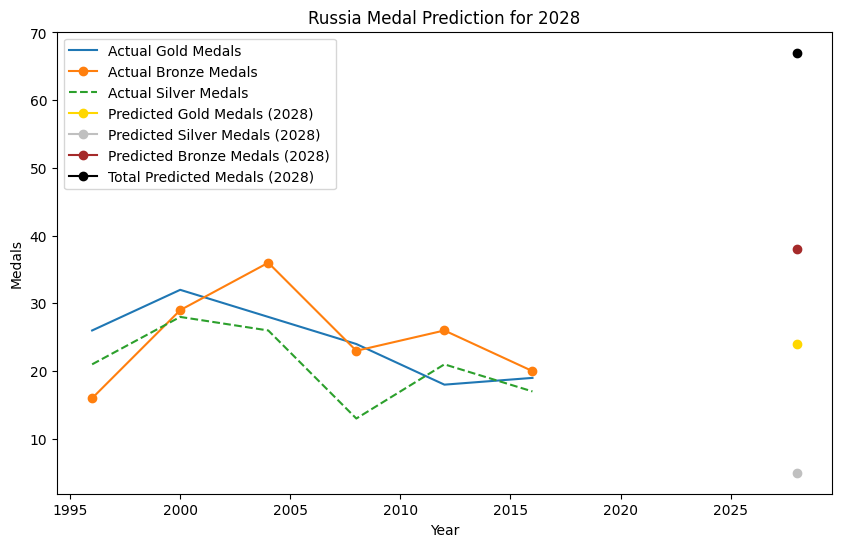

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

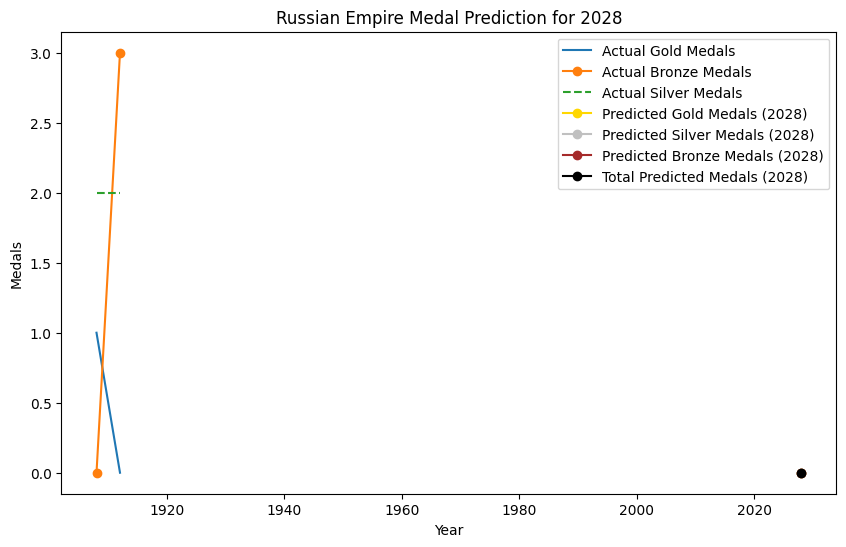

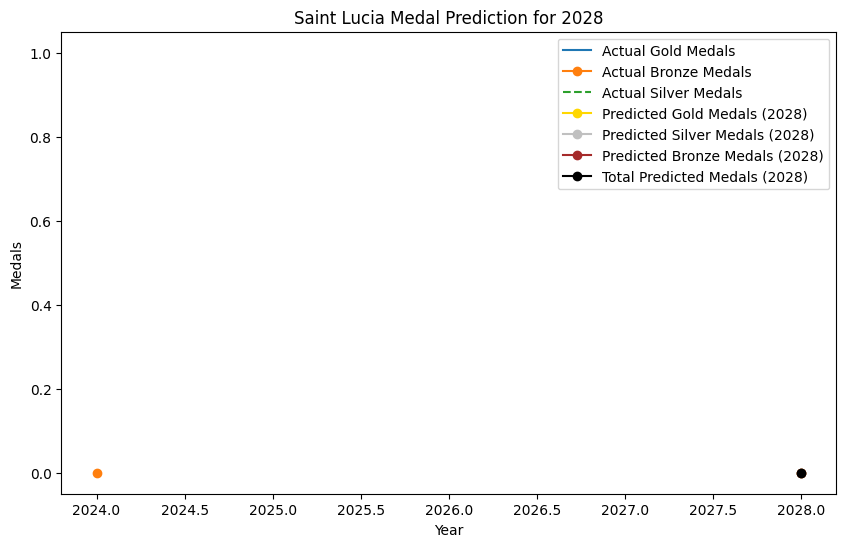

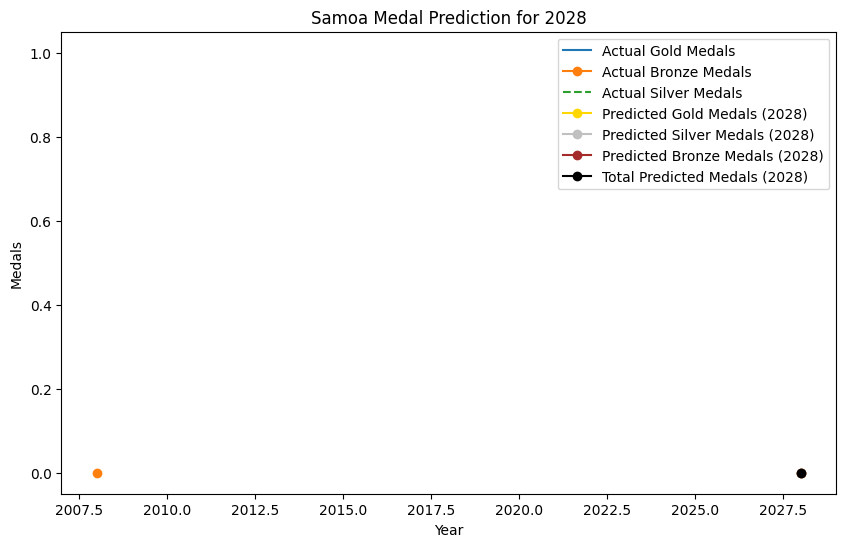

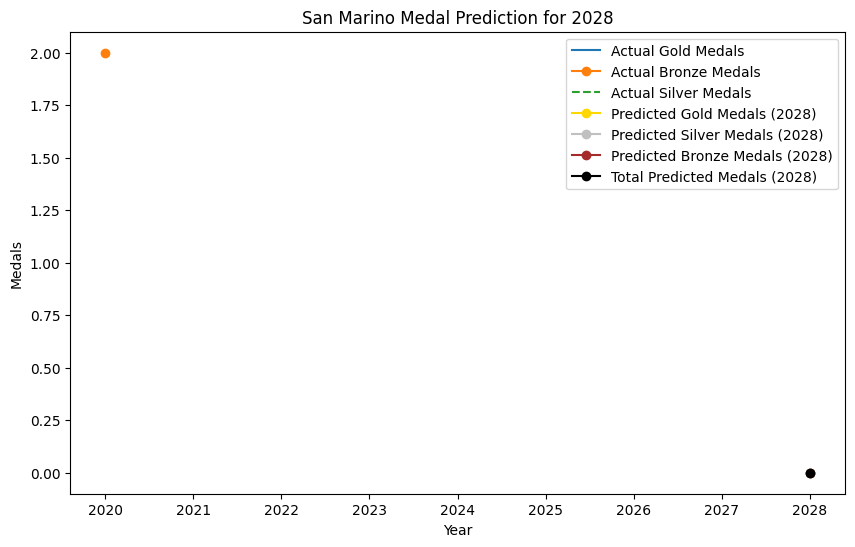

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

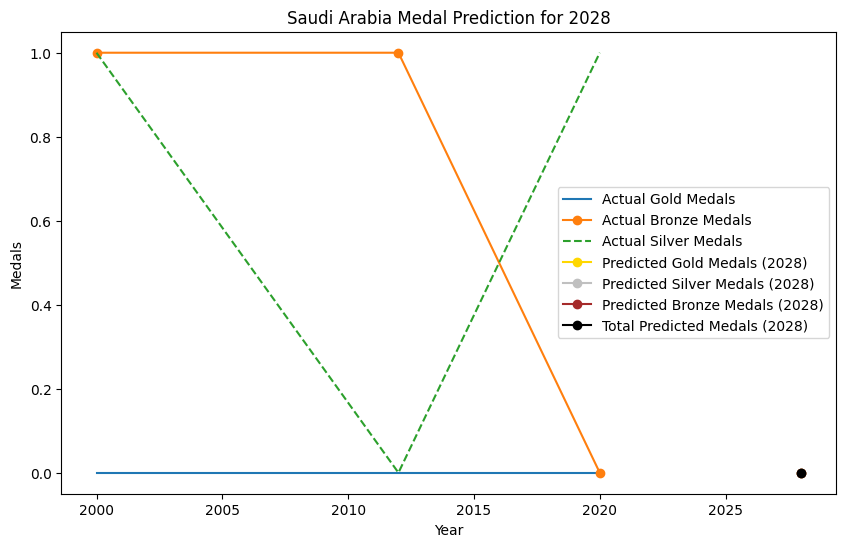

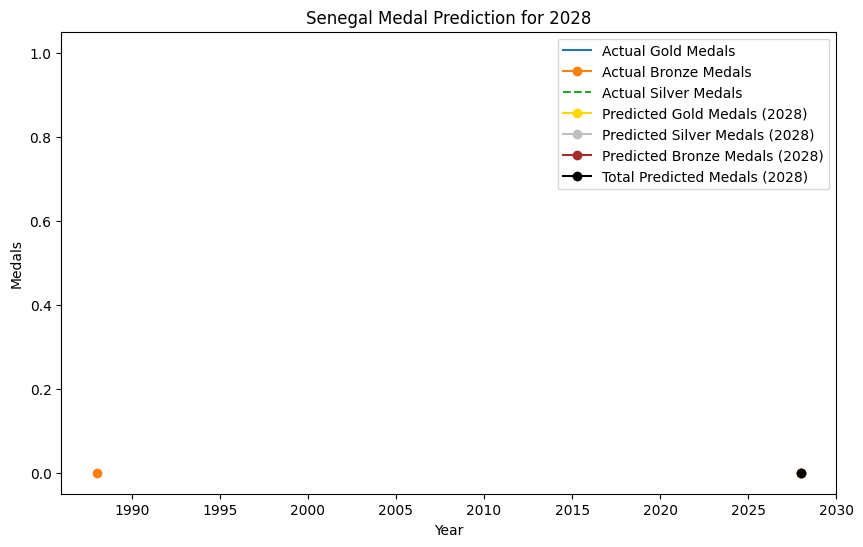

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

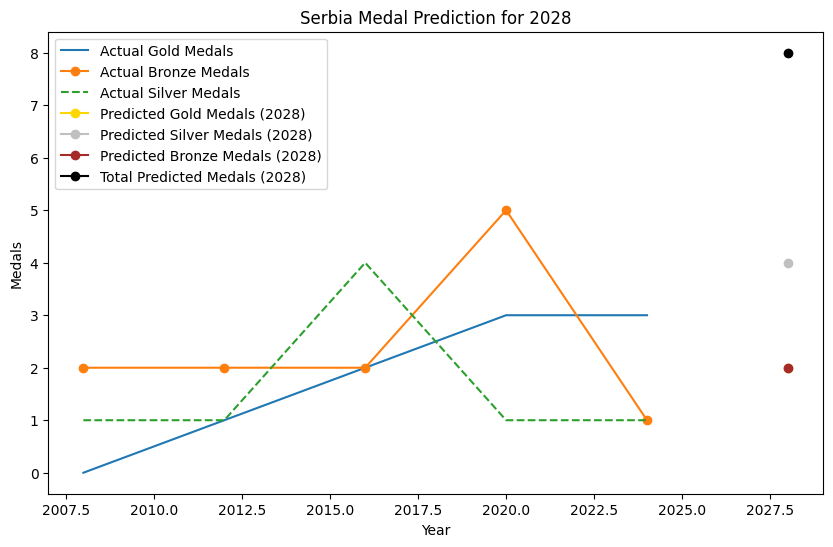

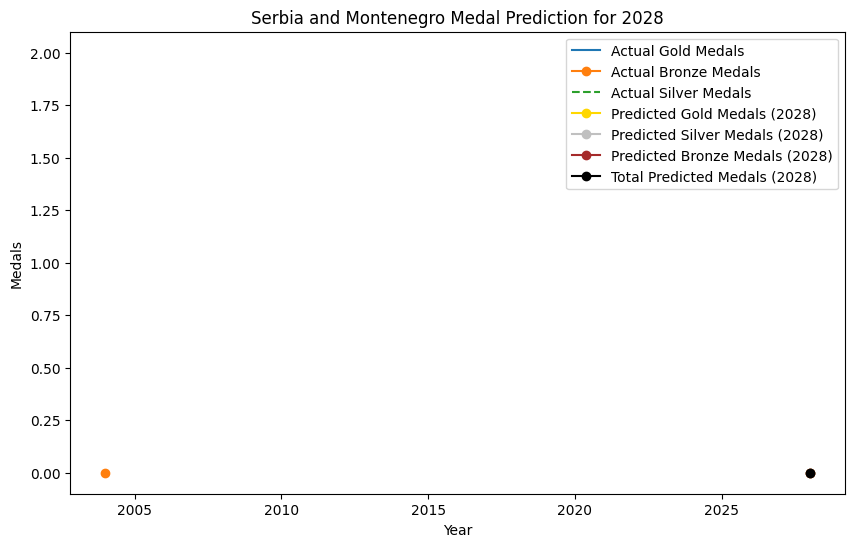

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

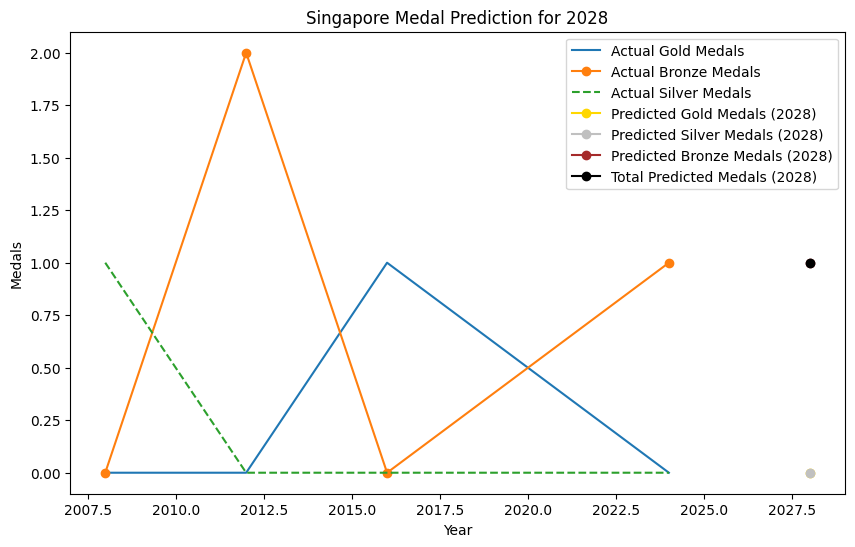

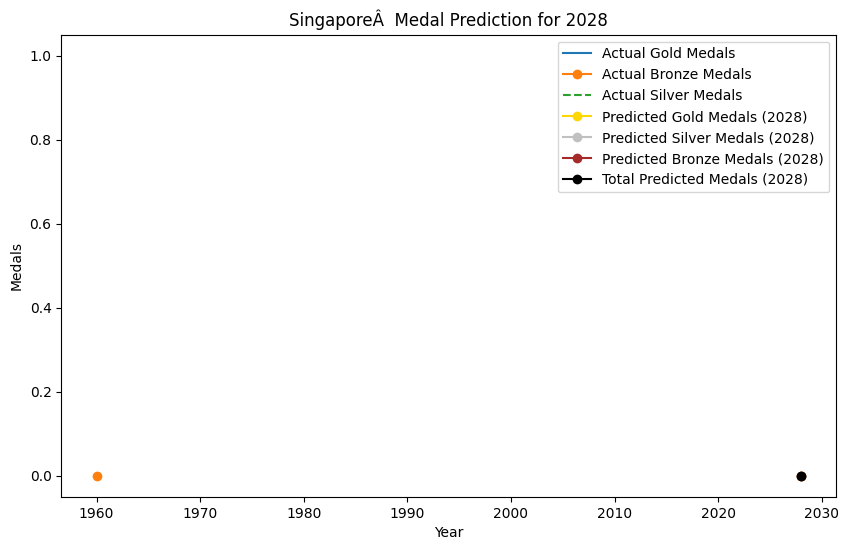

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported i

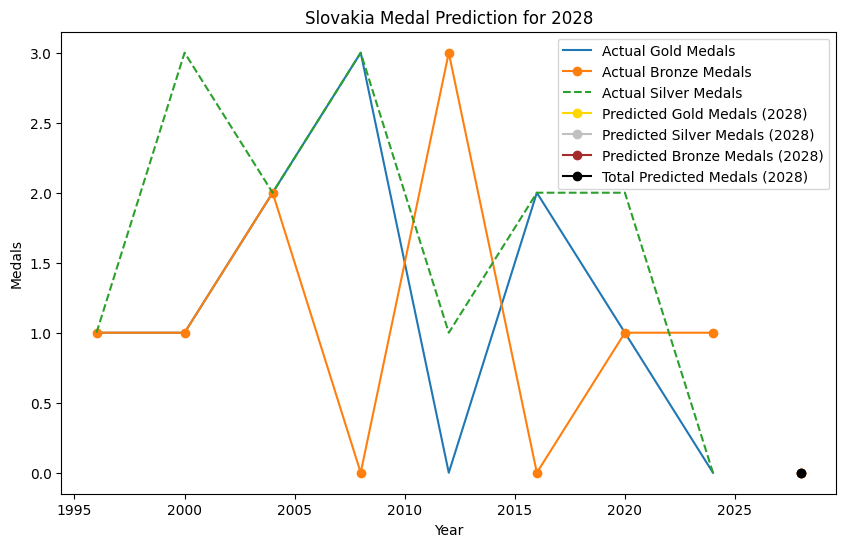

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

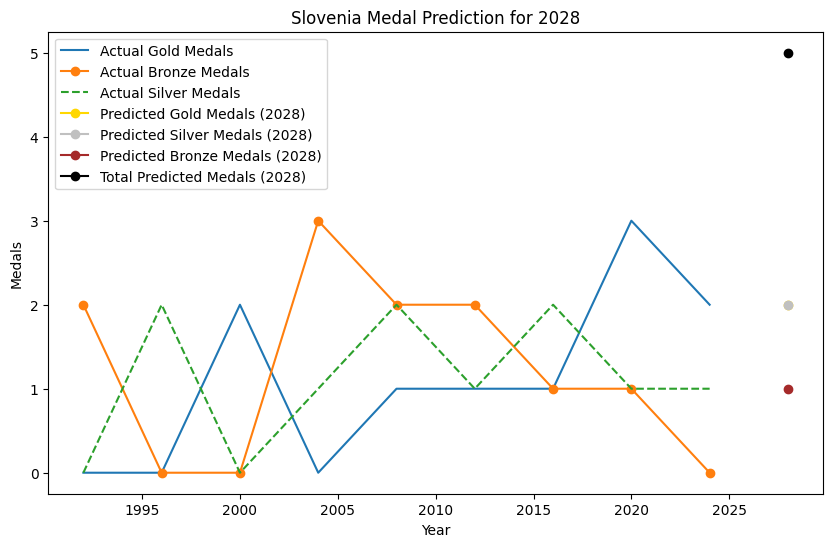

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

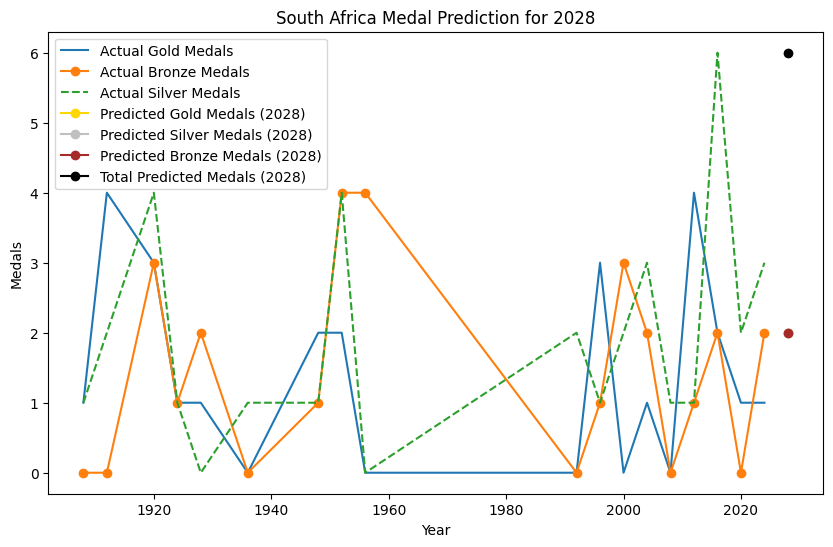

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

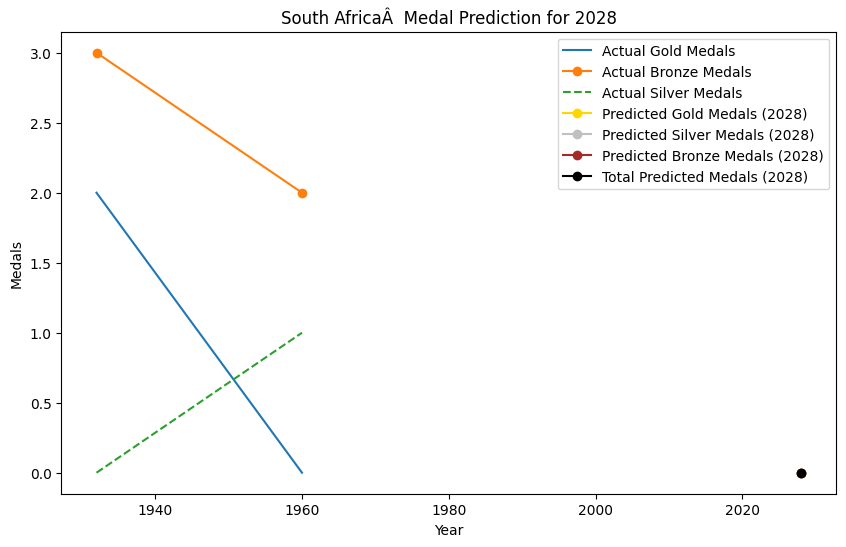

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

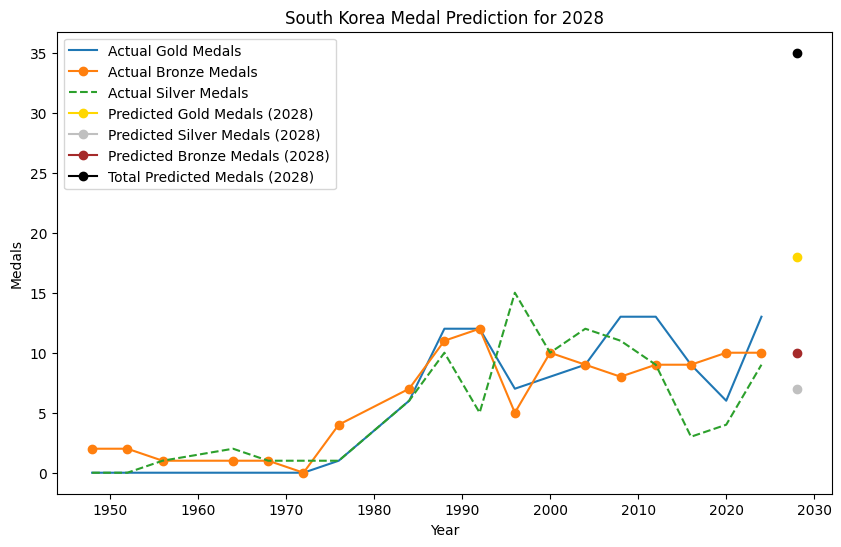

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: Convergenc

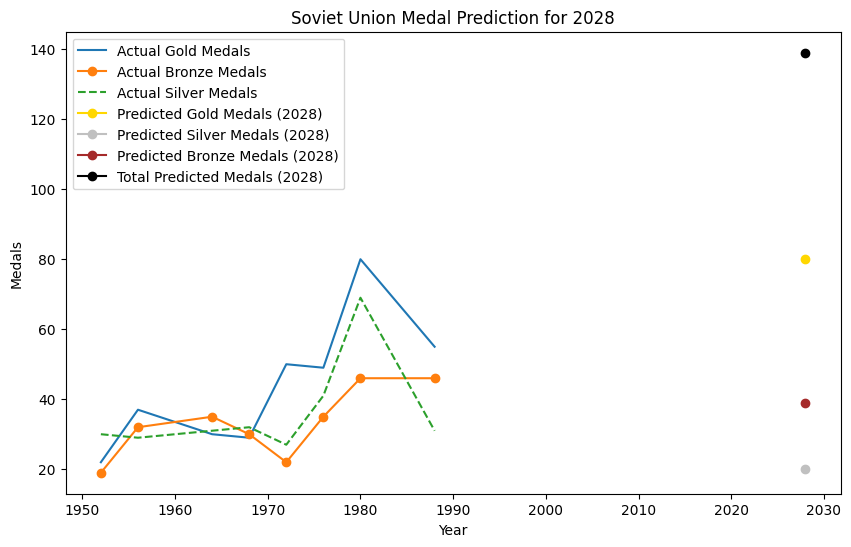

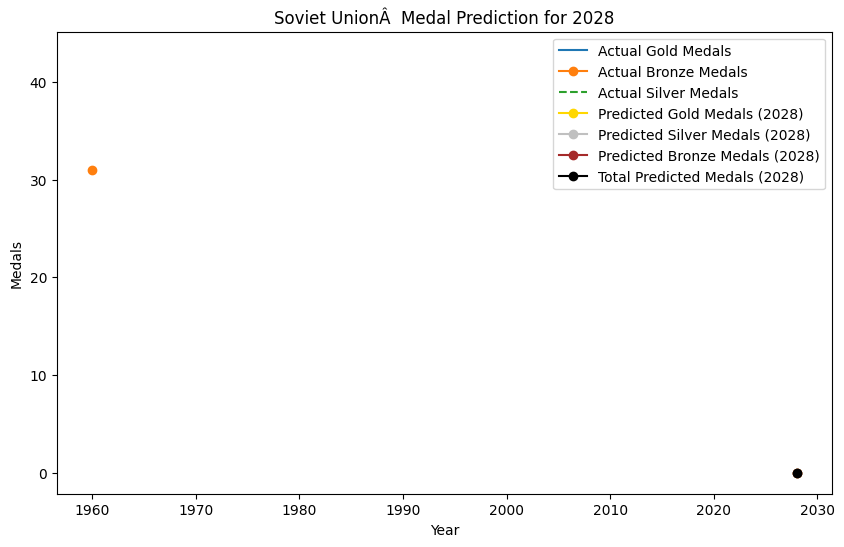

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

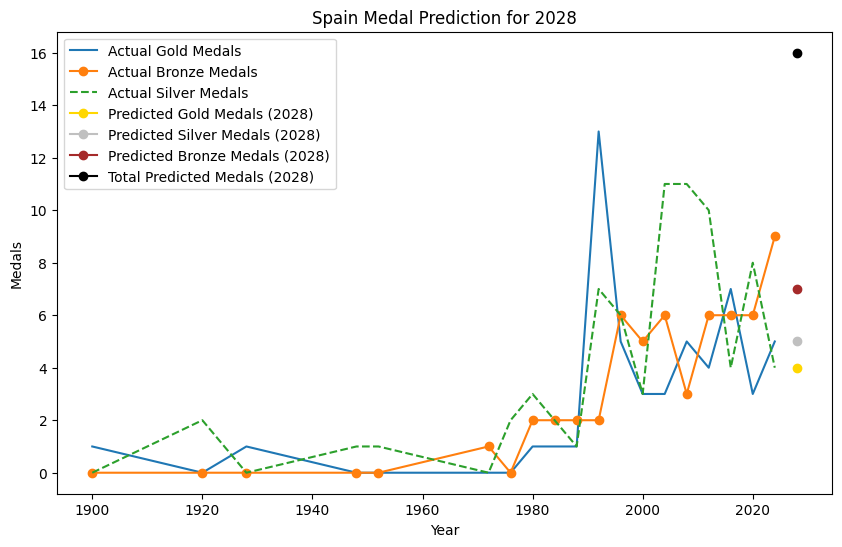

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

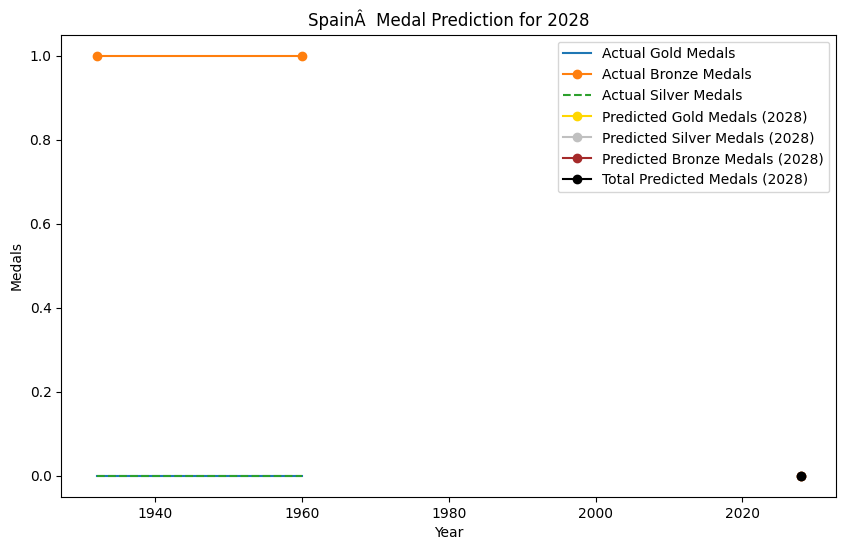

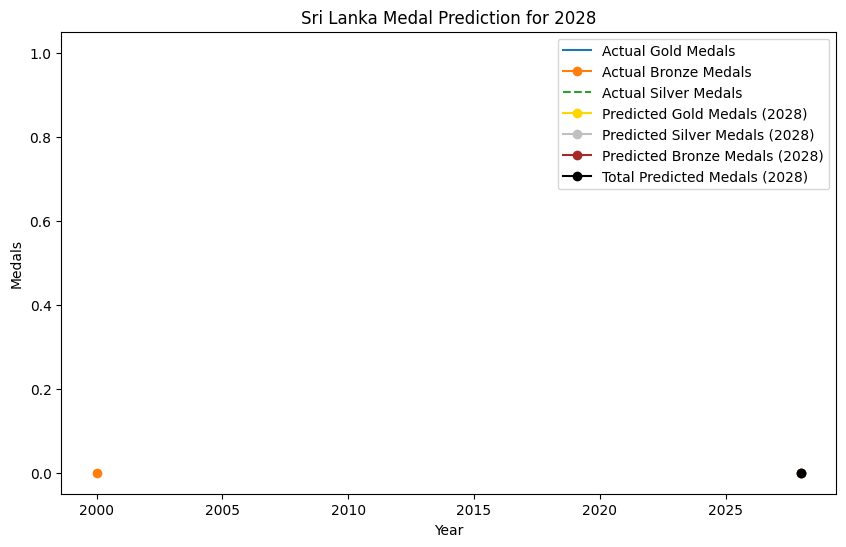

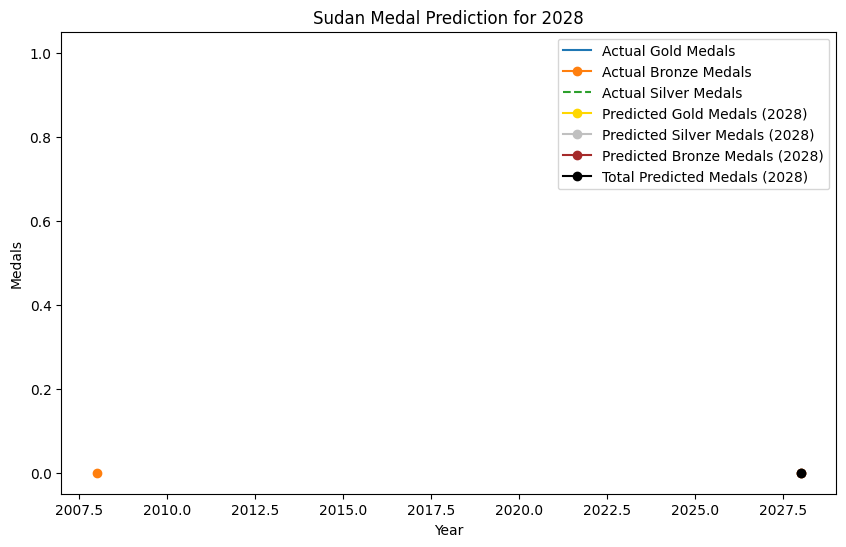

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

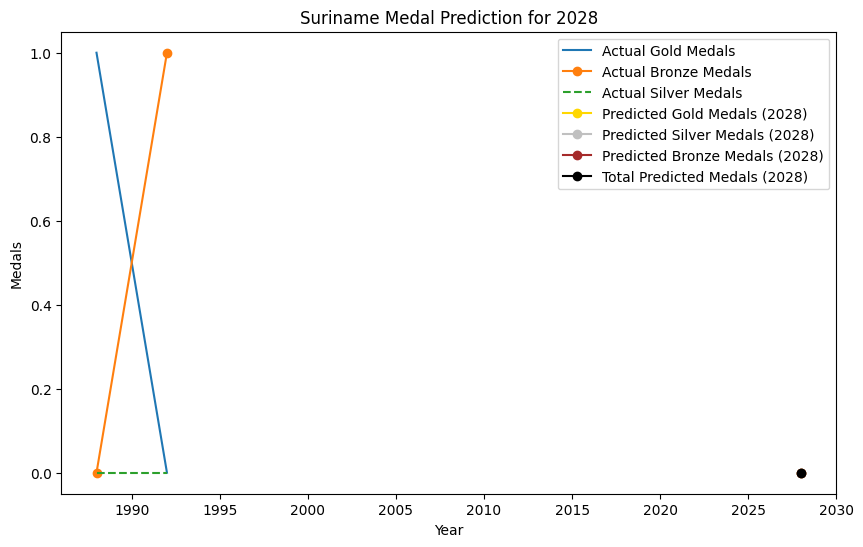

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

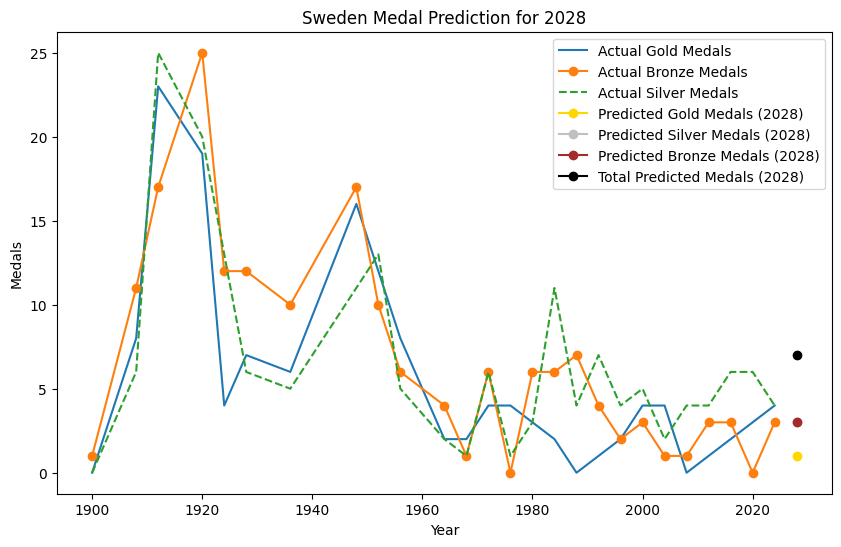

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

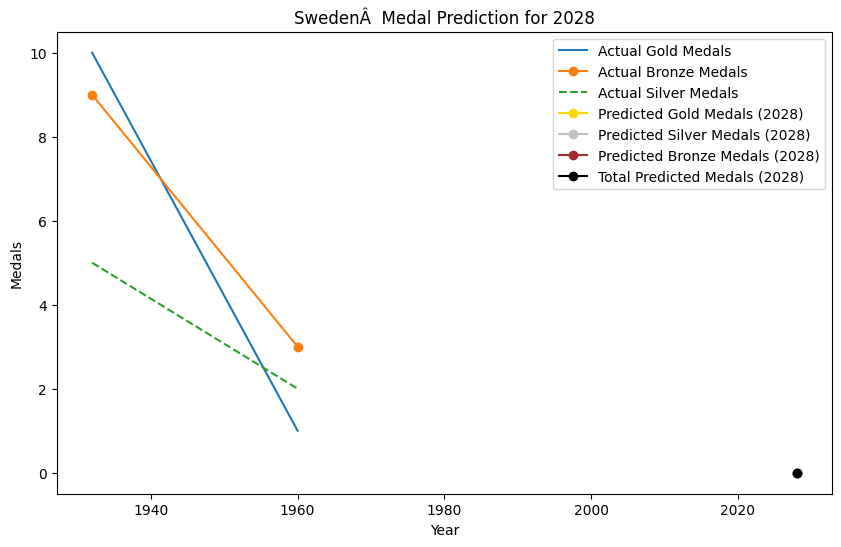

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

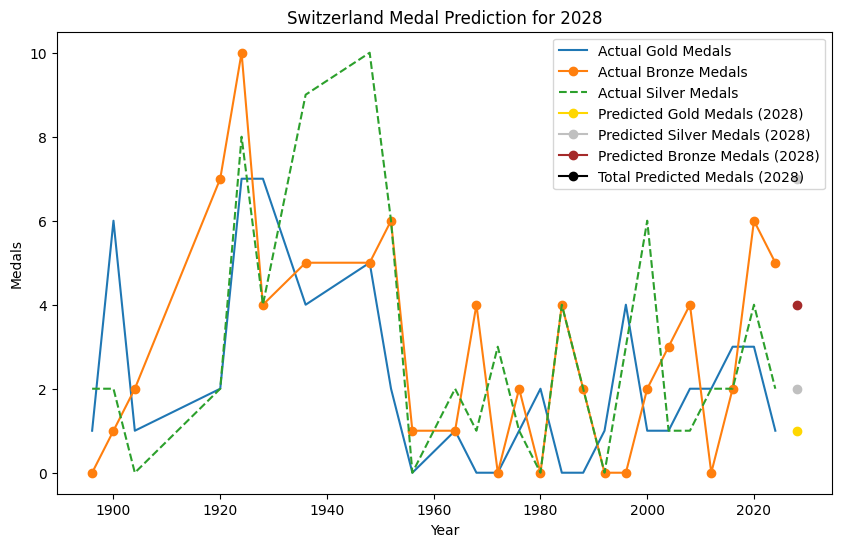

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

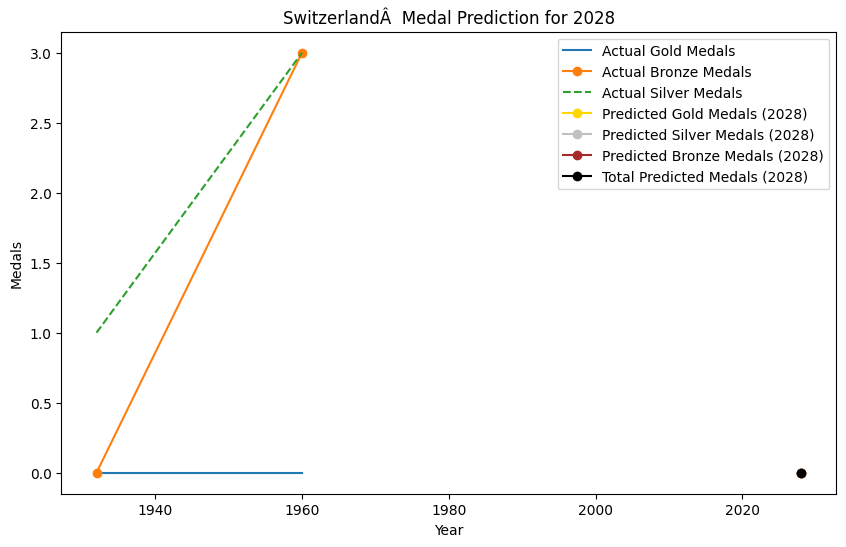

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

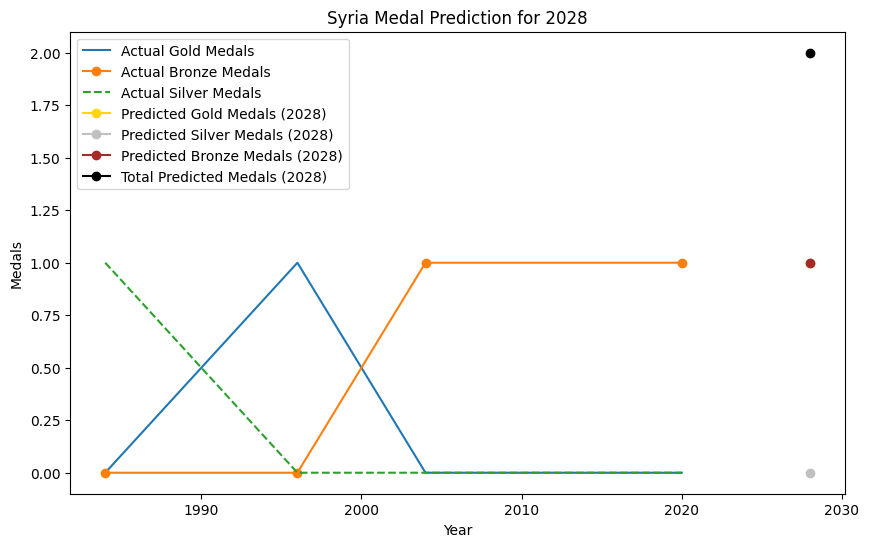

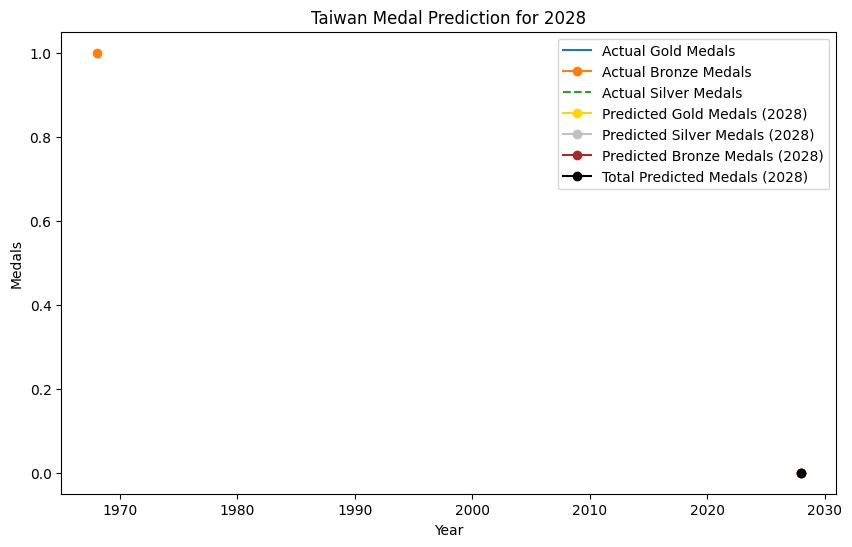

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

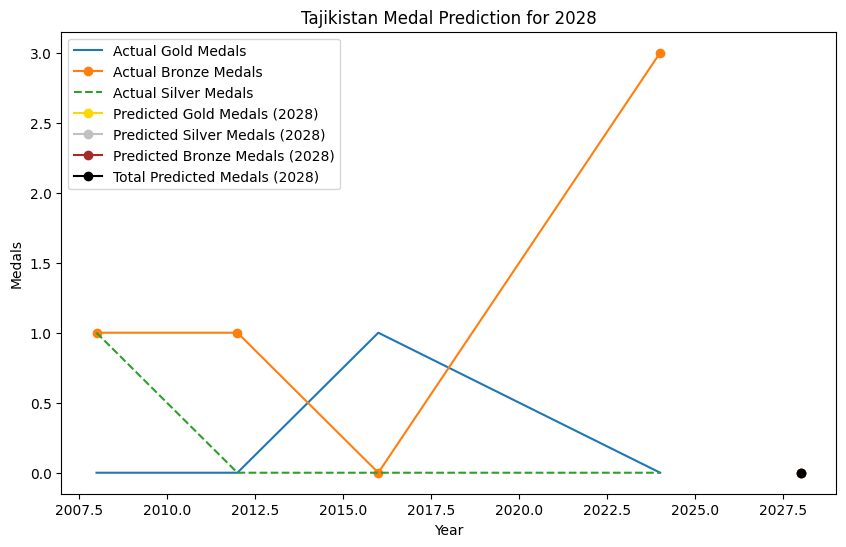

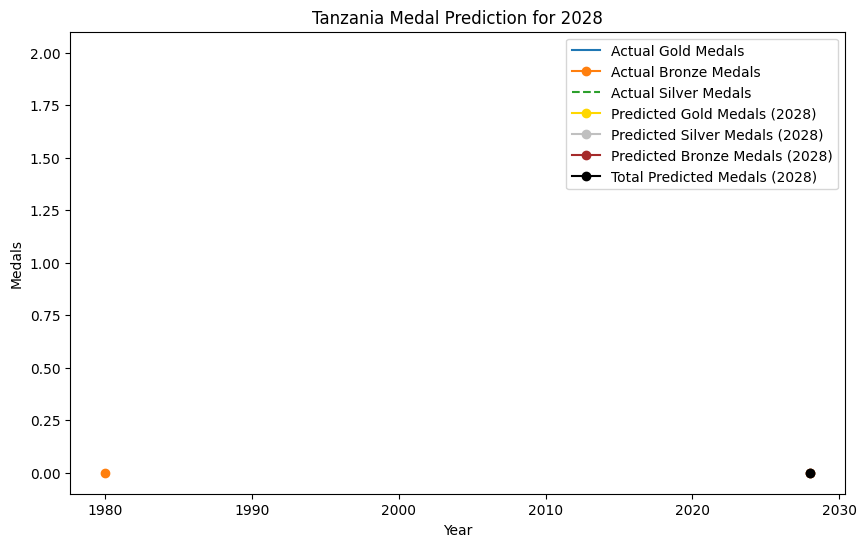

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

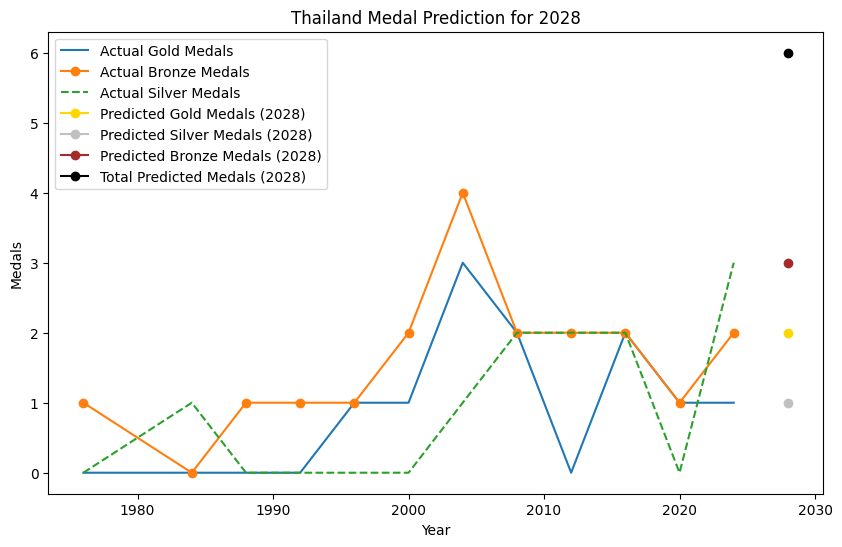

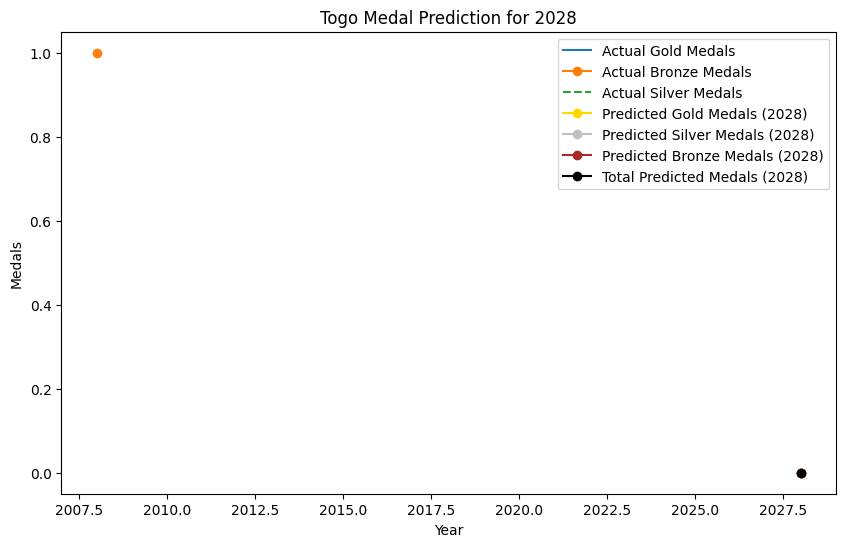

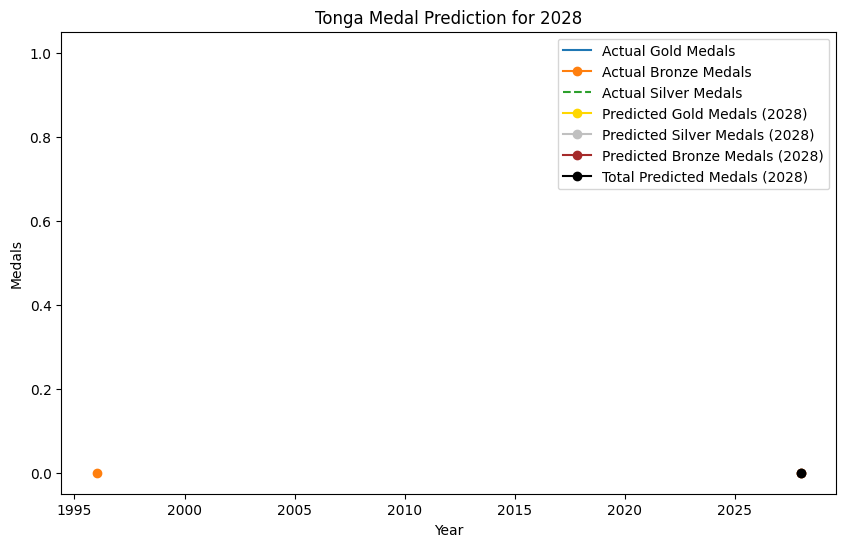

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

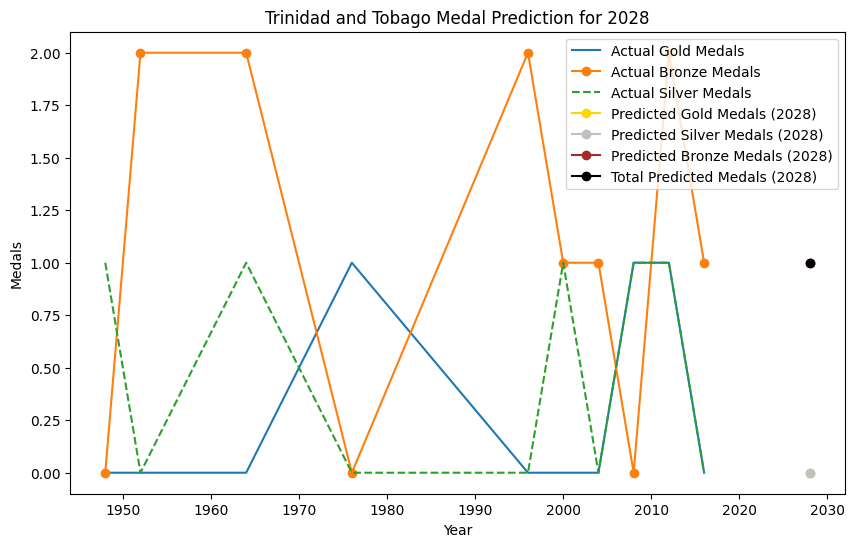

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

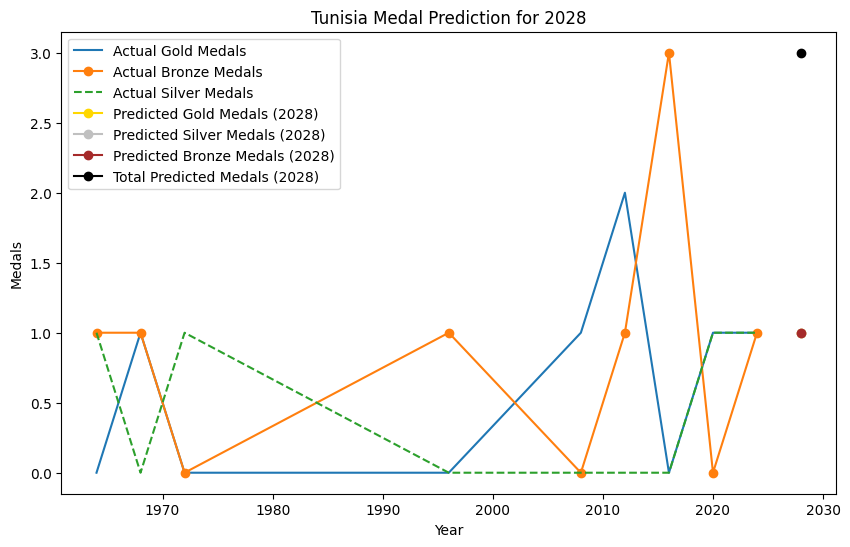

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

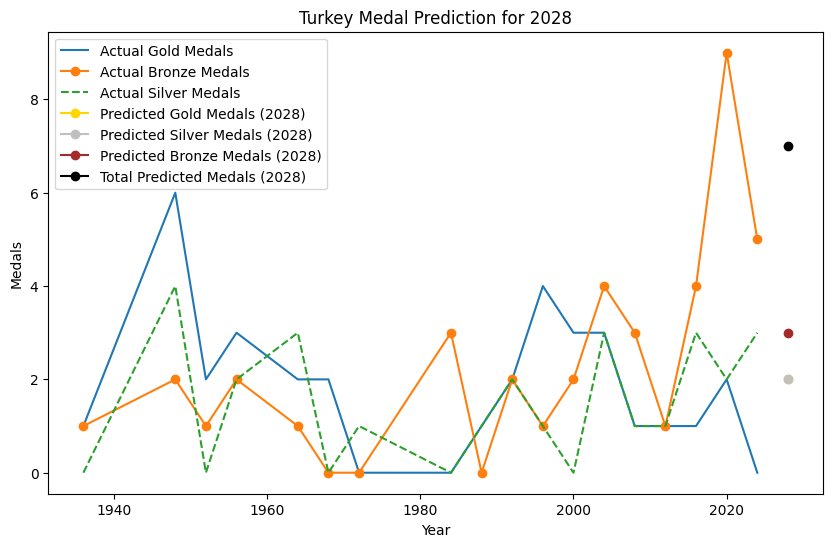

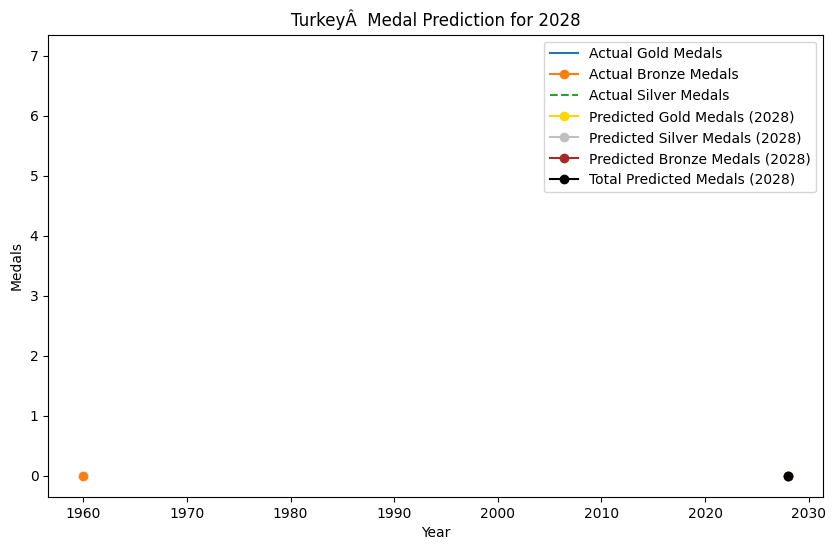

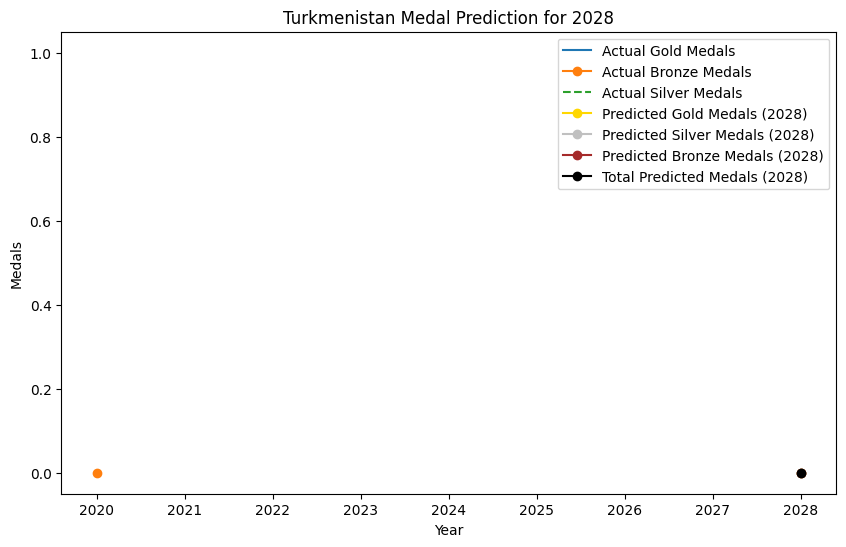

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

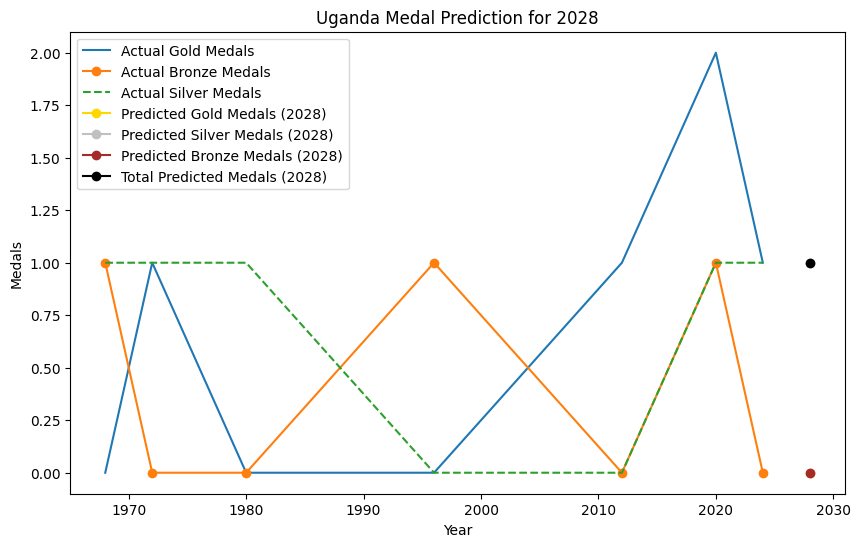

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

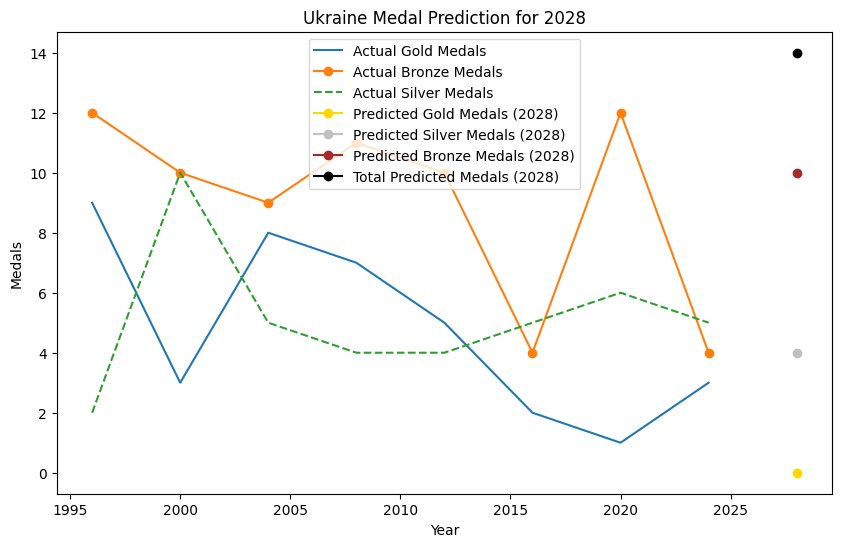

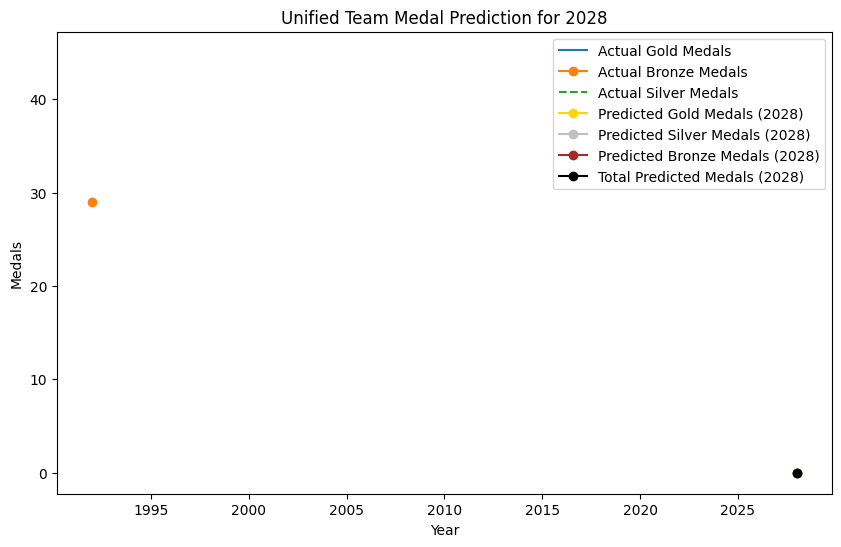

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

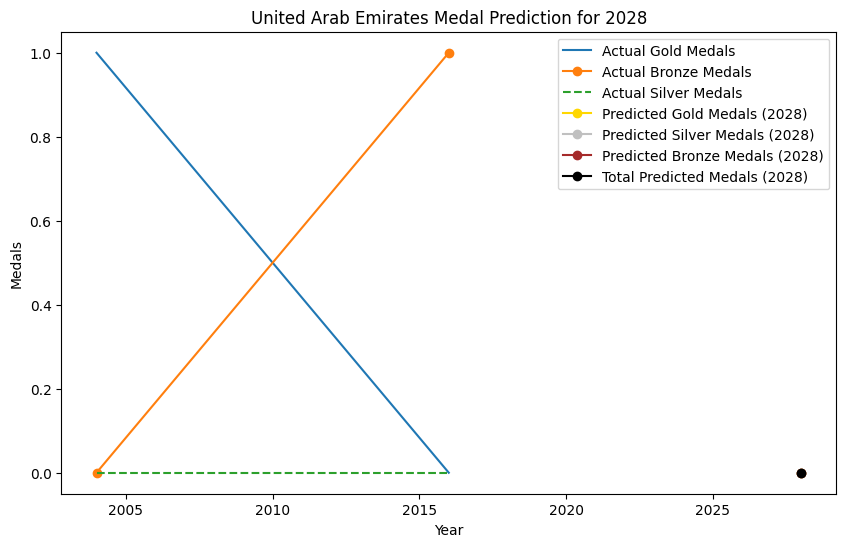

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

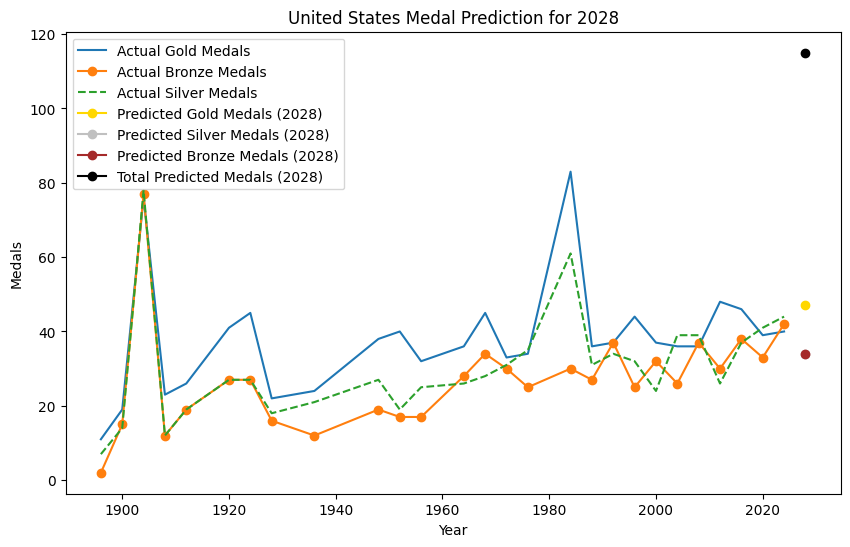

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

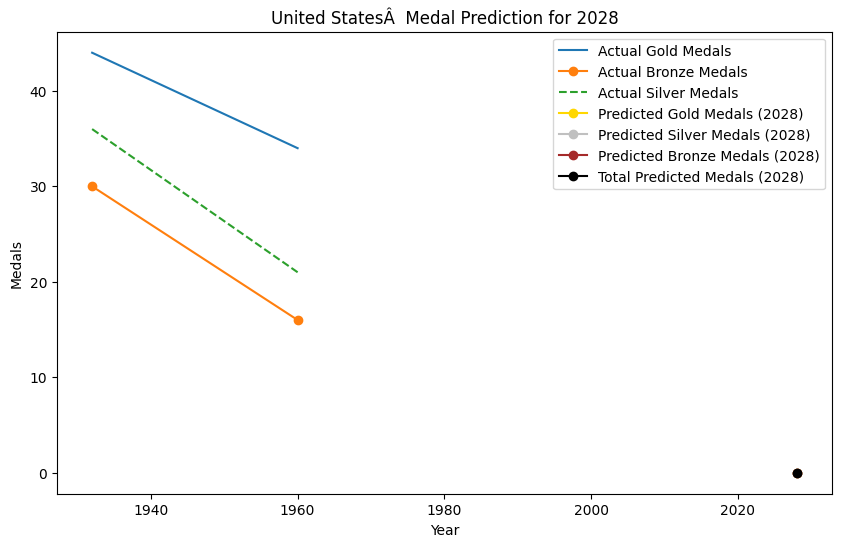

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided 

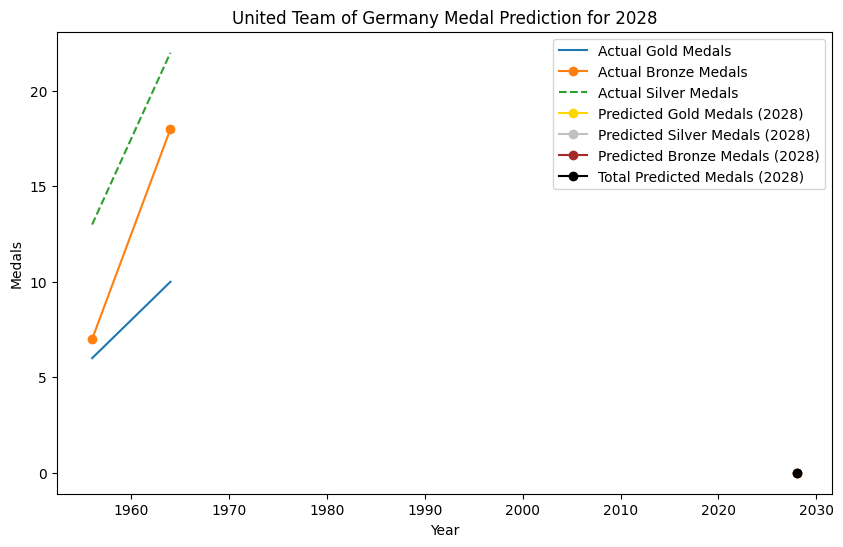

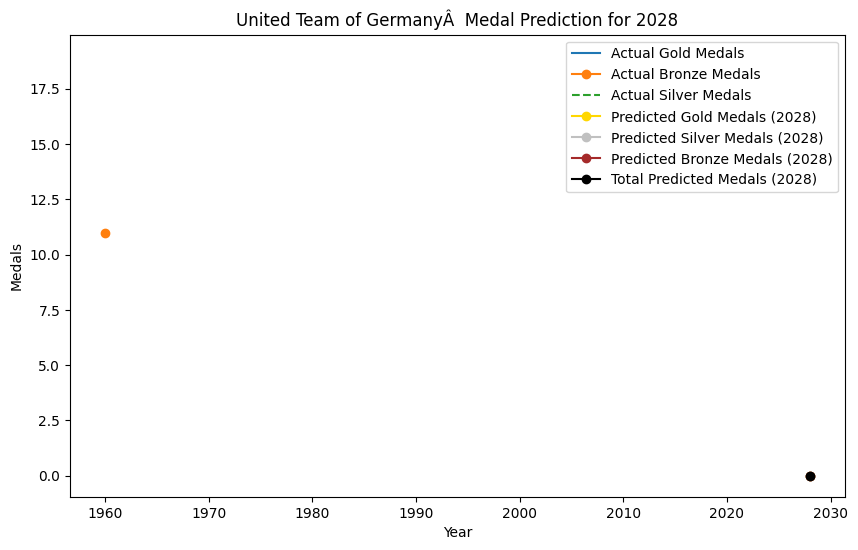

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

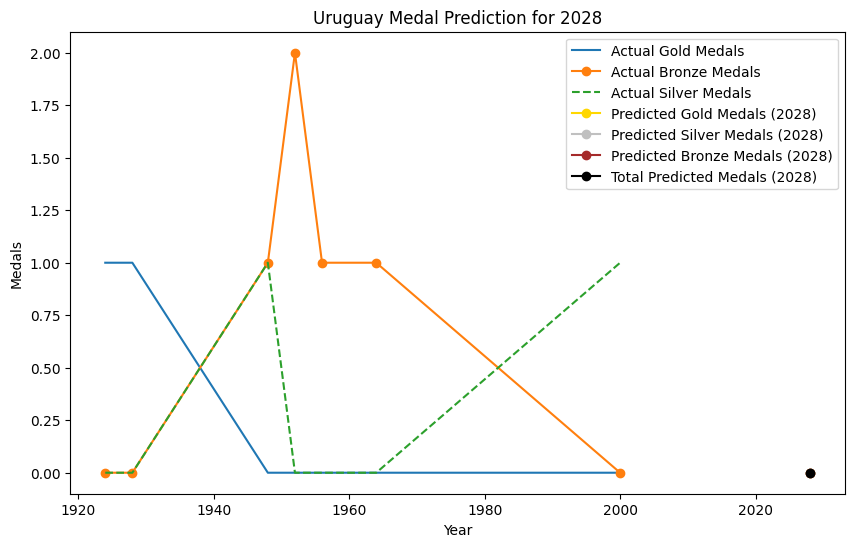

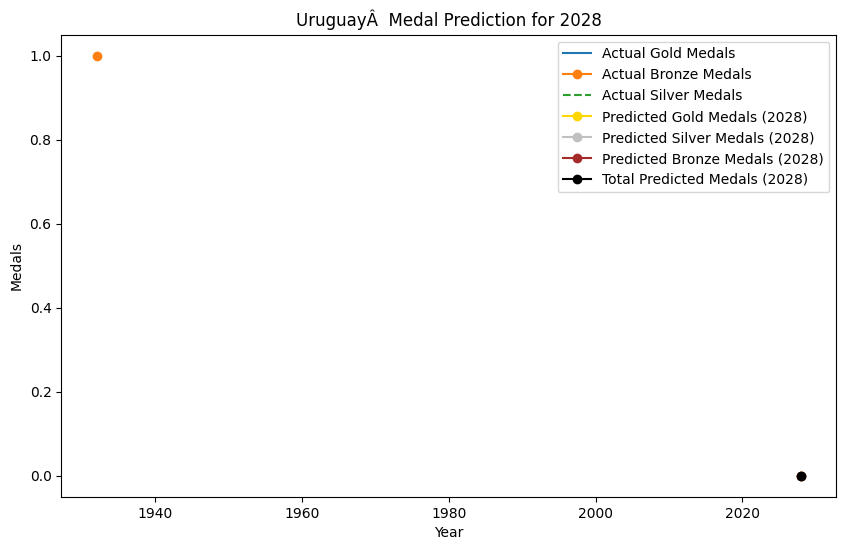

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: N

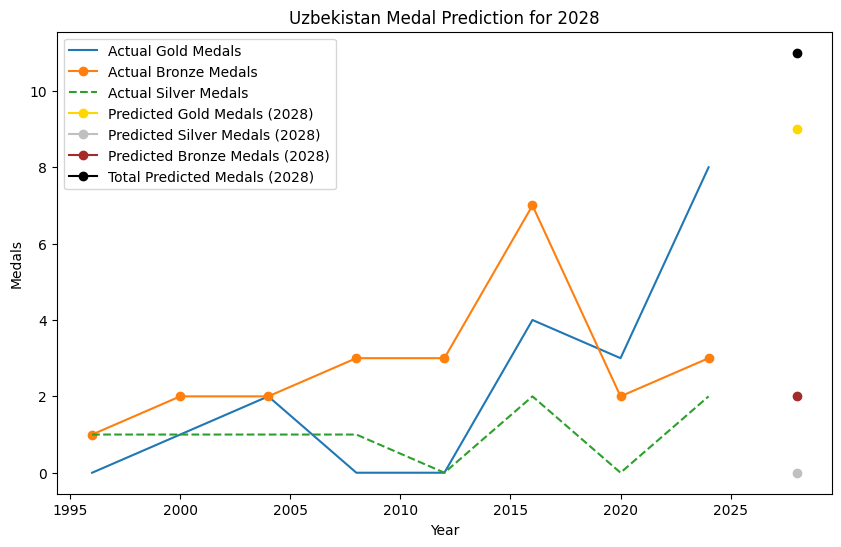

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\base\model.py:607: Convergenc

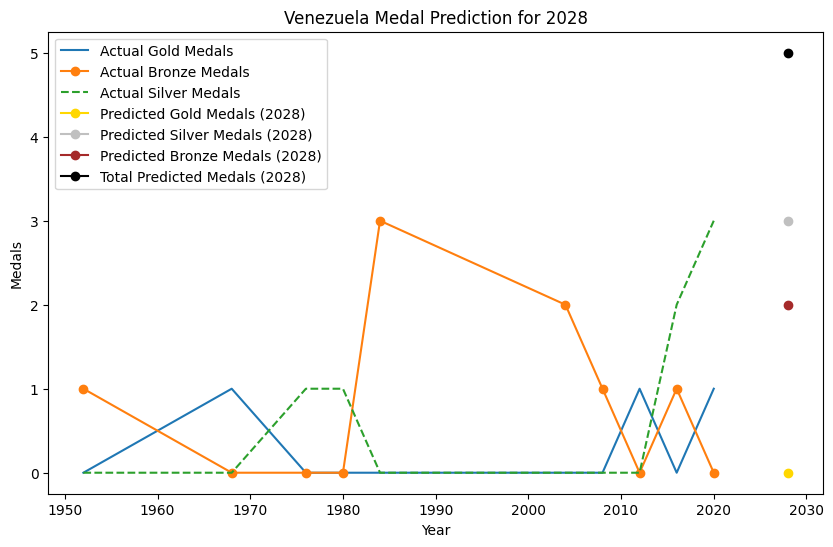

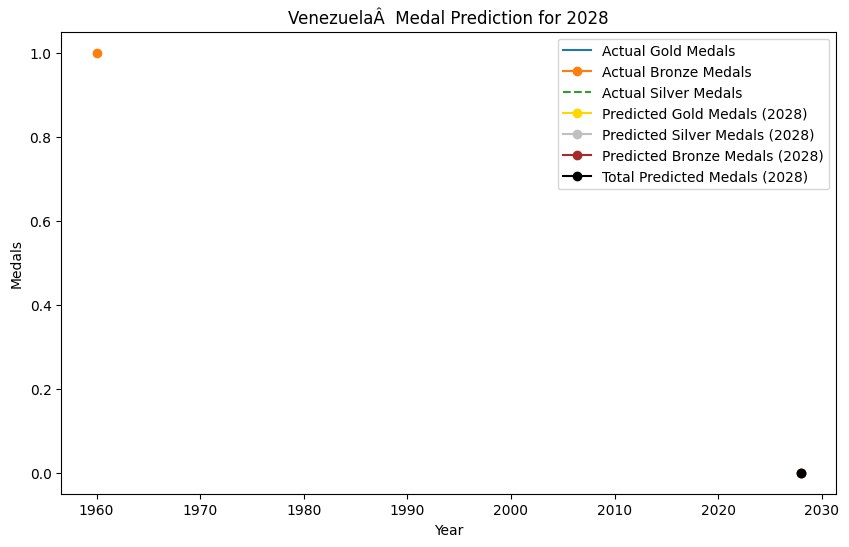

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

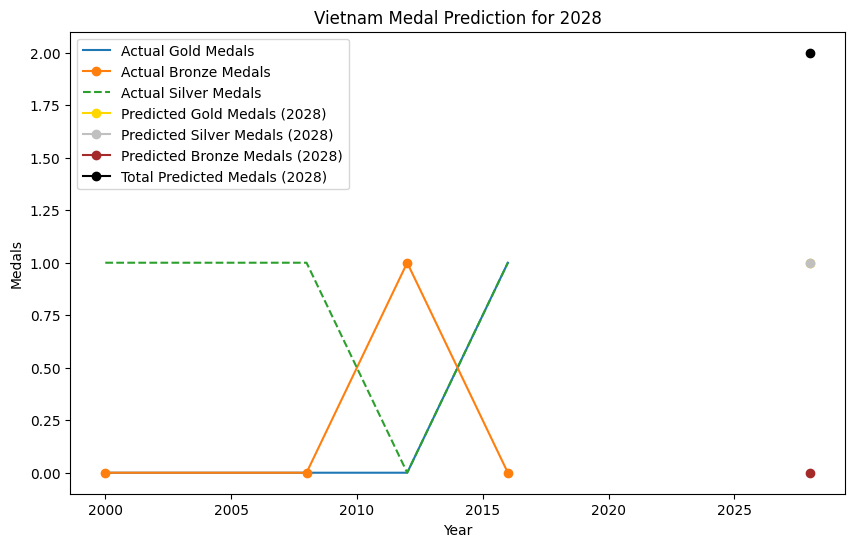

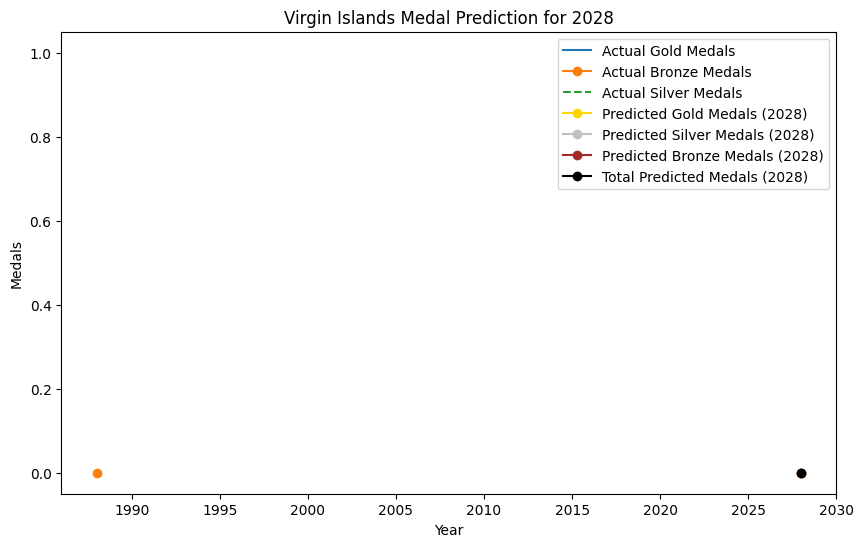

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

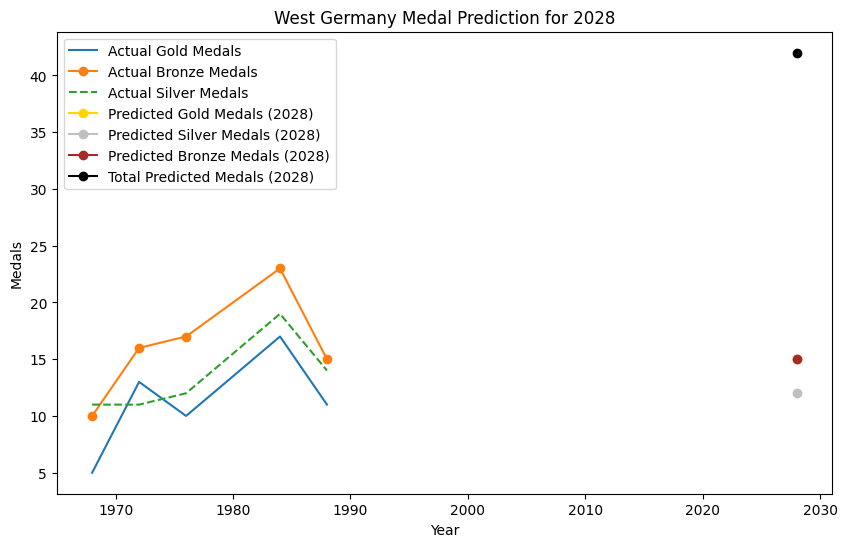

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: Va

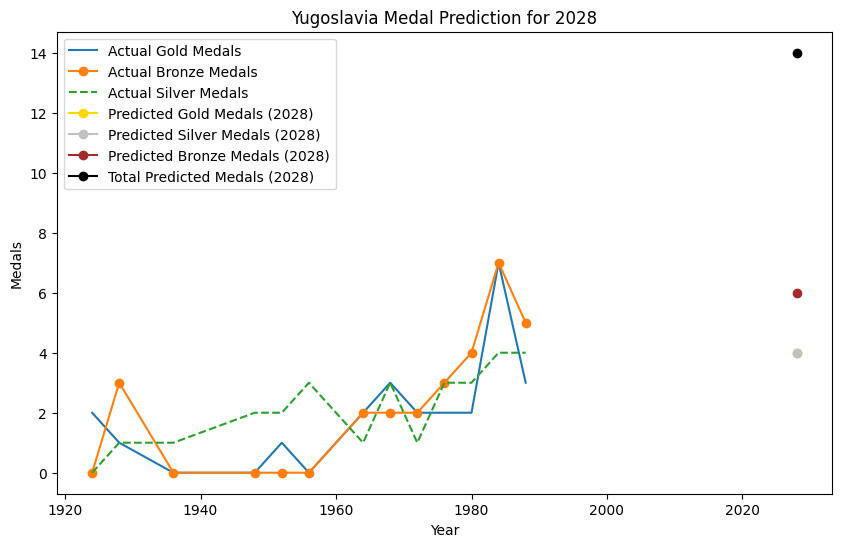

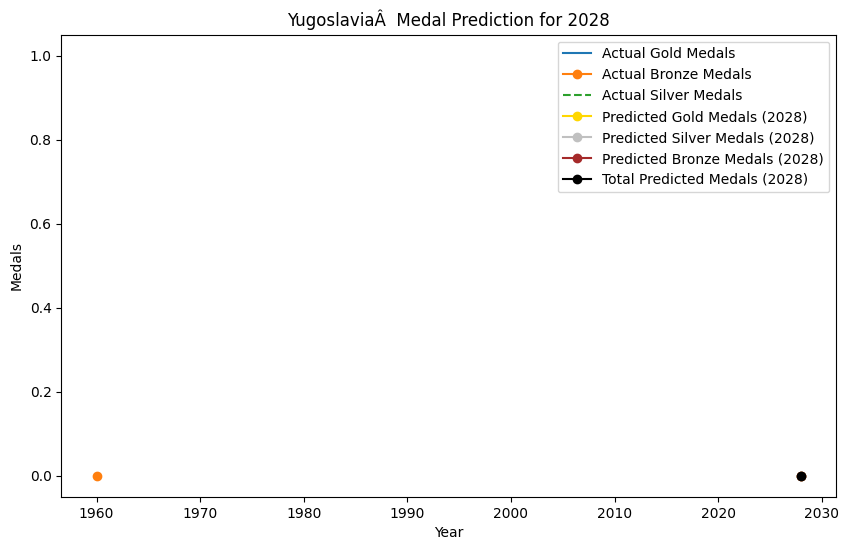

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

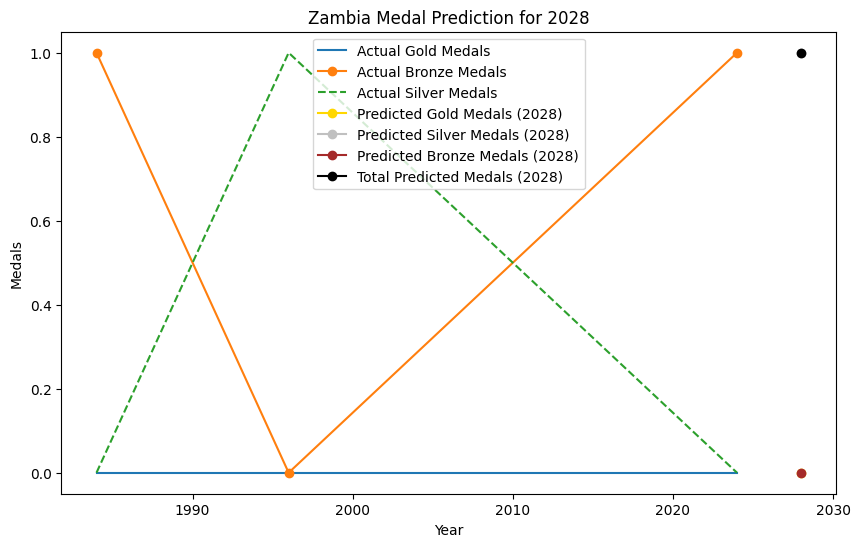

c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\alanz\.conda\envs\mcm2025\lib\site-packag

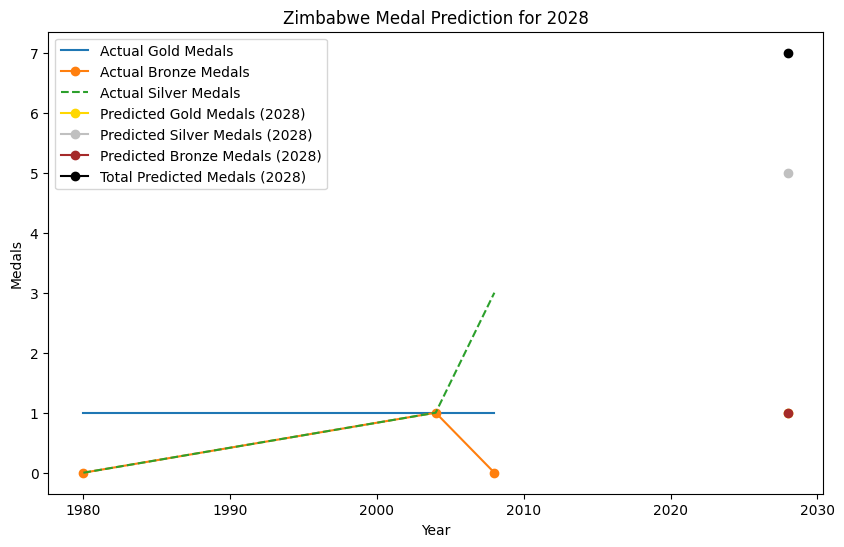

              NOC  Year Gold_Predicted Silver_Predicted Bronze_Predicted  \
0     Afghanistan  2028              0                0                0   
1         Albania  2028              0                0                0   
2         Algeria  2028              2                0                0   
3       Argentina  2028              1                1                2   
4     ArgentinaÂ   2028              0                0                0   
..            ...   ...            ...              ...              ...   
205  West Germany  2028             15               12               15   
206    Yugoslavia  2028              4                4                6   
207  YugoslaviaÂ   2028              0                0                0   
208        Zambia  2028              0                1                0   
209      Zimbabwe  2028              1                5                1   

    Total_Predicted  
0                 0  
1                 0  
2                 2  

In [30]:
# 定义函数用于处理数据缺失的国家
def safe_arima_forecast(data, steps, order=(5, 1, 0)):
    try:
        # 确保数据量足够并且没有缺失值
        if len(data) > 1:
            model = ARIMA(data, order=order)
            model_fit = model.fit()
            forecast = model_fit.forecast(steps=steps)
            return np.array([max(0, round(v)) for v in forecast])  # 确保预测值为正整数
        else:
            return np.array([0] * steps)  # 样本不足时返回全0
    except:
        return np.array([0] * steps)  # 捕获所有异常并返回全0

# 初始化预测年份和结果存储
future_years = [2028]
predictions = {}

# 对每个国家进行时序预测
for noc, group in grouped_by_noc:
    # 确保数据按年份排序
    group = group.sort_values(by='Year')
    
    # 选取金牌数、银牌数和铜牌数作为目标变量
    gold_data = group[['Year', 'Gold']].set_index('Year')
    silver_data = group[['Year', 'Silver']].set_index('Year')
    bronze_data = group[['Year', 'Bronze']].set_index('Year')
    
    # 删除任何缺失的年份数据
    gold_data = gold_data.dropna()
    silver_data = silver_data.dropna()
    bronze_data = bronze_data.dropna()

    # 预测每种奖牌的数量
    gold_forecast = safe_arima_forecast(gold_data, steps=len(future_years))
    silver_forecast = safe_arima_forecast(silver_data, steps=len(future_years))
    bronze_forecast = safe_arima_forecast(bronze_data, steps=len(future_years))

    # 计算总奖牌数
    total_forecast = gold_forecast + silver_forecast + bronze_forecast

    # 保存预测结果
    predictions[noc] = {
        'Year': future_years,
        'Gold_Predicted': gold_forecast,
        'Silver_Predicted': silver_forecast,
        'Bronze_Predicted': bronze_forecast,
        'Total_Predicted': total_forecast
    }
    # 可视化：将实际数据和预测数据一起显示
    plt.figure(figsize=(10, 6))
    
    plt.plot(gold_data.index, gold_data['Gold'], label='Actual Gold Medals')
    plt.plot(bronze_data.index, bronze_data['Bronze'], label='Actual Bronze Medals', marker='o')
    plt.plot(silver_data.index, silver_data['Silver'], label='Actual Silver Medals', linestyle='--')
    
    plt.plot(future_years, gold_forecast, label='Predicted Gold Medals (2028)', color='gold', marker='o')
    plt.plot(future_years, silver_forecast, label='Predicted Silver Medals (2028)', color='silver', marker='o')
    plt.plot(future_years, bronze_forecast, label='Predicted Bronze Medals (2028)', color='brown', marker='o')
    plt.plot(future_years, total_forecast, label='Total Predicted Medals (2028)', color='black', marker='o')

    plt.title(f'{noc} Medal Prediction for 2028')
    plt.xlabel('Year')
    plt.ylabel('Medals')
    plt.legend()
    plt.show()

# 将所有预测结果存储到一个DataFrame中
predictions_df = pd.DataFrame(columns=['NOC', 'Year', 'Gold_Predicted', 'Silver_Predicted', 'Bronze_Predicted', 'Total_Predicted'])
for noc, prediction in predictions.items():
    temp_df = pd.DataFrame({
        'NOC': [noc] * len(prediction['Year']),
        'Year': prediction['Year'],
        'Gold_Predicted': prediction['Gold_Predicted'],
        'Silver_Predicted': prediction['Silver_Predicted'],
        'Bronze_Predicted': prediction['Bronze_Predicted'],
        'Total_Predicted': prediction['Total_Predicted']
    })
    predictions_df = pd.concat([predictions_df, temp_df], ignore_index=True)

# 查看最终的预测结果
print(predictions_df)

# 如果需要将预测结果保存为CSV
# predictions_df.to_csv('predictions_2028_medals.csv', index=False)


In [29]:
predictions_df.to_excel('results_of_problem_1.xlsx', index=False)